<a href="https://colab.research.google.com/github/ENKI0311/UNSW-NB15_Dataset/blob/main/UNSW_NB15_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# UNSW-NB15 Dataset

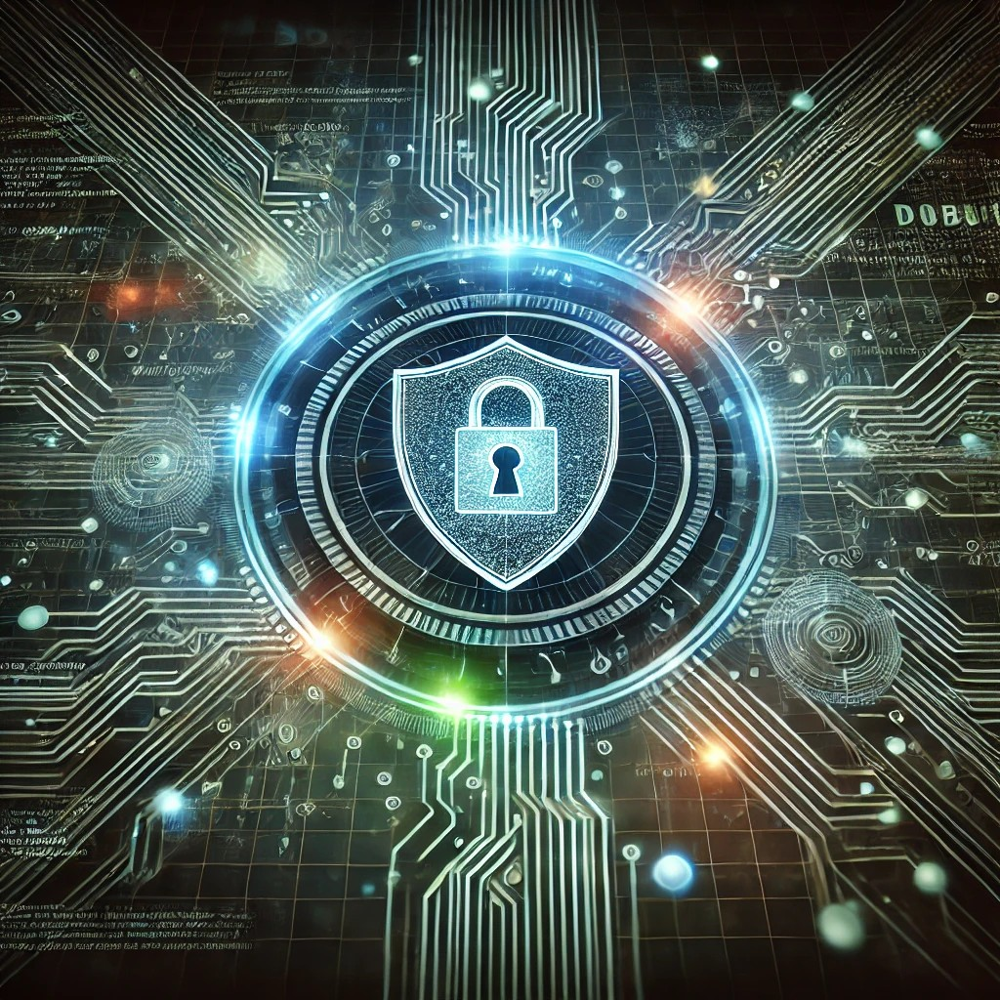

## The UNSW-NB15 data set description:

The raw network packets of the UNSW-NB 15 data set is created by the IXIA PerfectStorm tool in the Cyber Range Lab, UNSW Canberra for generating a hybrid of real modern normal activities and synthetic contemporary attack behaviours. Tcpdump tool is utilised to capture 100 GB of the raw traffic (e.g., Pcap files). This data set has nine families of attacks, namely, Fuzzers, Analysis, Backdoors, DoS, Exploits, Generic, Reconnaissance, Shellcode and Worms. The Argus, Bro-IDS tools are utilised and twelve algorithms are developed to generate totally 49 features with the class label. These features are described in UNSW-NB15_freatures.csv file. The total number of records is two millions and 540,044 which are stored in the four CSV files, namely, UNSW-NB15_1.csv, UNSW-NB15_1.csv, UNSW-NB15_1.csv and UNSW-NB15_1.csv. The ground truth table is named UNSW-NB15_GT.CSV and the list of event file is called UNSW-NB15_LIST_EVENTS. A partition from this data set is configured as a training set and testing set, namely, UNSW_NB15_training-set.csv and UNSW_NB15_testing-set respectively. The number of records in the training set is 175,341 records and the testing set is 82,332 records from different the types of attack and normal. For more information or requested the Pcap files of the data set, please contact the authors:
1.Nour Moustafa: e-mail (nour.moustafa@unsw.edu.au, nour.moustafa@ieee.org)



https://research.unsw.edu.au/projects/unsw-nb15-dataset



---



### By: John Chilton

# Load Libraries

# Connect Google Drive

In [74]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
import warnings
warnings.filterwarnings("ignore")

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Load the DataSets

In [3]:
df_test = pd.read_csv('/content/drive/MyDrive/lab_mount/UNSW-NB15 Dataset/UNSW_NB15_testing-set.csv')
df_train = pd.read_csv('/content/drive/MyDrive/lab_mount/UNSW-NB15 Dataset/UNSW_NB15_training-set.csv')



*   Observation
*   Sanity Checks
*   EDA



# df_test

In [5]:
df_test.head(10)

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.000011,udp,-,INT,2,0,496,0,90909.09020,...,1,2,0,0,0,1,2,0,Normal,0
1,2,0.000008,udp,-,INT,2,0,1762,0,125000.00030,...,1,2,0,0,0,1,2,0,Normal,0
2,3,0.000005,udp,-,INT,2,0,1068,0,200000.00510,...,1,3,0,0,0,1,3,0,Normal,0
3,4,0.000006,udp,-,INT,2,0,900,0,166666.66080,...,1,3,0,0,0,2,3,0,Normal,0
4,5,0.000010,udp,-,INT,2,0,2126,0,100000.00250,...,1,3,0,0,0,2,3,0,Normal,0
5,6,0.000003,udp,-,INT,2,0,784,0,333333.32150,...,1,2,0,0,0,2,2,0,Normal,0
6,7,0.000006,udp,-,INT,2,0,1960,0,166666.66080,...,1,2,0,0,0,2,2,0,Normal,0
7,8,0.000028,udp,-,INT,2,0,1384,0,35714.28522,...,1,3,0,0,0,1,3,0,Normal,0
8,9,0.000000,arp,-,INT,1,0,46,0,0.00000,...,2,2,0,0,0,2,2,1,Normal,0
9,10,0.000000,arp,-,INT,1,0,46,0,0.00000,...,2,2,0,0,0,2,2,1,Normal,0


In [6]:
df_test.tail(10)

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
82322,82323,0.000004,udp,-,INT,2,0,104,0,250000.000600,...,1,1,0,0,0,1,1,0,Normal,0
82323,82324,5.167410,tcp,-,FIN,108,24,138067,1042,25.351192,...,1,1,0,0,0,1,3,0,Normal,0
82324,82325,0.000006,udp,-,INT,2,0,104,0,166666.660800,...,1,2,0,0,0,1,2,0,Normal,0
82325,82326,0.000010,udp,-,INT,2,0,104,0,100000.002500,...,1,2,0,0,0,1,2,0,Normal,0
82326,82327,0.000009,udp,-,INT,2,0,104,0,111111.107200,...,1,1,0,0,0,1,1,0,Normal,0
82327,82328,0.000005,udp,-,INT,2,0,104,0,200000.005100,...,1,2,0,0,0,2,1,0,Normal,0
82328,82329,1.106101,tcp,-,FIN,20,8,18062,354,24.410067,...,1,1,0,0,0,3,2,0,Normal,0
82329,82330,0.000000,arp,-,INT,1,0,46,0,0.000000,...,1,1,0,0,0,1,1,1,Normal,0
82330,82331,0.000000,arp,-,INT,1,0,46,0,0.000000,...,1,1,0,0,0,1,1,1,Normal,0
82331,82332,0.000009,udp,-,INT,2,0,104,0,111111.107200,...,1,1,0,0,0,1,1,0,Normal,0


In [7]:
df_test.shape

(82332, 45)

In [8]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82332 entries, 0 to 82331
Data columns (total 45 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 82332 non-null  int64  
 1   dur                82332 non-null  float64
 2   proto              82332 non-null  object 
 3   service            82332 non-null  object 
 4   state              82332 non-null  object 
 5   spkts              82332 non-null  int64  
 6   dpkts              82332 non-null  int64  
 7   sbytes             82332 non-null  int64  
 8   dbytes             82332 non-null  int64  
 9   rate               82332 non-null  float64
 10  sttl               82332 non-null  int64  
 11  dttl               82332 non-null  int64  
 12  sload              82332 non-null  float64
 13  dload              82332 non-null  float64
 14  sloss              82332 non-null  int64  
 15  dloss              82332 non-null  int64  
 16  sinpkt             823

In [9]:
df_test.describe()

,id,dur,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,...,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,label
count,82332.000000,82332.000000,82332.000000,82332.000000,8.233200e+04,8.233200e+04,8.233200e+04,82332.000000,82332.000000,8.233200e+04,...,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000,82332.000000
mean,41166.500000,1.006756,18.666472,17.545936,7.993908e+03,1.323379e+04,8.241089e+04,180.967667,95.713003,6.454902e+07,...,4.928898,3.663011,7.456360,0.008284,0.008381,0.129743,6.468360,9.164262,0.011126,0.550600
std,23767.345519,4.710444,133.916353,115.574086,1.716423e+05,1.514715e+05,1.486204e+05,101.513358,116.667722,1.798618e+08,...,8.389545,5.915386,11.415191,0.091171,0.092485,0.638683,8.543927,11.121413,0.104891,0.497436
min,1.000000,0.000000,1.000000,0.000000,2.400000e+01,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
25%,20583.750000,0.000008,2.000000,0.000000,1.140000e+02,0.000000e+00,2.860611e+01,62.000000,0.000000,1.120247e+04,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.000000
50%,41166.500000,0.014138,6.000000,2.000000,5.340000e+02,1.780000e+02,2.650177e+03,254.000000,29.000000,5.770032e+05,...,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,3.000000,5.000000,0.000000,1.000000
75%,61749.250000,0.719360,12.000000,10.000000,1.280000e+03,9.560000e+02,1.111111e+05,254.000000,252.000000,6.514286e+07,...,4.000000,3.000000,6.000000,0.000000,0.000000,0.000000,7.000000,11.000000,0.000000,1.000000
max,82332.000000,59.999989,10646.000000,11018.000000,1.435577e+07,1.465753e+07,1.000000e+06,255.000000,253.000000,5.268000e+09,...,59.000000,38.000000,63.000000,2.000000,2.000000,16.000000,60.000000,62.000000,1.000000,1.000000


In [10]:
df_test.isnull().sum()

,0
id,0
dur,0
proto,0
service,0
state,0
spkts,0
dpkts,0
sbytes,0
dbytes,0
rate,0


In [11]:
df_test.duplicated().sum()

0

In [25]:
df_test.nunique()

,0
id,82332
dur,39888
proto,131
service,13
state,7
spkts,420
dpkts,436
sbytes,4489
dbytes,4034
rate,40616


In [26]:
df_test.columns

Index(['id', 'dur', 'proto', 'service', 'state', 'spkts', 'dpkts', 'sbytes',
       'dbytes', 'rate', 'sttl', 'dttl', 'sload', 'dload', 'sloss', 'dloss',
       'sinpkt', 'dinpkt', 'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin',
       'tcprtt', 'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
       'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm',
       'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm',
       'ct_srv_dst', 'is_sm_ips_ports', 'attack_cat', 'label'],
      dtype='object')

In [27]:
df_test.dtypes

,0
id,int64
dur,float64
proto,object
service,object
state,object
spkts,int64
dpkts,int64
sbytes,int64
dbytes,int64
rate,float64


In [28]:
df_test.attack_cat.unique()

array(['Normal', 'Reconnaissance', 'Backdoor', 'DoS', 'Exploits',
       'Analysis', 'Fuzzers', 'Worms', 'Shellcode', 'Generic'],
      dtype=object)

In [29]:
df_test.attack_cat.value_counts()

,count
attack_cat,
Normal,37000
Generic,18871
Exploits,11132
Fuzzers,6062
DoS,4089
Reconnaissance,3496
Analysis,677
Backdoor,583
Shellcode,378


In [30]:
df_test.proto.unique()

array(['udp', 'arp', 'tcp', 'igmp', 'ospf', 'sctp', 'gre', 'ggp', 'ip',
       'ipnip', 'st2', 'argus', 'chaos', 'egp', 'emcon', 'nvp', 'pup',
       'xnet', 'mux', 'dcn', 'hmp', 'prm', 'trunk-1', 'trunk-2',
       'xns-idp', 'leaf-1', 'leaf-2', 'irtp', 'rdp', 'netblt', 'mfe-nsp',
       'merit-inp', '3pc', 'idpr', 'ddp', 'idpr-cmtp', 'tp++', 'ipv6',
       'sdrp', 'ipv6-frag', 'ipv6-route', 'idrp', 'mhrp', 'i-nlsp', 'rvd',
       'mobile', 'narp', 'skip', 'tlsp', 'ipv6-no', 'any', 'ipv6-opts',
       'cftp', 'sat-expak', 'ippc', 'kryptolan', 'sat-mon', 'cpnx', 'wsn',
       'pvp', 'br-sat-mon', 'sun-nd', 'wb-mon', 'vmtp', 'ttp', 'vines',
       'nsfnet-igp', 'dgp', 'eigrp', 'tcf', 'sprite-rpc', 'larp', 'mtp',
       'ax.25', 'ipip', 'aes-sp3-d', 'micp', 'encap', 'pri-enc', 'gmtp',
       'ifmp', 'pnni', 'qnx', 'scps', 'cbt', 'bbn-rcc', 'igp', 'bna',
       'swipe', 'visa', 'ipcv', 'cphb', 'iso-tp4', 'wb-expak', 'sep',
       'secure-vmtp', 'xtp', 'il', 'rsvp', 'unas', 'fc', 'iso-ip',


In [31]:
df_test.proto.value_counts()

,count
proto,
tcp,43095
udp,29418
unas,3515
arp,987
ospf,676
...,...
br-sat-mon,32
pvp,32
wsn,32


In [32]:
df_test.state.unique()

array(['INT', 'FIN', 'REQ', 'ACC', 'CON', 'RST', 'CLO'], dtype=object)

In [33]:
df_test.state.value_counts()

,count
state,
FIN,39339
INT,34163
CON,6982
REQ,1842
ACC,4
RST,1
CLO,1


In [34]:
df_test.service.unique()

array(['-', 'http', 'ftp', 'ftp-data', 'smtp', 'pop3', 'dns', 'snmp',
       'ssl', 'dhcp', 'irc', 'radius', 'ssh'], dtype=object)

In [35]:
df_test.service.value_counts()

,count
service,
-,47153
dns,21367
http,8287
smtp,1851
ftp,1552
ftp-data,1396
pop3,423
ssh,204
ssl,30


In [38]:
df_test

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.000011,udp,-,INT,2,0,496,0,90909.090200,...,1,2,0,0,0,1,2,0,Normal,0
1,2,0.000008,udp,-,INT,2,0,1762,0,125000.000300,...,1,2,0,0,0,1,2,0,Normal,0
2,3,0.000005,udp,-,INT,2,0,1068,0,200000.005100,...,1,3,0,0,0,1,3,0,Normal,0
3,4,0.000006,udp,-,INT,2,0,900,0,166666.660800,...,1,3,0,0,0,2,3,0,Normal,0
4,5,0.000010,udp,-,INT,2,0,2126,0,100000.002500,...,1,3,0,0,0,2,3,0,Normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82327,82328,0.000005,udp,-,INT,2,0,104,0,200000.005100,...,1,2,0,0,0,2,1,0,Normal,0
82328,82329,1.106101,tcp,-,FIN,20,8,18062,354,24.410067,...,1,1,0,0,0,3,2,0,Normal,0
82329,82330,0.000000,arp,-,INT,1,0,46,0,0.000000,...,1,1,0,0,0,1,1,1,Normal,0
82330,82331,0.000000,arp,-,INT,1,0,46,0,0.000000,...,1,1,0,0,0,1,1,1,Normal,0


# df_train

In [12]:
df_train.head(10)

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.121478,tcp,-,FIN,6,4,258,172,74.087490,...,1,1,0,0,0,1,1,0,Normal,0
1,2,0.649902,tcp,-,FIN,14,38,734,42014,78.473372,...,1,2,0,0,0,1,6,0,Normal,0
2,3,1.623129,tcp,-,FIN,8,16,364,13186,14.170161,...,1,3,0,0,0,2,6,0,Normal,0
3,4,1.681642,tcp,ftp,FIN,12,12,628,770,13.677108,...,1,3,1,1,0,2,1,0,Normal,0
4,5,0.449454,tcp,-,FIN,10,6,534,268,33.373826,...,1,40,0,0,0,2,39,0,Normal,0
5,6,0.380537,tcp,-,FIN,10,6,534,268,39.417980,...,1,40,0,0,0,2,39,0,Normal,0
6,7,0.637109,tcp,-,FIN,10,8,534,354,26.683033,...,1,40,0,0,0,1,39,0,Normal,0
7,8,0.521584,tcp,-,FIN,10,8,534,354,32.593026,...,1,40,0,0,0,3,39,0,Normal,0
8,9,0.542905,tcp,-,FIN,10,8,534,354,31.313031,...,1,40,0,0,0,3,39,0,Normal,0
9,10,0.258687,tcp,-,FIN,10,6,534,268,57.985135,...,1,40,0,0,0,3,39,0,Normal,0


In [13]:
df_train.tail(10)

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
175331,175332,0.000008,udp,dns,INT,2,0,114,0,125000.000300,...,12,45,0,0,0,12,45,0,Generic,1
175332,175333,0.000008,udp,dns,INT,2,0,114,0,125000.000300,...,12,45,0,0,0,12,45,0,Generic,1
175333,175334,0.000006,udp,dns,INT,2,0,114,0,166666.660800,...,17,45,0,0,0,33,45,0,Generic,1
175334,175335,0.000006,udp,dns,INT,2,0,114,0,166666.660800,...,17,45,0,0,0,33,45,0,Generic,1
175335,175336,0.000006,udp,dns,INT,2,0,114,0,166666.660800,...,17,45,0,0,0,33,45,0,Generic,1
175336,175337,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,13,24,0,0,0,24,24,0,Generic,1
175337,175338,0.505762,tcp,-,FIN,10,8,620,354,33.612649,...,1,2,0,0,0,1,1,0,Shellcode,1
175338,175339,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,3,13,0,0,0,3,12,0,Generic,1
175339,175340,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,14,30,0,0,0,30,30,0,Generic,1
175340,175341,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,16,30,0,0,0,30,30,0,Generic,1


In [14]:
df_train.shape

(175341, 45)

In [15]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 175341 entries, 0 to 175340
Data columns (total 45 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   id                 175341 non-null  int64  
 1   dur                175341 non-null  float64
 2   proto              175341 non-null  object 
 3   service            175341 non-null  object 
 4   state              175341 non-null  object 
 5   spkts              175341 non-null  int64  
 6   dpkts              175341 non-null  int64  
 7   sbytes             175341 non-null  int64  
 8   dbytes             175341 non-null  int64  
 9   rate               175341 non-null  float64
 10  sttl               175341 non-null  int64  
 11  dttl               175341 non-null  int64  
 12  sload              175341 non-null  float64
 13  dload              175341 non-null  float64
 14  sloss              175341 non-null  int64  
 15  dloss              175341 non-null  int64  
 16  si

In [16]:
df_train.describe()

,id,dur,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,...,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,label
count,175341.000000,175341.000000,175341.000000,175341.000000,1.753410e+05,1.753410e+05,1.753410e+05,175341.000000,175341.000000,1.753410e+05,...,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000
mean,87671.000000,1.359389,20.298664,18.969591,8.844844e+03,1.492892e+04,9.540619e+04,179.546997,79.609567,7.345403e+07,...,5.383538,4.206255,8.729881,0.014948,0.014948,0.133066,6.955789,9.100758,0.015752,0.680622
std,50616.731112,6.480249,136.887597,110.258271,1.747656e+05,1.436542e+05,1.654010e+05,102.940011,110.506863,1.883574e+08,...,8.047104,5.783585,10.956186,0.126048,0.126048,0.701208,8.321493,10.756952,0.124516,0.466237
min,1.000000,0.000000,1.000000,0.000000,2.800000e+01,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
25%,43836.000000,0.000008,2.000000,0.000000,1.140000e+02,0.000000e+00,3.278614e+01,62.000000,0.000000,1.305334e+04,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,2.000000,2.000000,0.000000,0.000000
50%,87671.000000,0.001582,2.000000,2.000000,4.300000e+02,1.640000e+02,3.225807e+03,254.000000,29.000000,8.796748e+05,...,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,3.000000,4.000000,0.000000,1.000000
75%,131506.000000,0.668069,12.000000,10.000000,1.418000e+03,1.102000e+03,1.250000e+05,254.000000,252.000000,8.888889e+07,...,5.000000,3.000000,12.000000,0.000000,0.000000,0.000000,9.000000,12.000000,0.000000,1.000000
max,175341.000000,59.999989,9616.000000,10974.000000,1.296523e+07,1.465555e+07,1.000000e+06,255.000000,254.000000,5.988000e+09,...,51.000000,46.000000,65.000000,4.000000,4.000000,30.000000,60.000000,62.000000,1.000000,1.000000


In [17]:
df_train.isnull().sum()

,0
id,0
dur,0
proto,0
service,0
state,0
spkts,0
dpkts,0
sbytes,0
dbytes,0
rate,0


In [18]:
df_train.duplicated().sum()

0

In [20]:
df_train.nunique()

,0
id,175341
dur,74039
proto,133
service,13
state,9
spkts,480
dpkts,443
sbytes,7214
dbytes,6660
rate,76991


In [22]:
df_train.columns

Index(['id', 'dur', 'proto', 'service', 'state', 'spkts', 'dpkts', 'sbytes',
       'dbytes', 'rate', 'sttl', 'dttl', 'sload', 'dload', 'sloss', 'dloss',
       'sinpkt', 'dinpkt', 'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin',
       'tcprtt', 'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
       'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm',
       'is_ftp_login', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm',
       'ct_srv_dst', 'is_sm_ips_ports', 'attack_cat', 'label'],
      dtype='object')

In [23]:
df_train.dtypes

,0
id,int64
dur,float64
proto,object
service,object
state,object
spkts,int64
dpkts,int64
sbytes,int64
dbytes,int64
rate,float64


In [39]:
df_train.attack_cat.unique()

array(['Normal', 'Backdoor', 'Analysis', 'Fuzzers', 'Shellcode',
       'Reconnaissance', 'Exploits', 'DoS', 'Worms', 'Generic'],
      dtype=object)

In [40]:
df_train.attack_cat.value_counts()

,count
attack_cat,
Normal,56000
Generic,40000
Exploits,33393
Fuzzers,18184
DoS,12264
Reconnaissance,10491
Analysis,2000
Backdoor,1746
Shellcode,1133


In [41]:
df_train.proto.unique()

array(['tcp', 'udp', 'arp', 'ospf', 'icmp', 'igmp', 'rtp', 'ddp',
       'ipv6-frag', 'cftp', 'wsn', 'pvp', 'wb-expak', 'mtp', 'pri-enc',
       'sat-mon', 'cphb', 'sun-nd', 'iso-ip', 'xtp', 'il', 'unas',
       'mfe-nsp', '3pc', 'ipv6-route', 'idrp', 'bna', 'swipe',
       'kryptolan', 'cpnx', 'rsvp', 'wb-mon', 'vmtp', 'ib', 'dgp',
       'eigrp', 'ax.25', 'gmtp', 'pnni', 'sep', 'pgm', 'idpr-cmtp',
       'zero', 'rvd', 'mobile', 'narp', 'fc', 'pipe', 'ipcomp', 'ipv6-no',
       'sat-expak', 'ipv6-opts', 'snp', 'ipcv', 'br-sat-mon', 'ttp',
       'tcf', 'nsfnet-igp', 'sprite-rpc', 'aes-sp3-d', 'sccopmce', 'sctp',
       'qnx', 'scps', 'etherip', 'aris', 'pim', 'compaq-peer', 'vrrp',
       'iatp', 'stp', 'l2tp', 'srp', 'sm', 'isis', 'smp', 'fire', 'ptp',
       'crtp', 'sps', 'merit-inp', 'idpr', 'skip', 'any', 'larp', 'ipip',
       'micp', 'encap', 'ifmp', 'tp++', 'a/n', 'ipv6', 'i-nlsp',
       'ipx-n-ip', 'sdrp', 'tlsp', 'gre', 'mhrp', 'ddx', 'ippc', 'visa',
       'secure-vmtp', 

In [42]:
df_train.proto.value_counts()

,count
proto,
tcp,79946
udp,63283
unas,12084
arp,2859
ospf,2595
...,...
rdp,98
netblt,98
igmp,18


In [43]:
df_train.state.unique()

array(['FIN', 'INT', 'CON', 'ECO', 'REQ', 'RST', 'PAR', 'URN', 'no'],
      dtype=object)

In [44]:
df_train.state.value_counts()

,count
state,
INT,82275
FIN,77825
CON,13152
REQ,1991
RST,83
ECO,12
PAR,1
URN,1
no,1


In [45]:
df_train.service.unique()

array(['-', 'ftp', 'smtp', 'snmp', 'http', 'ftp-data', 'dns', 'ssh',
       'radius', 'pop3', 'dhcp', 'ssl', 'irc'], dtype=object)

In [46]:
df_train.service.value_counts()

,count
service,
-,94168
dns,47294
http,18724
smtp,5058
ftp-data,3995
ftp,3428
ssh,1302
pop3,1105
dhcp,94


In [24]:
df_train

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.121478,tcp,-,FIN,6,4,258,172,74.087490,...,1,1,0,0,0,1,1,0,Normal,0
1,2,0.649902,tcp,-,FIN,14,38,734,42014,78.473372,...,1,2,0,0,0,1,6,0,Normal,0
2,3,1.623129,tcp,-,FIN,8,16,364,13186,14.170161,...,1,3,0,0,0,2,6,0,Normal,0
3,4,1.681642,tcp,ftp,FIN,12,12,628,770,13.677108,...,1,3,1,1,0,2,1,0,Normal,0
4,5,0.449454,tcp,-,FIN,10,6,534,268,33.373826,...,1,40,0,0,0,2,39,0,Normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175336,175337,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,13,24,0,0,0,24,24,0,Generic,1
175337,175338,0.505762,tcp,-,FIN,10,8,620,354,33.612649,...,1,2,0,0,0,1,1,0,Shellcode,1
175338,175339,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,3,13,0,0,0,3,12,0,Generic,1
175339,175340,0.000009,udp,dns,INT,2,0,114,0,111111.107200,...,14,30,0,0,0,30,30,0,Generic,1


# Univariate and Multivariate analyses

# df_test

# Histogram

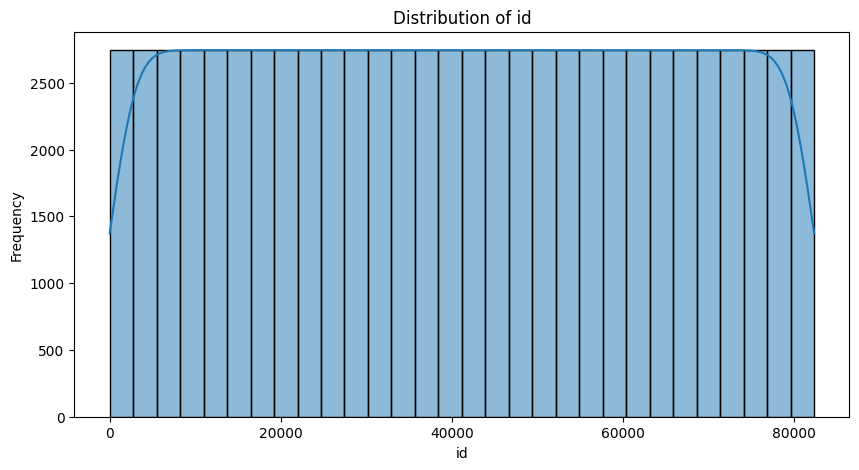

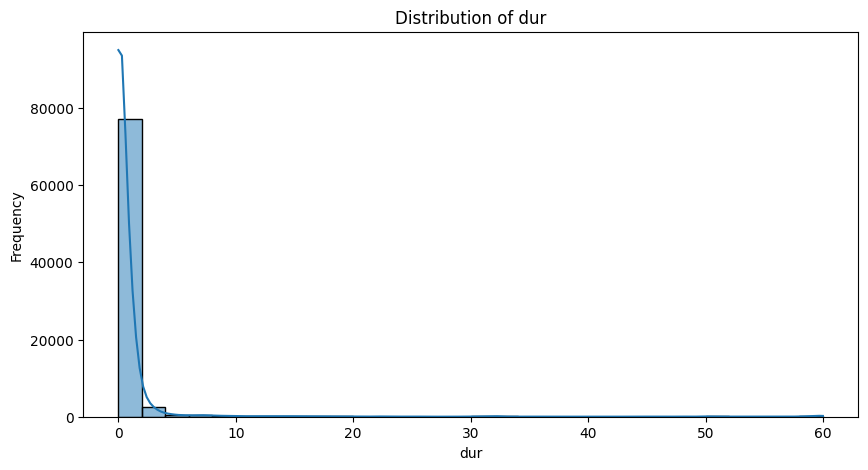

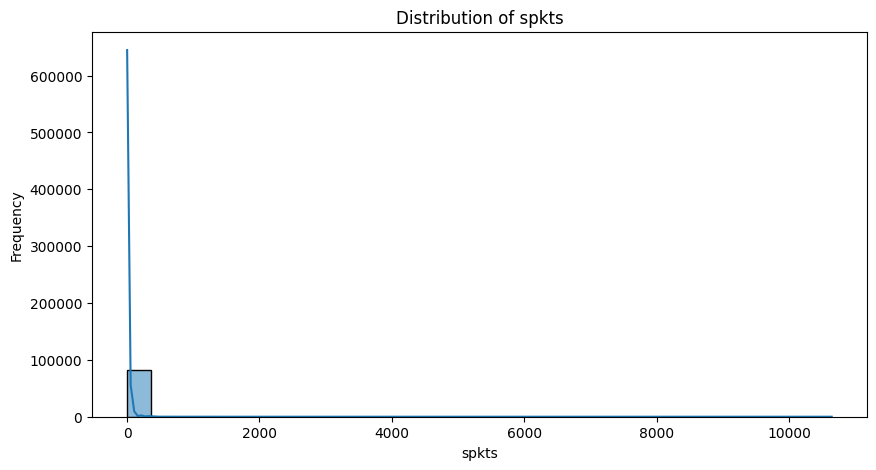

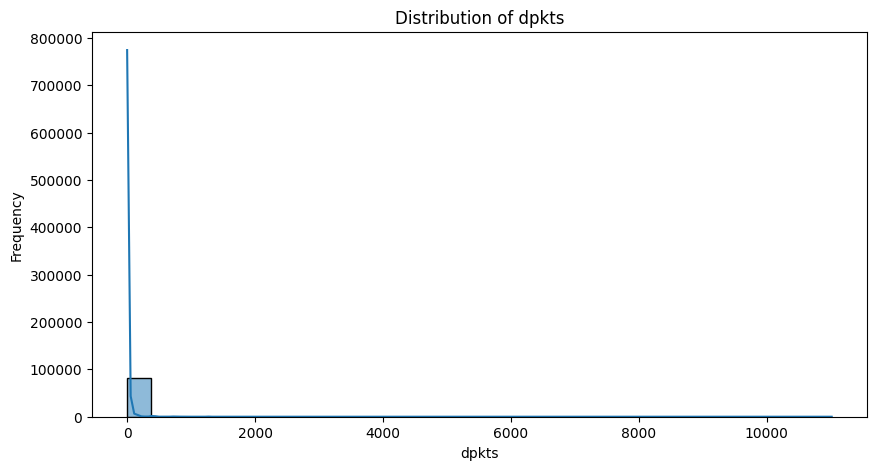

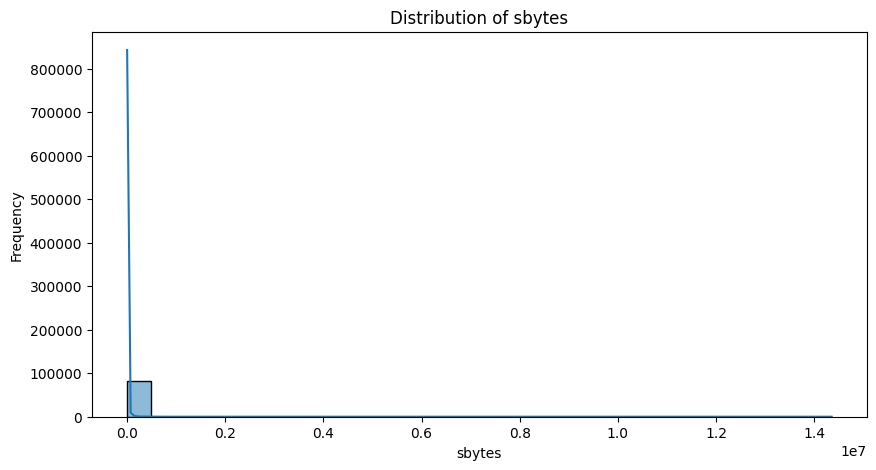

...

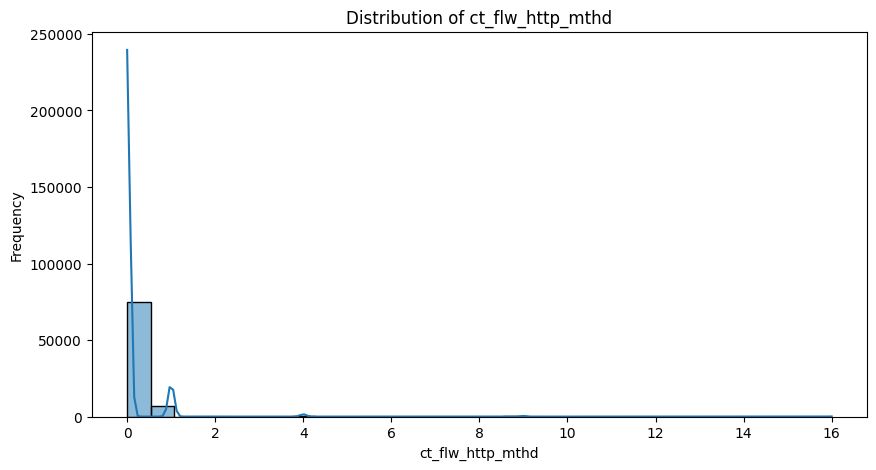

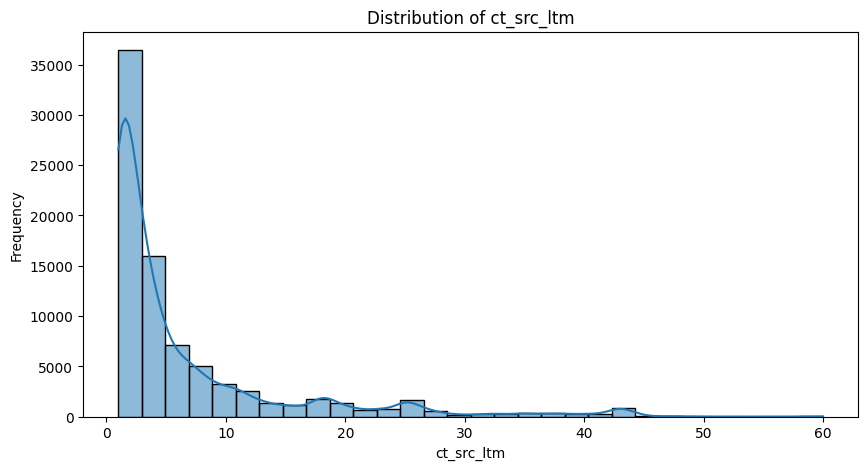

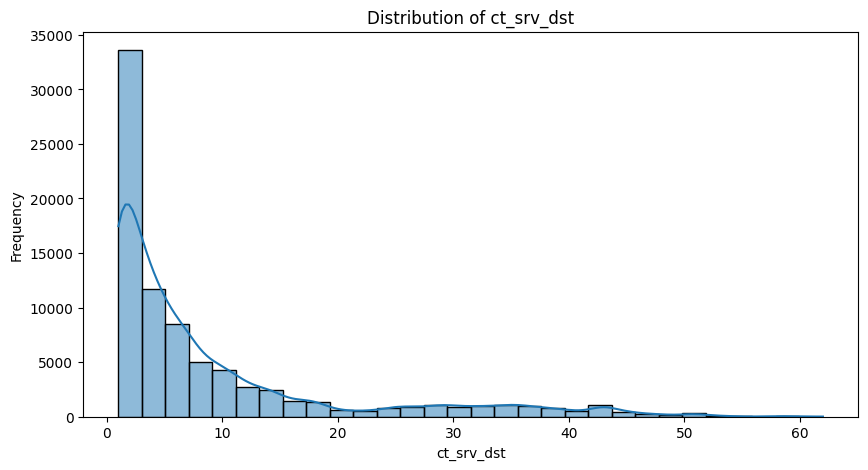

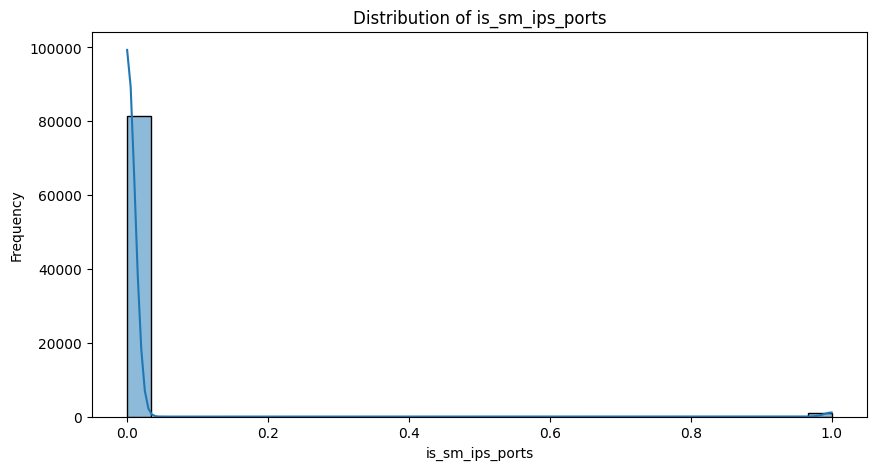

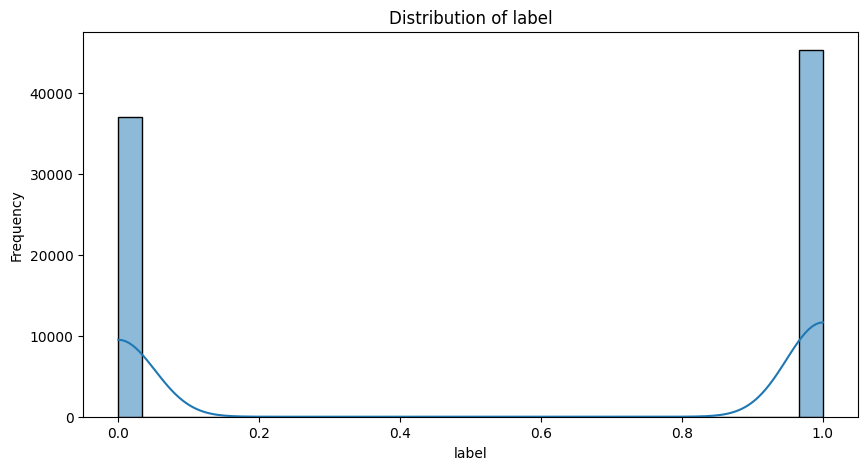

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

# Identify numerical columns in the test dataset
numerical_cols = df_test.select_dtypes(include=['int64', 'float64']).columns

# Plot histograms for each numerical feature
for col in numerical_cols:
    plt.figure(figsize=(10, 5))
    sns.histplot(df_test[col], bins=30, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Summary Statistics

In [50]:
summary_stats = df_test.describe()
print(summary_stats)

                 id           dur         spkts         dpkts        sbytes  \
count  82332.000000  82332.000000  82332.000000  82332.000000  8.233200e+04   
mean   41166.500000      1.006756     18.666472     17.545936  7.993908e+03   
std    23767.345519      4.710444    133.916353    115.574086  1.716423e+05   
min        1.000000      0.000000      1.000000      0.000000  2.400000e+01   
25%    20583.750000      0.000008      2.000000      0.000000  1.140000e+02   
50%    41166.500000      0.014138      6.000000      2.000000  5.340000e+02   
75%    61749.250000      0.719360     12.000000     10.000000  1.280000e+03   
max    82332.000000     59.999989  10646.000000  11018.000000  1.435577e+07   

             dbytes          rate          sttl          dttl         sload  \
count  8.233200e+04  8.233200e+04  82332.000000  82332.000000  8.233200e+04   
mean   1.323379e+04  8.241089e+04    180.967667     95.713003  6.454902e+07   
std    1.514715e+05  1.486204e+05    101.513358    

# Box Plots:

Visualize the distribution, central value, and variability of numerical features, and identify outliers.

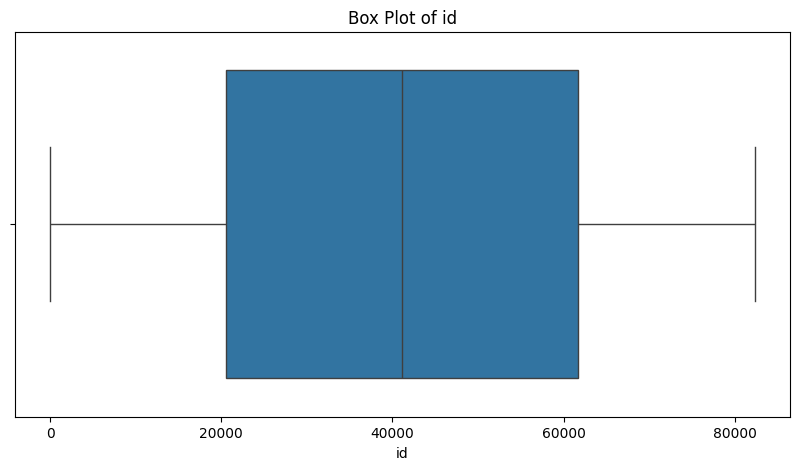

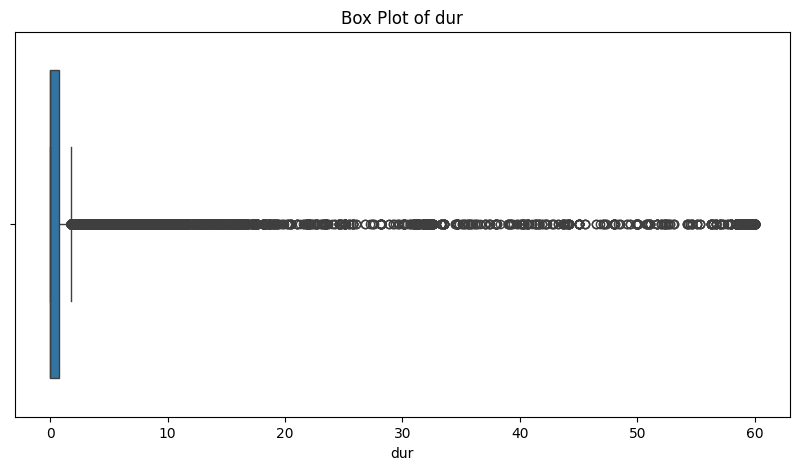

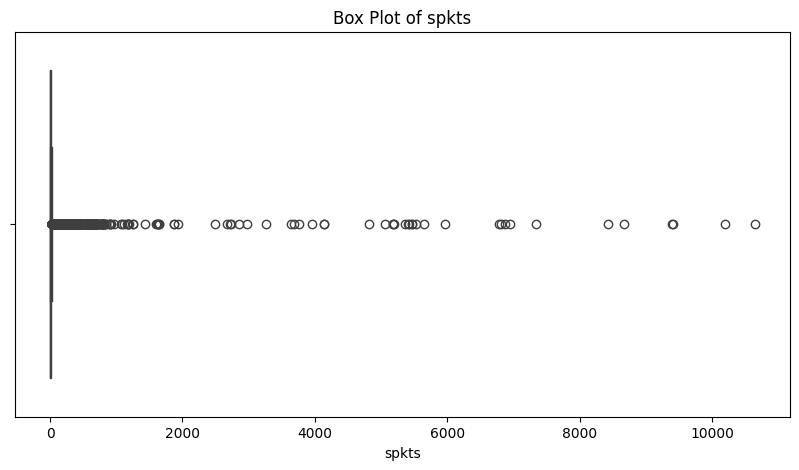

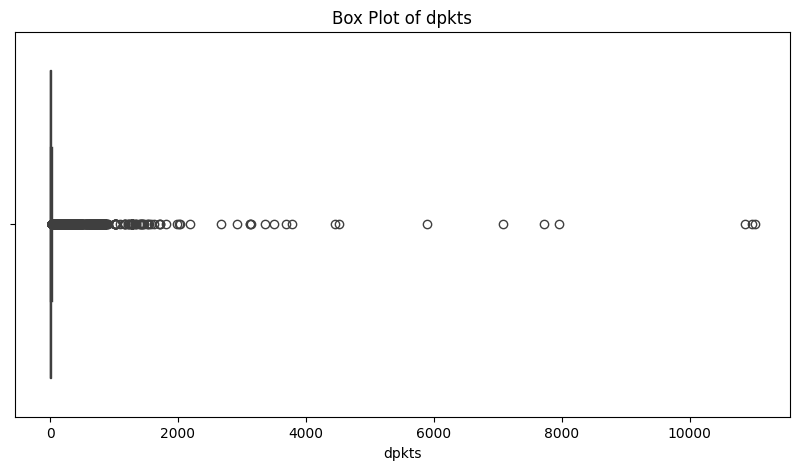

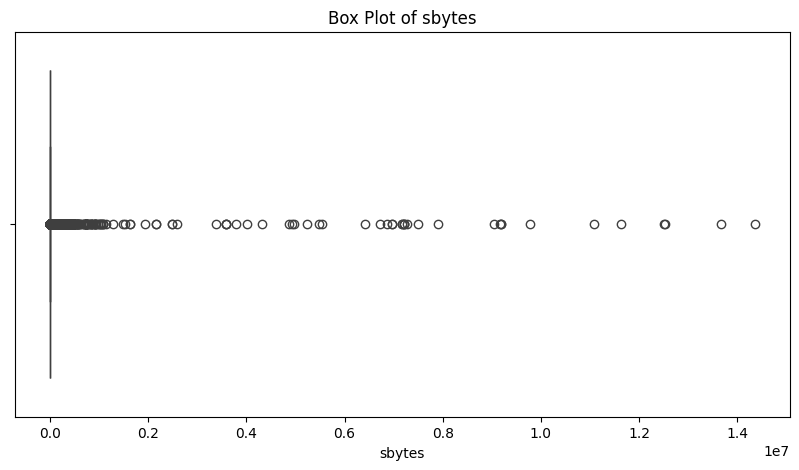

...

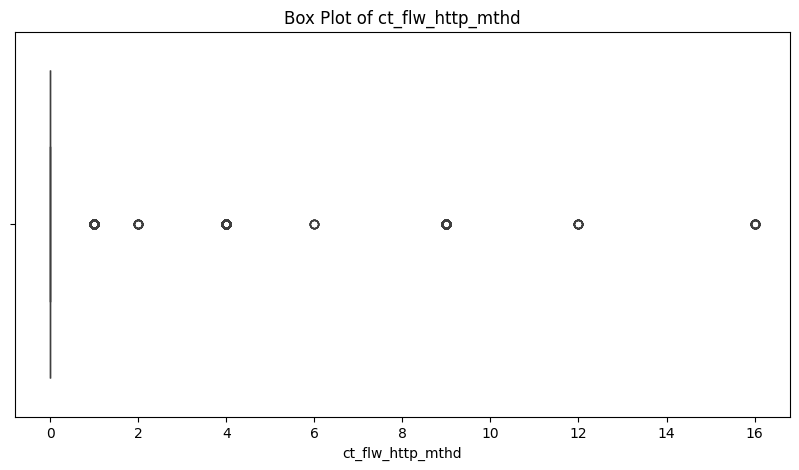

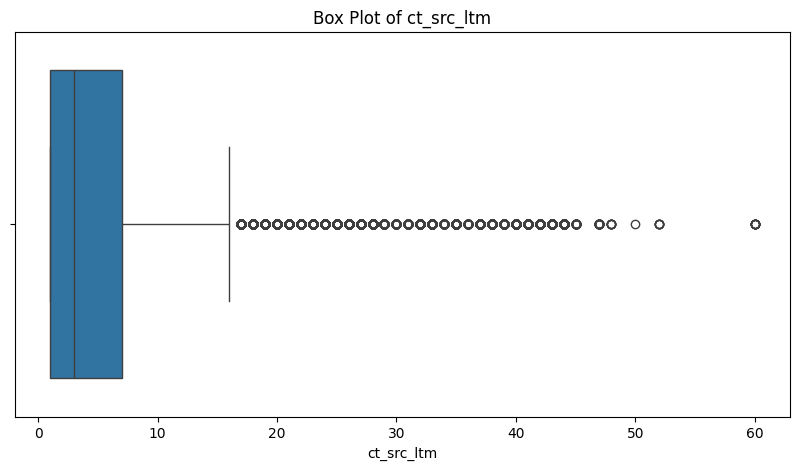

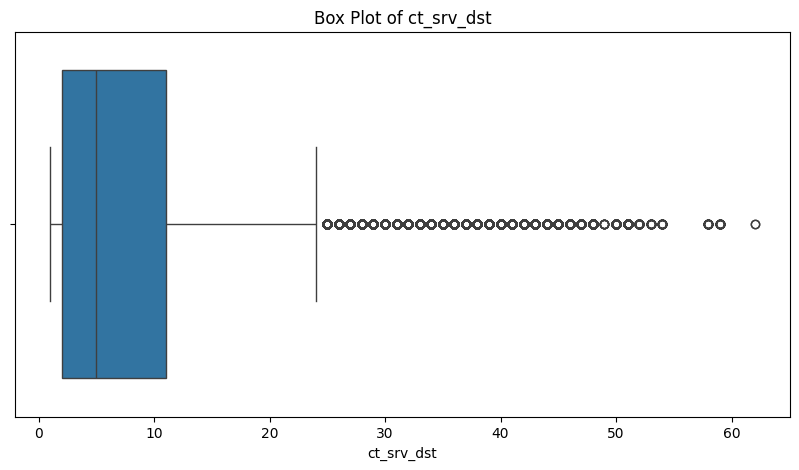

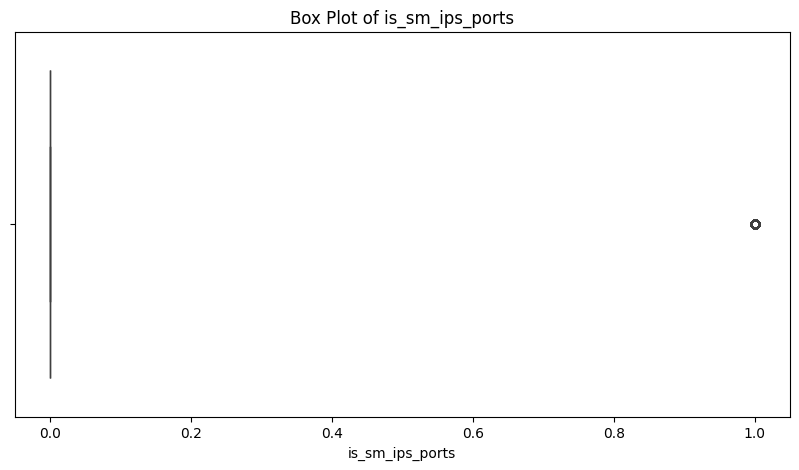

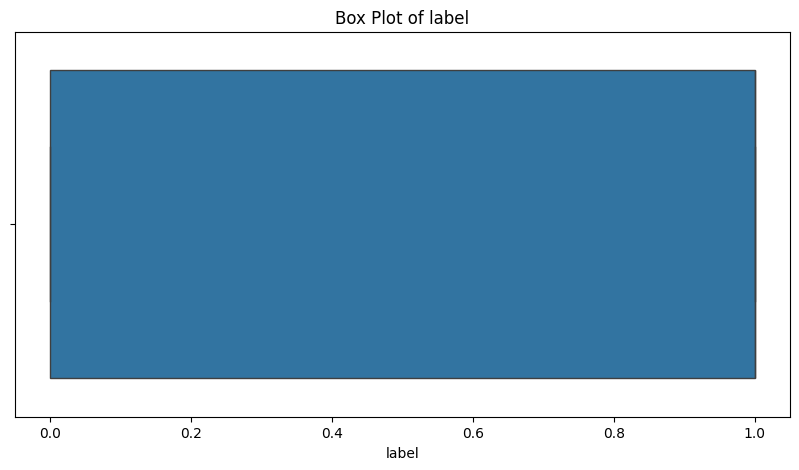

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt

for col in numerical_cols:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=df_test[col])
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)
    plt.show()

# Frequency Tables:

For categorical variables, create frequency tables to observe the count of each category.

In [52]:
categorical_cols = df_test.select_dtypes(include=['object']).columns

for col in categorical_cols:
    frequency_table = df_test[col].value_counts()
    print(f'Frequency Table for {col}:\n{frequency_table}\n')

Frequency Table for proto:
proto
tcp           43095
udp           29418
unas           3515
arp             987
ospf            676
              ...  
br-sat-mon       32
pvp              32
wsn              32
ib               31
igmp             30
Name: count, Length: 131, dtype: int64

Frequency Table for service:
service
-           47153
dns         21367
http         8287
smtp         1851
ftp          1552
ftp-data     1396
pop3          423
ssh           204
ssl            30
snmp           29
dhcp           26
radius          9
irc             5
Name: count, dtype: int64

Frequency Table for state:
state
FIN    39339
INT    34163
CON     6982
REQ     1842
ACC        4
RST        1
CLO        1
Name: count, dtype: int64

Frequency Table for attack_cat:
attack_cat
Normal            37000
Generic           18871
Exploits          11132
Fuzzers            6062
DoS                4089
Reconnaissance     3496
Analysis            677
Backdoor            583
Shellcode           378

# Bar Plots:

Visualize the frequency distribution of categorical variables.

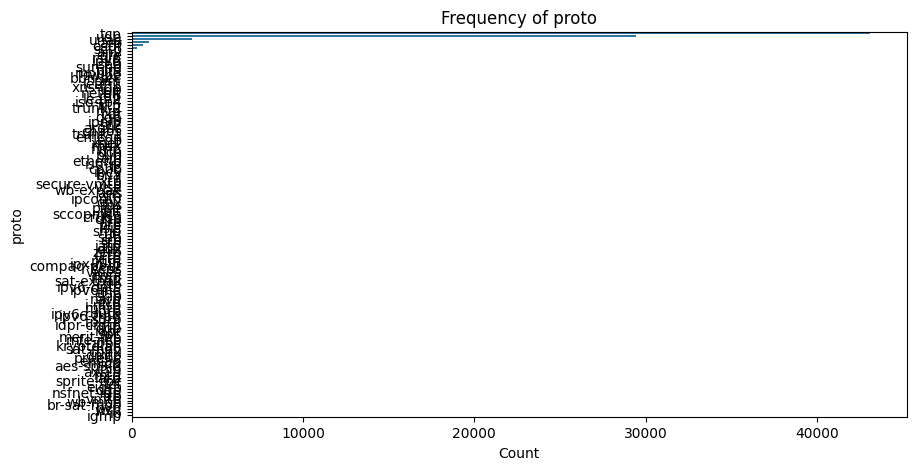

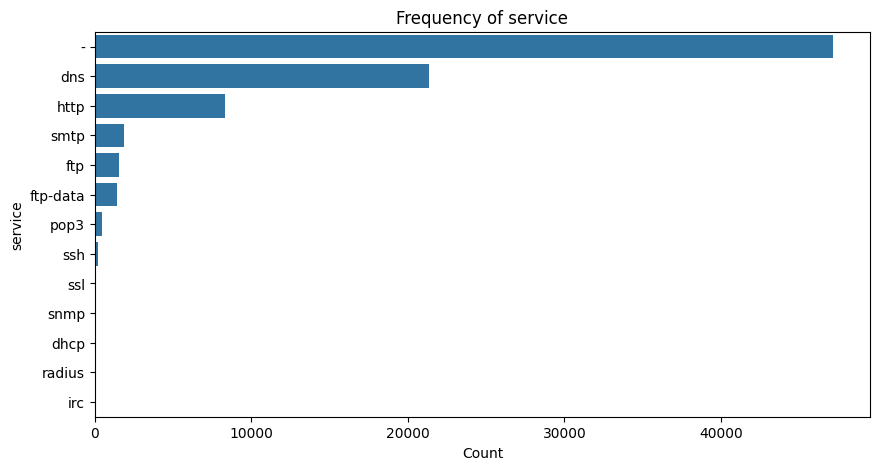

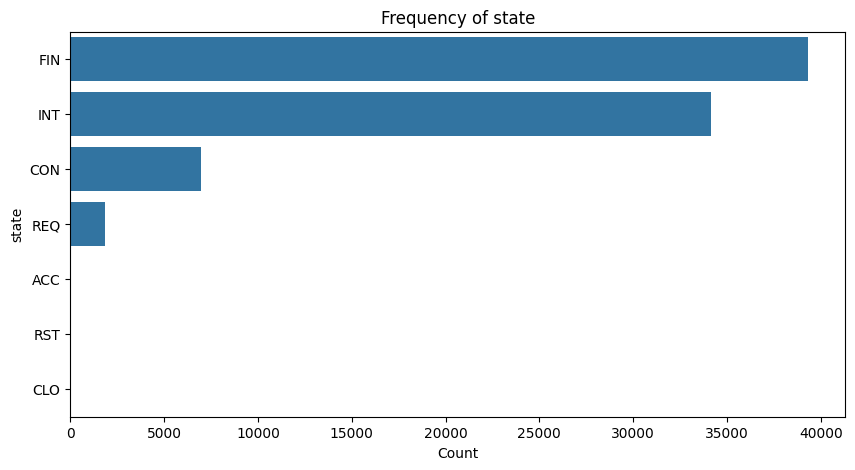

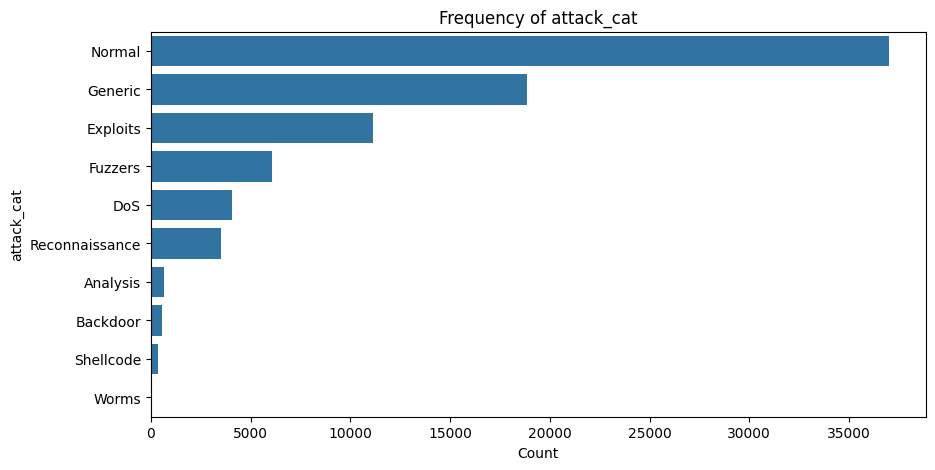

In [53]:
for col in categorical_cols:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=col, data=df_test, order=df_test[col].value_counts().index)
    plt.title(f'Frequency of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
    plt.show()

# Density Plots:

Estimate the probability density function of a continuous variable, providing a smoothed visualization of the distribution.

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


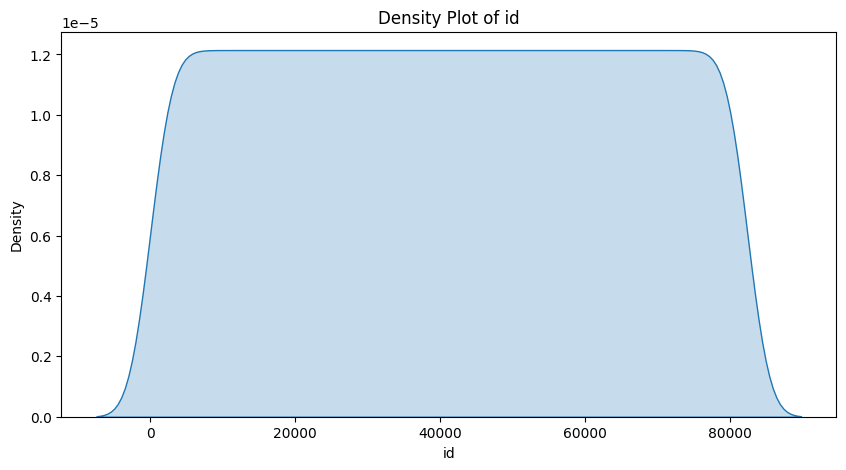

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


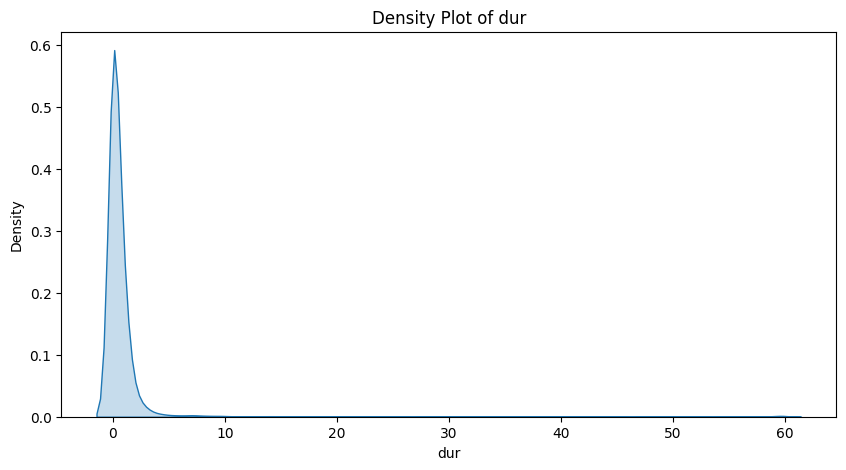

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


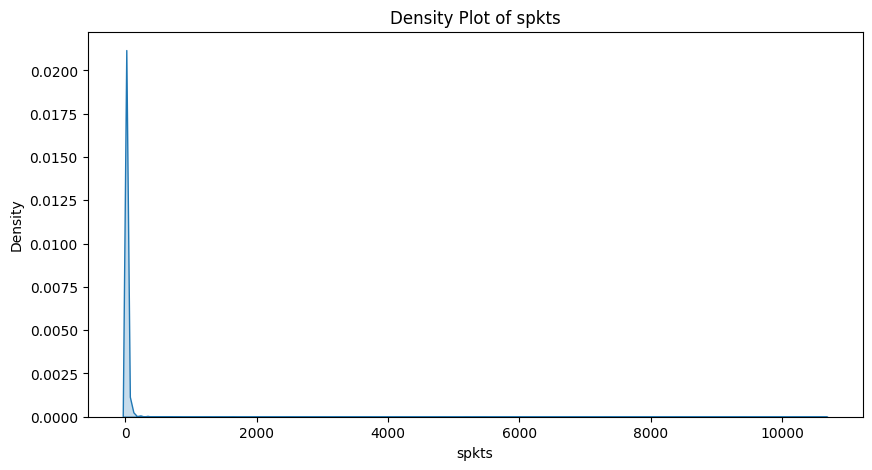

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


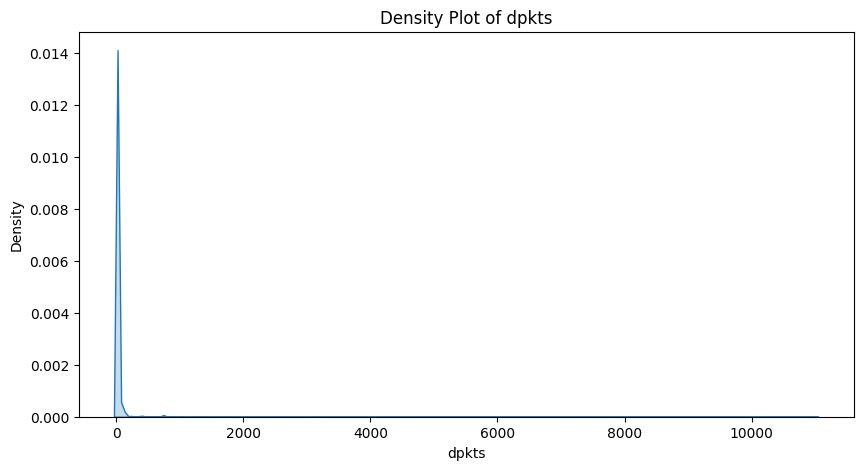

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


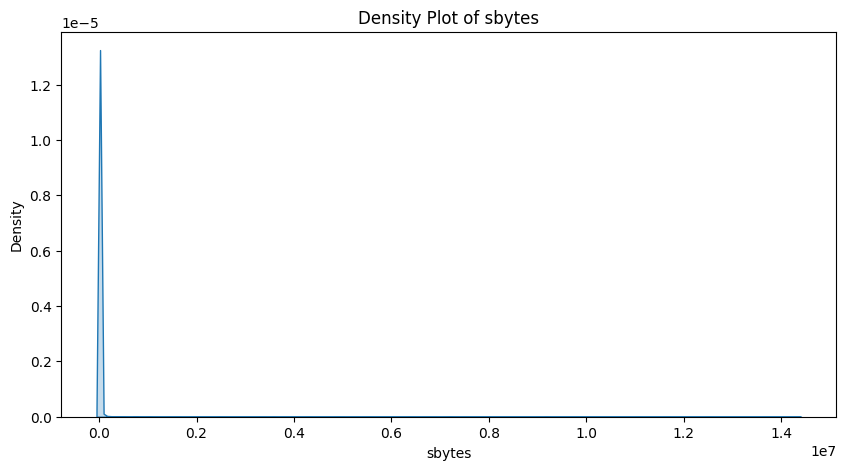

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


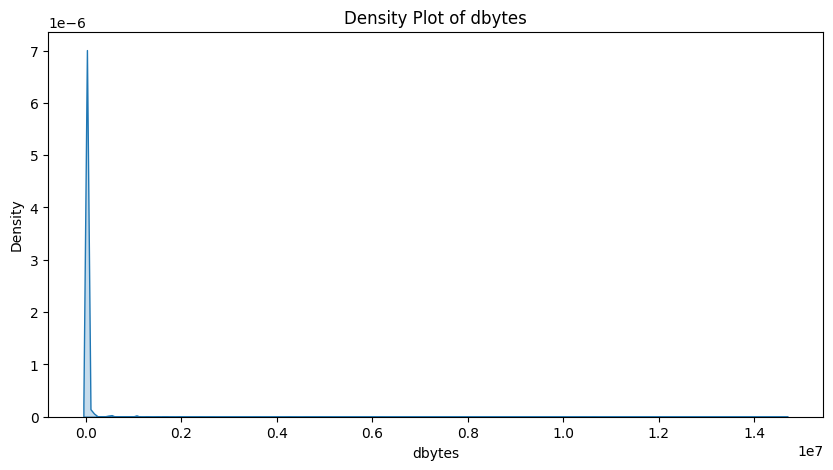

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


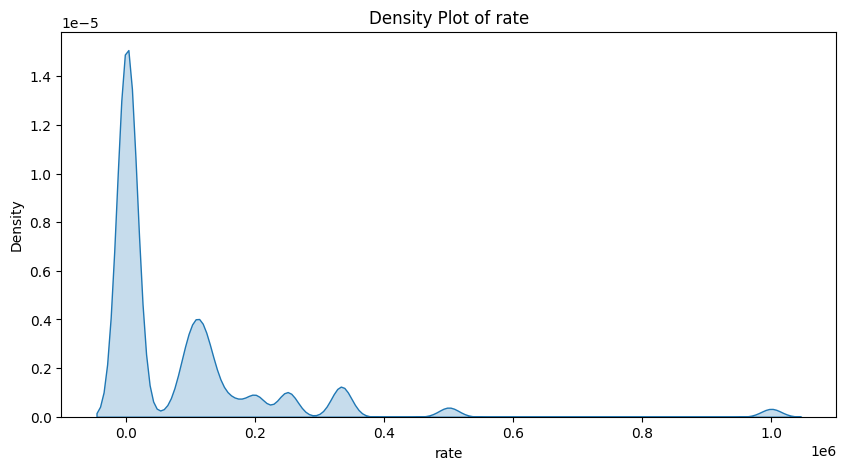

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


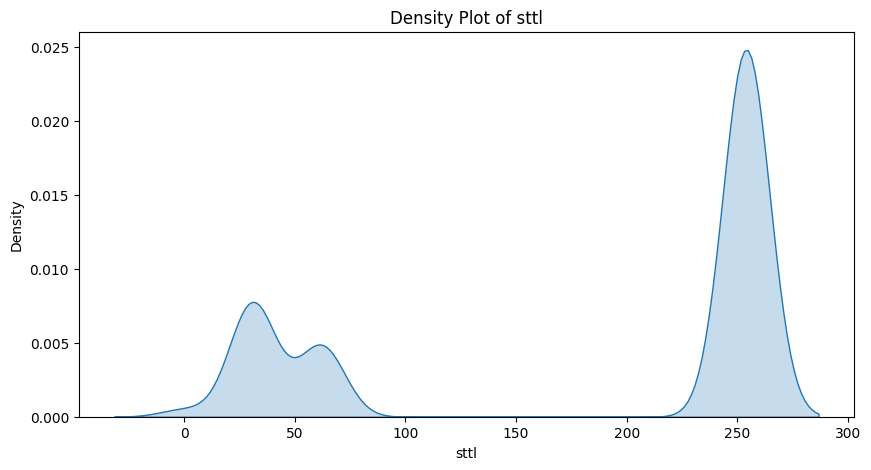

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


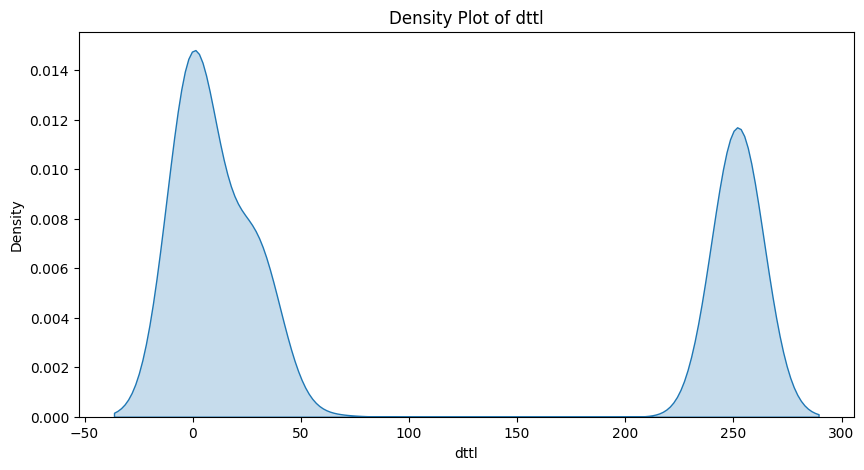

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


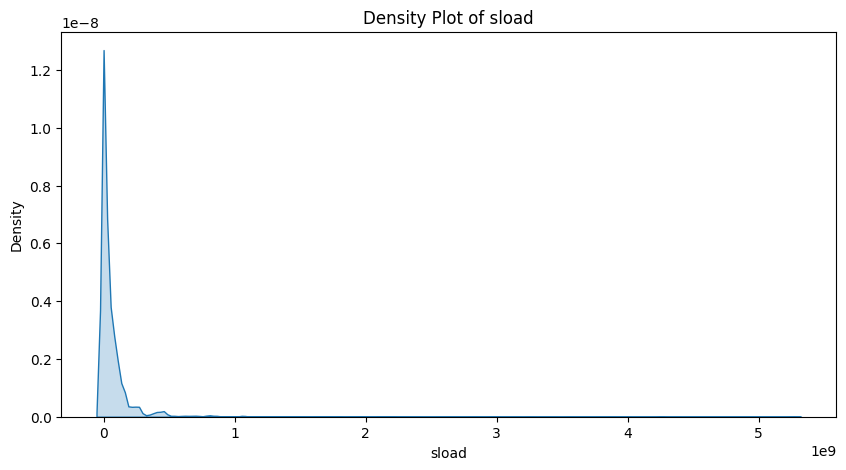

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


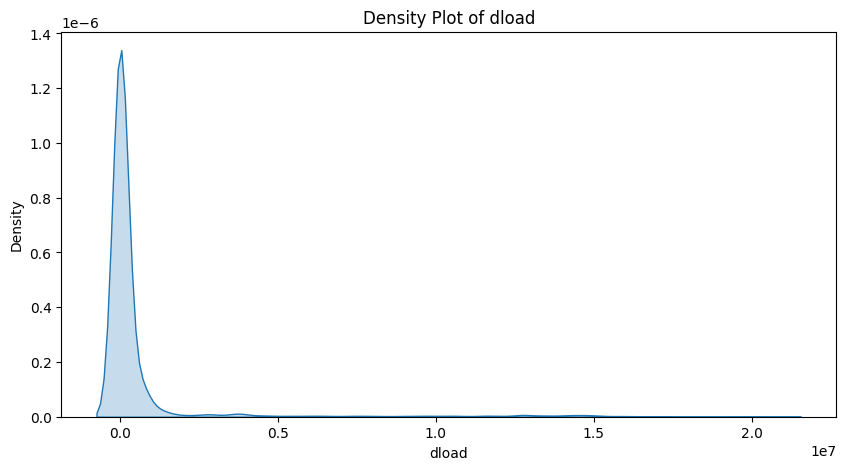

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


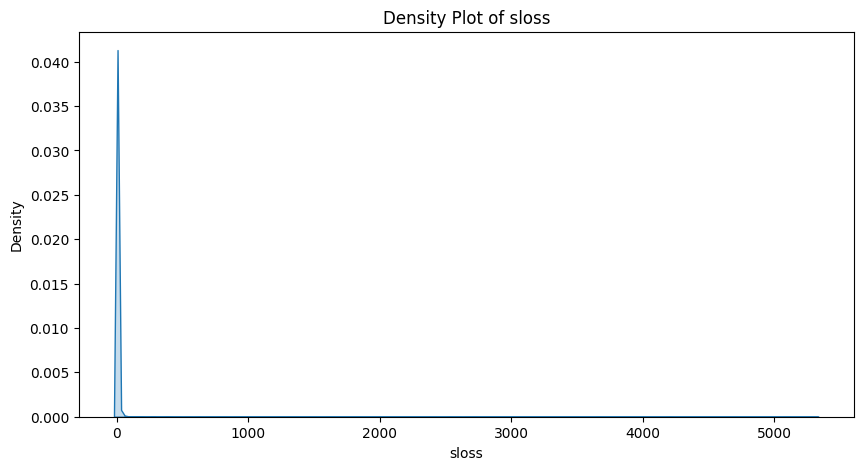

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


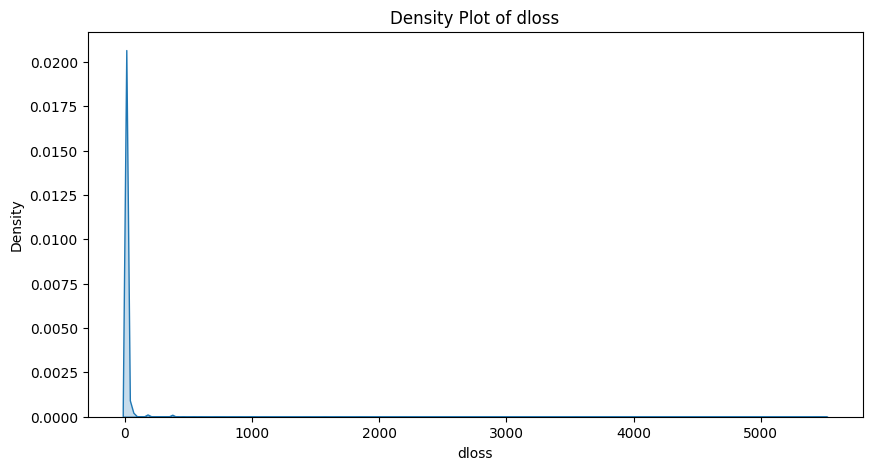

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


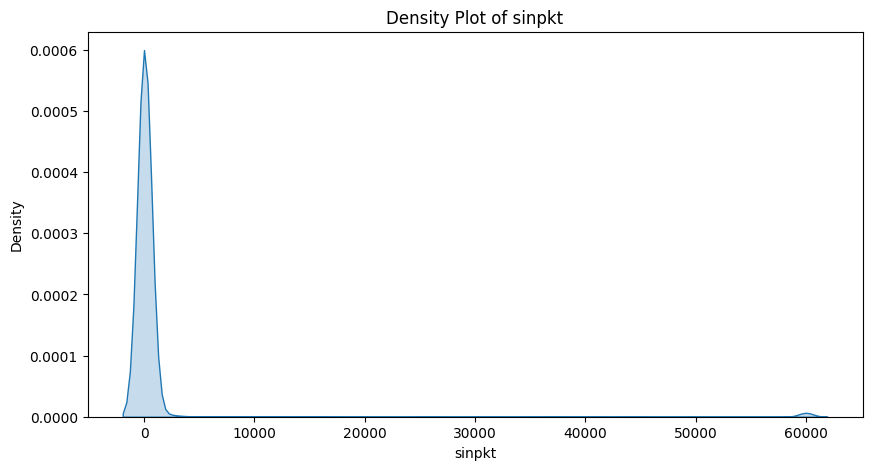

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


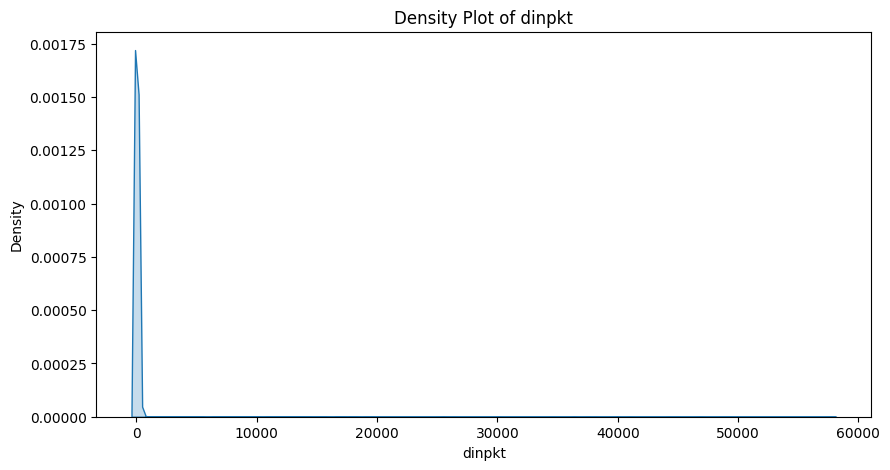

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


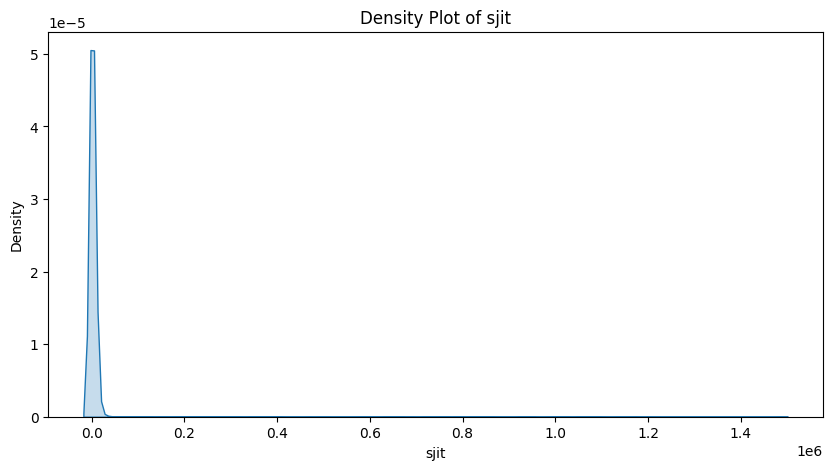

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


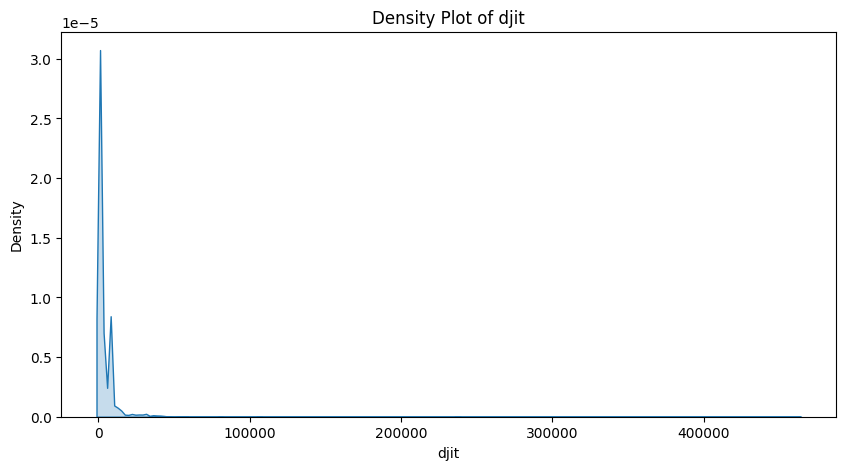

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


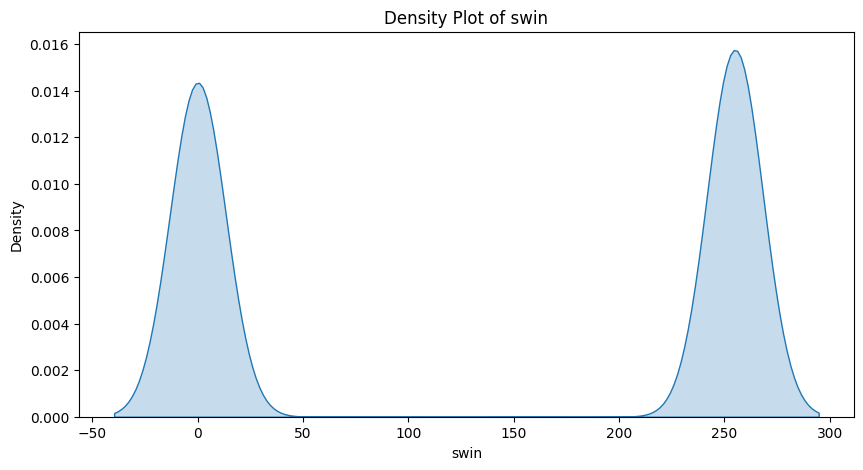

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


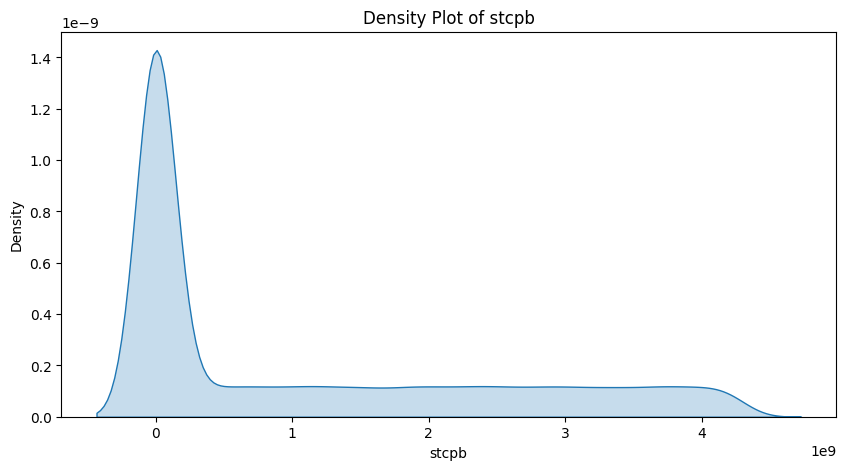

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


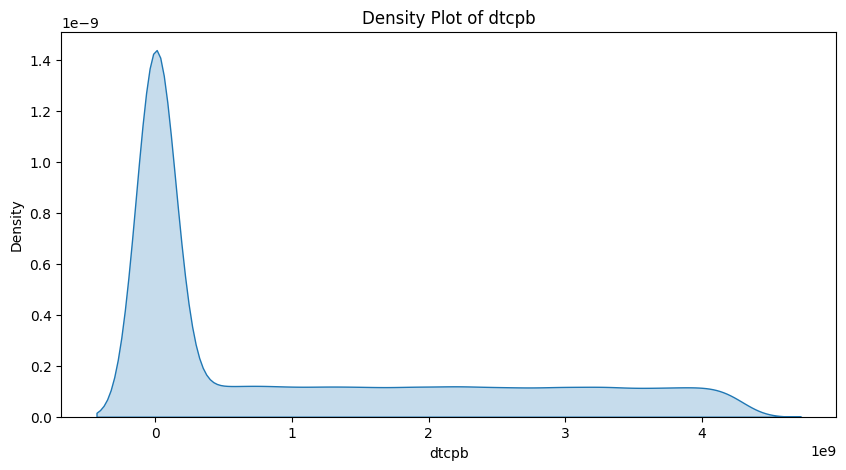

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


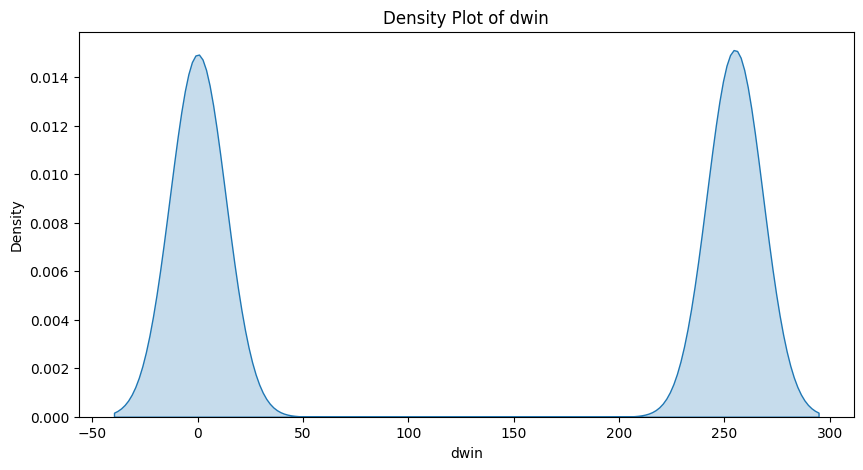

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


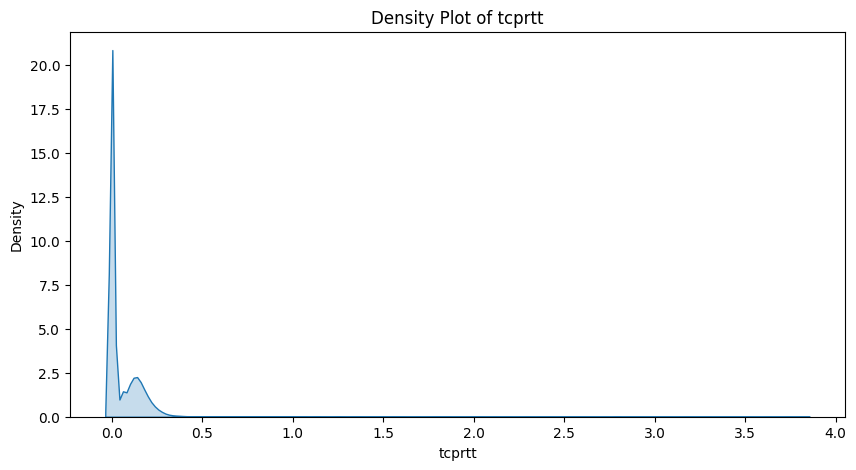

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


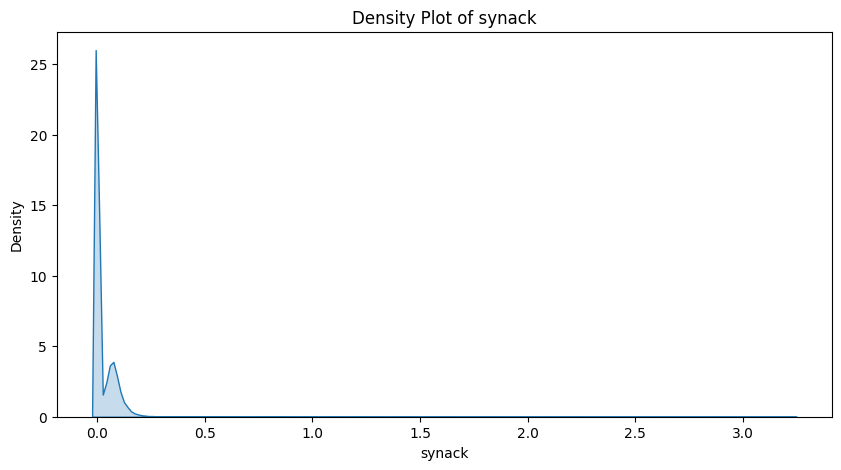

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


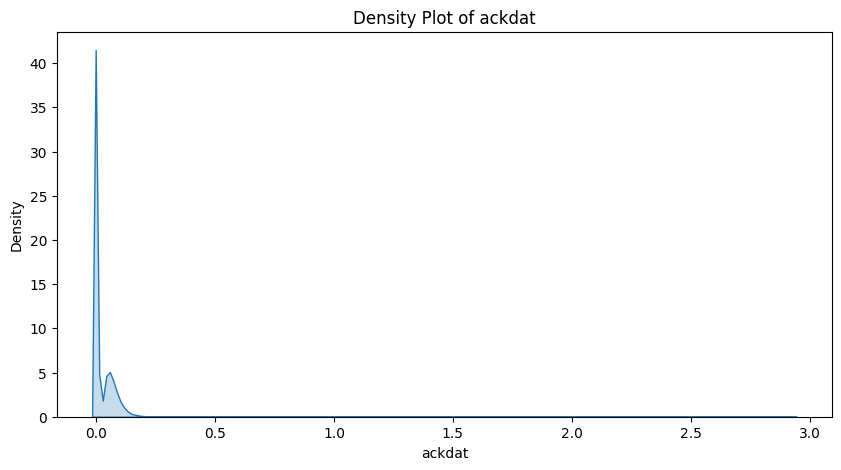

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


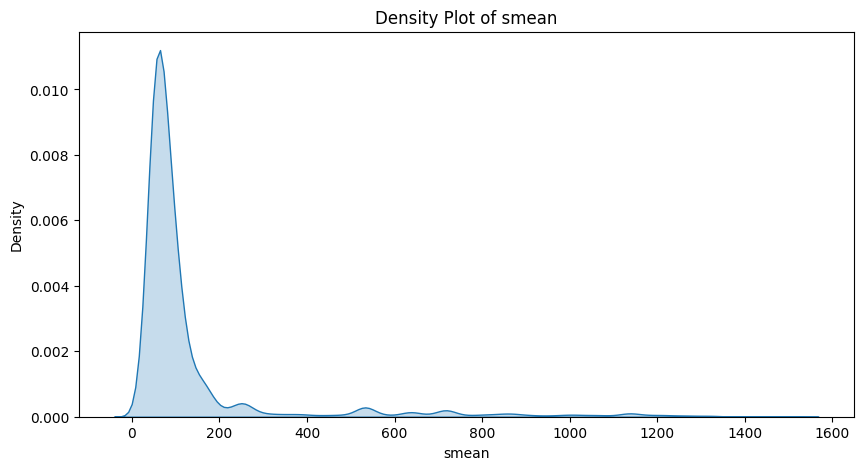

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


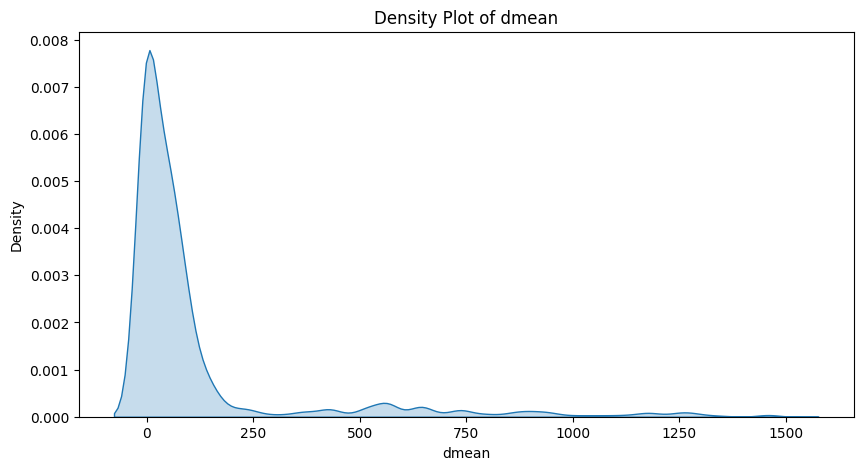

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


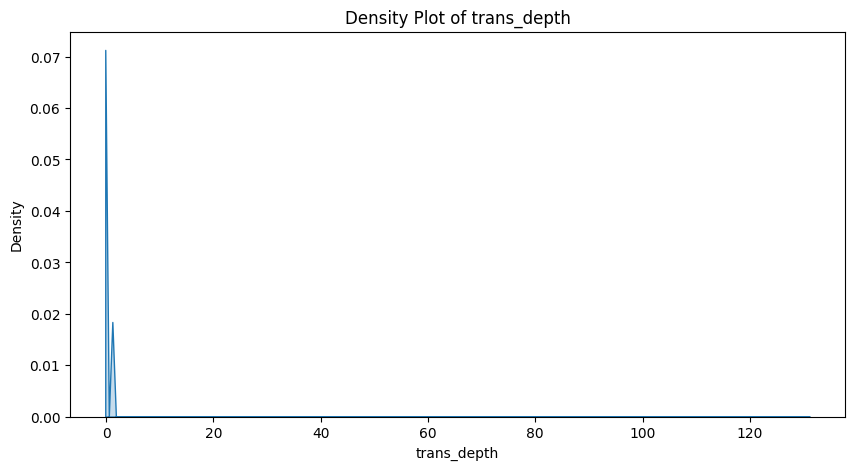

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


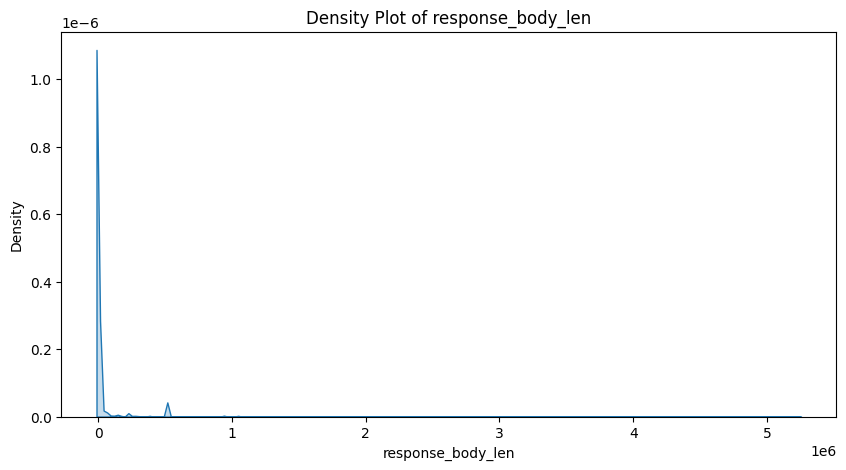

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


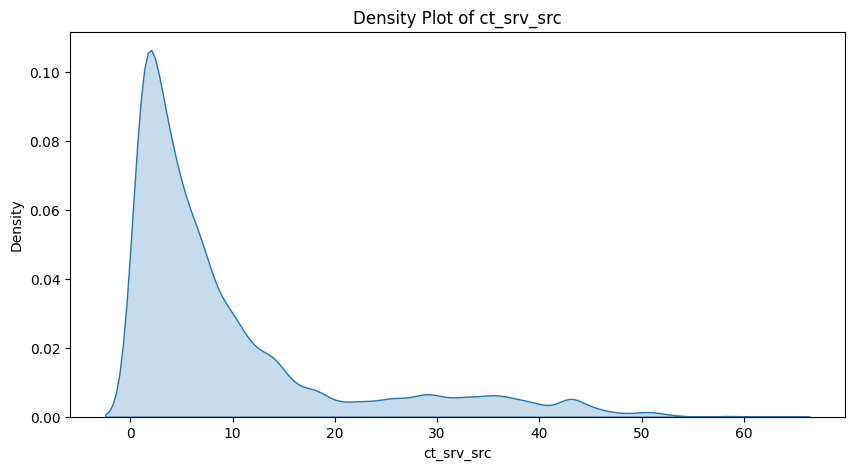

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


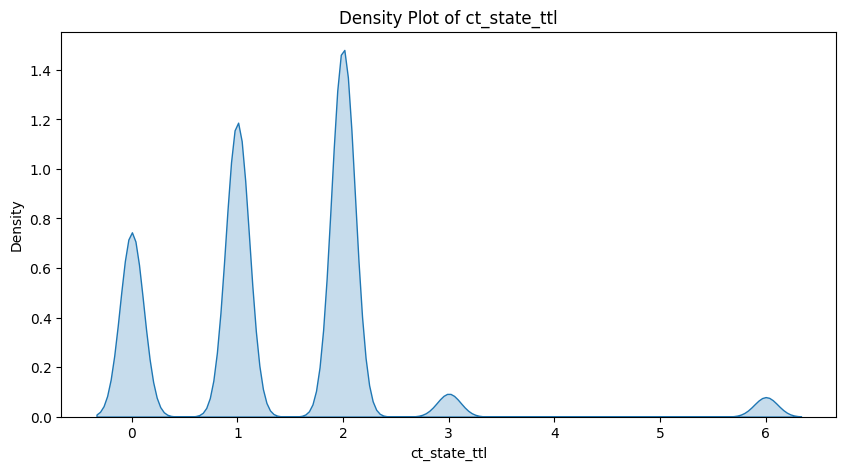

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


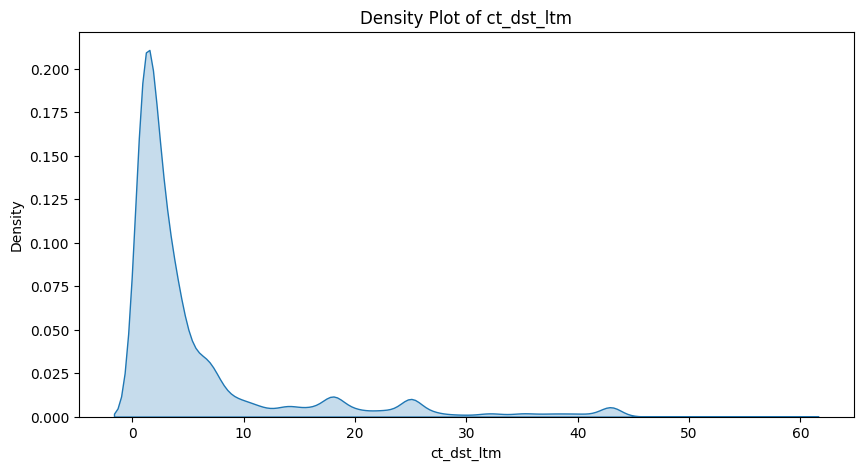

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


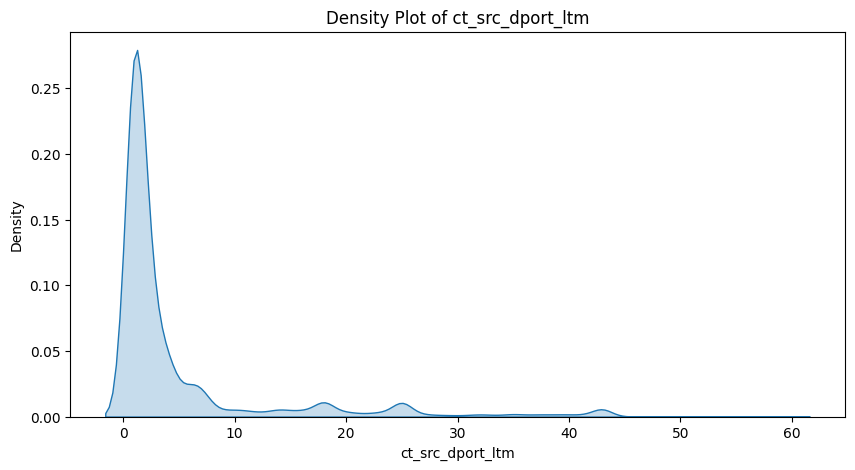

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


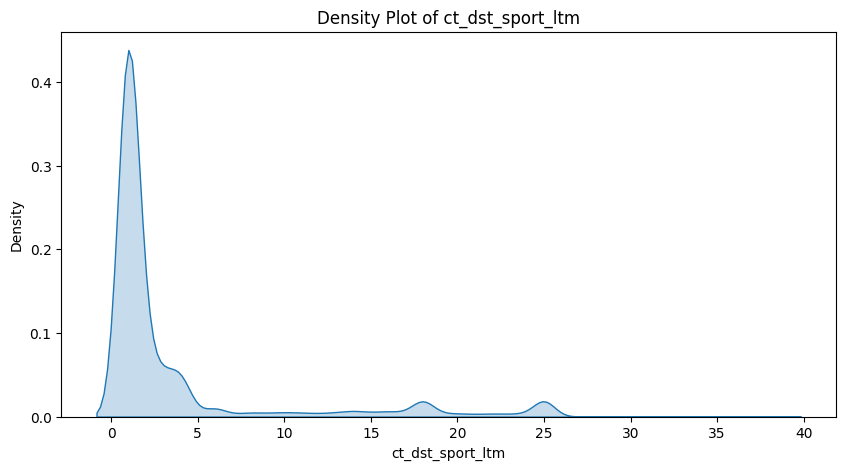

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


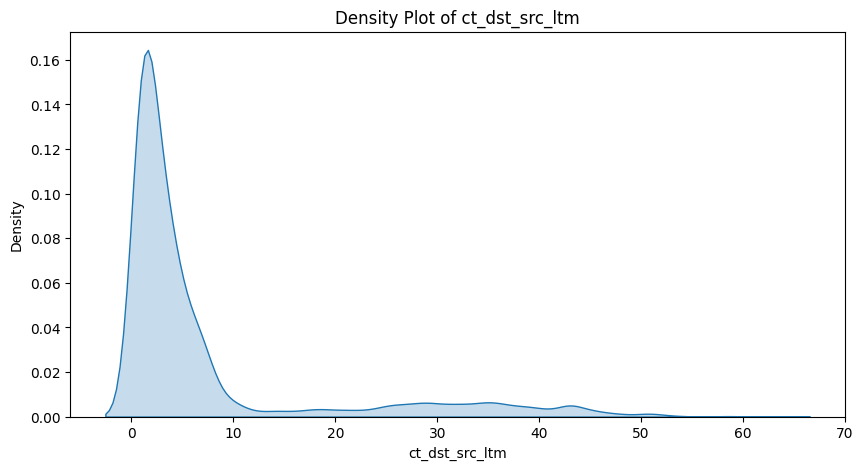

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


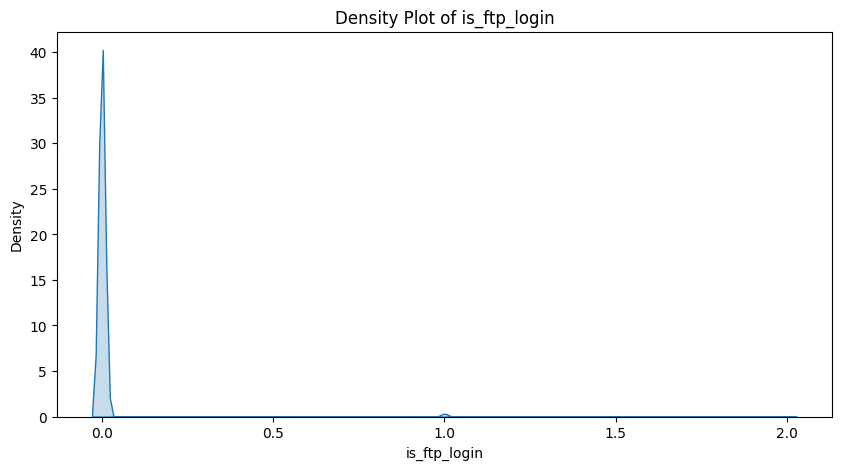

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


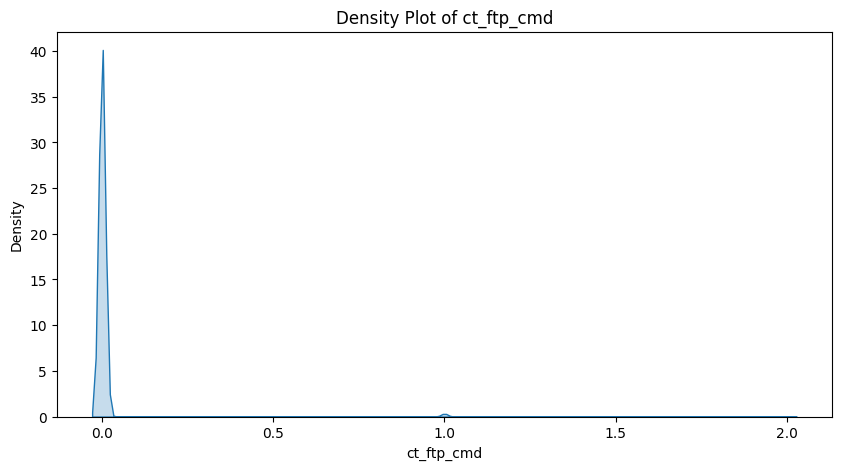

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


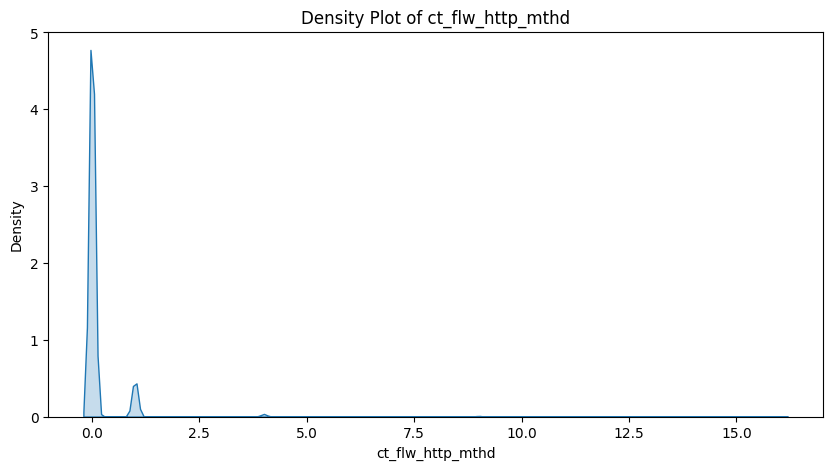

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


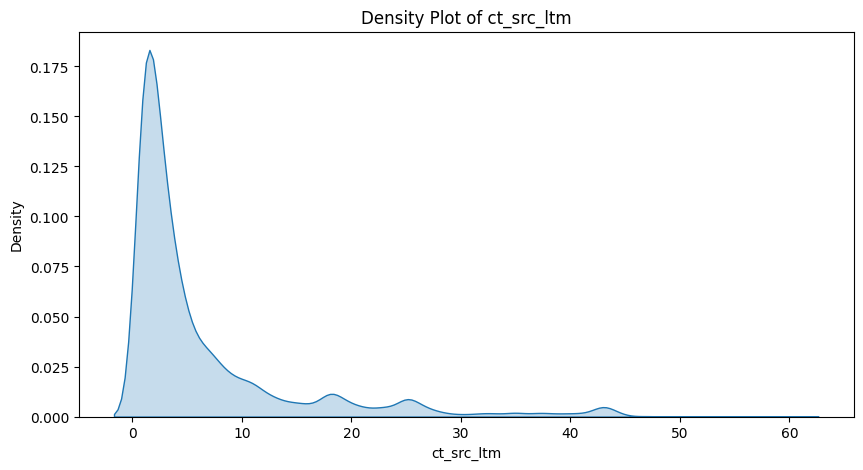

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


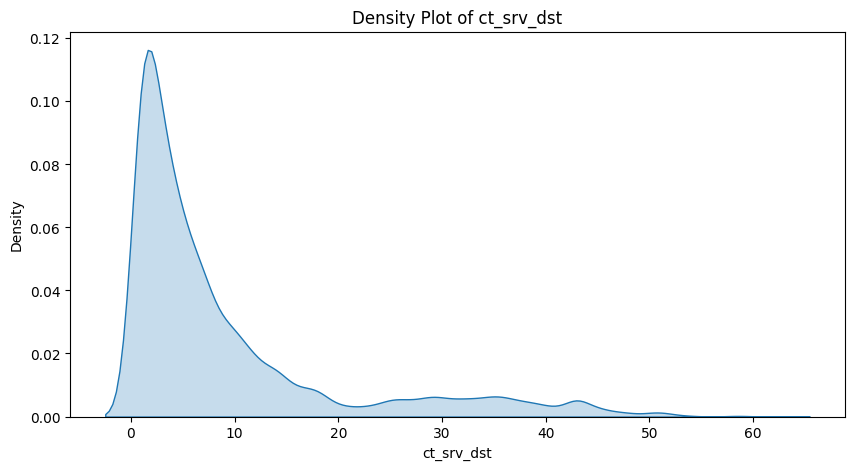

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


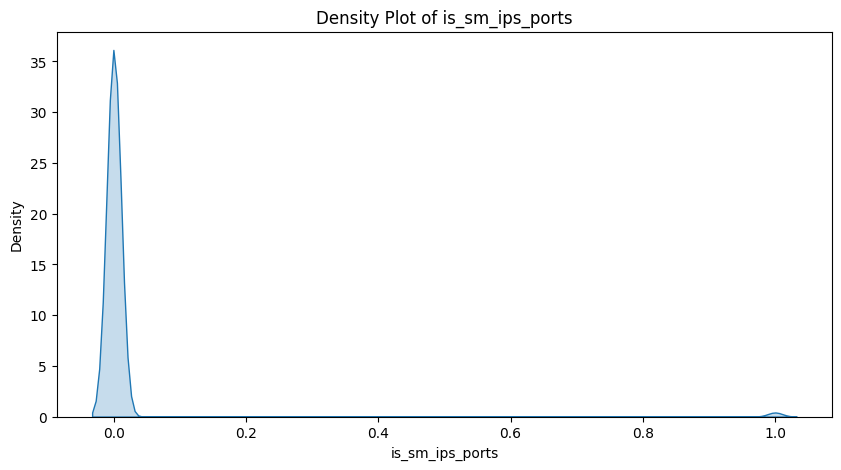

<ipython-input-54-a09188b5c5bb>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_test[col], shade=True)


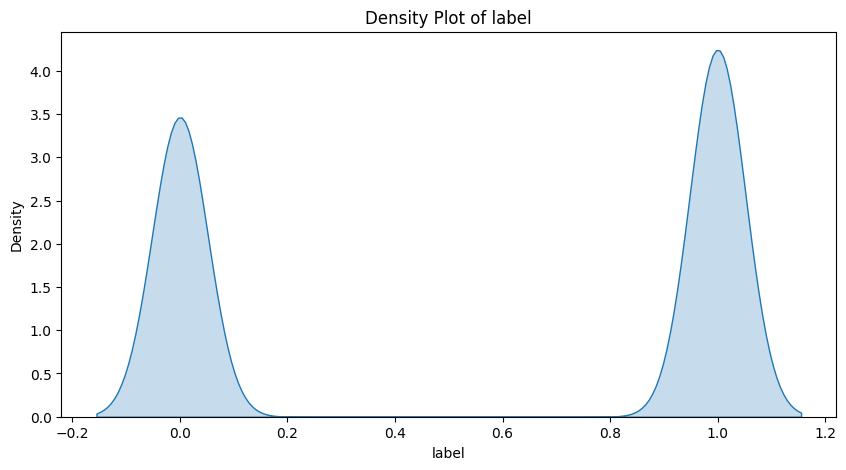

In [54]:
for col in numerical_cols:
    plt.figure(figsize=(10, 5))
    sns.kdeplot(df_test[col], shade=True)
    plt.title(f'Density Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.show()

# Outlier Detection:

Identify data points that deviate significantly from the rest of the dataset, which can be crucial for data cleaning.

In [58]:
# Select only numeric columns
numeric_cols = df_test.select_dtypes(include=['number'])

# Calculate the first and third quartiles
Q1 = numeric_cols.quantile(0.25)
Q3 = numeric_cols.quantile(0.75)

# Compute the Interquartile Range (IQR)
IQR = Q3 - Q1

# Identify outliers
outliers = ((numeric_cols < (Q1 - 1.5 * IQR)) | (numeric_cols > (Q3 + 1.5 * IQR))).sum()

print(f'Number of outliers in each numeric column:\n{outliers}')

Number of outliers in each numeric column:
id                       0
dur                   5868
spkts                10196
dpkts                 8907
sbytes                9270
dbytes               12308
rate                  6201
sttl                     0
dttl                     0
sload                 6715
dload                18112
sloss                 5499
dloss                11272
sinpkt                5668
dinpkt                4717
sjit                  6321
djit                  8573
swin                     0
stcpb                    0
dtcpb                    0
dwin                     0
tcprtt                2020
synack                2954
ackdat                2480
smean                11928
dmean                 9902
trans_depth           7582
response_body_len     5657
ct_srv_src           10093
ct_state_ttl          1833
ct_dst_ltm           10479
ct_src_dport_ltm     11476
ct_dst_sport_ltm     10907
ct_dst_src_ltm       12789
is_ftp_login           678
ct_ftp_cmd  

# Dealing with the Outliers in df_test

In [61]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
import numpy as np

# Upload the files in Colab (Uncomment and run this in Colab to upload the files)
# from google.colab import files
# uploaded = files.upload()

# Assuming the files are named 'UNSW_NB15_testing-set.csv' and 'UNSW_NB15_training-set.csv'
testing_set_path = 'UNSW_NB15_testing-set.csv'
training_set_path = 'UNSW_NB15_training-set.csv'

# Load the CSV files into pandas DataFrames
df_test = pd.read_csv('/content/drive/MyDrive/lab_mount/UNSW-NB15 Dataset/UNSW_NB15_testing-set.csv')
df_train = pd.read_csv('/content/drive/MyDrive/lab_mount/UNSW-NB15 Dataset/UNSW_NB15_training-set.csv')

# Selecting numeric columns for imputation
numeric_columns = df_test.select_dtypes(include=['float64', 'int64']).columns

# Scaling the data using StandardScaler
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_test[numeric_columns])

# Convert scaled data back to DataFrame for further manipulation
scaled_df = pd.DataFrame(scaled_data, columns=numeric_columns)

# Identifying outliers using Z-score (values beyond 3 standard deviations are considered outliers)
outliers_mask = (np.abs(scaled_df) > 3)

# Replace outliers with NaN for imputation
scaled_df[outliers_mask] = np.nan

# Impute missing values using the median (as it's less sensitive to outliers)
imputed_data = scaled_df.fillna(scaled_df.median())

# Inverse scaling to return data to original distribution
imputed_data_original_scale = scaler.inverse_transform(imputed_data)

# Convert back to DataFrame with original columns
df_test_imputed = pd.DataFrame(imputed_data_original_scale, columns=numeric_columns)

# Ensure the data types match between imputed and original DataFrames
for column in numeric_columns:
    if df_test[column].dtype == 'int64':
        df_test_imputed[column] = df_test_imputed[column].round().astype('int64')

# Update original df_test with the imputed numeric columns
df_test.update(df_test_imputed)

# Display the updated DataFrame in Colab
from IPython.display import display

display(df_test.head())

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.000011,udp,-,INT,2,0,496,0,90909.0902,...,1,2,0,0,0,1,2,0,Normal,0
1,2,0.000008,udp,-,INT,2,0,1762,0,125000.0003,...,1,2,0,0,0,1,2,0,Normal,0
2,3,0.000005,udp,-,INT,2,0,1068,0,200000.0051,...,1,3,0,0,0,1,3,0,Normal,0
3,4,0.000006,udp,-,INT,2,0,900,0,166666.6608,...,1,3,0,0,0,2,3,0,Normal,0
4,5,0.000010,udp,-,INT,2,0,2126,0,100000.0025,...,1,3,0,0,0,2,3,0,Normal,0


# df_train

## Histogram

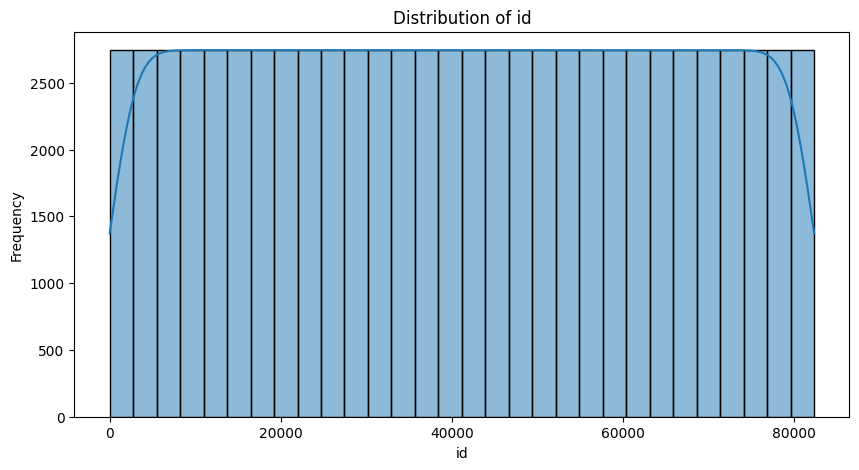

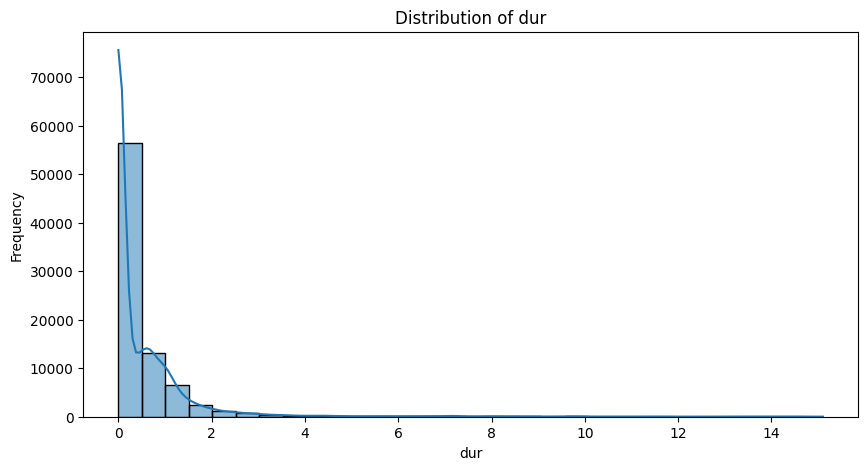

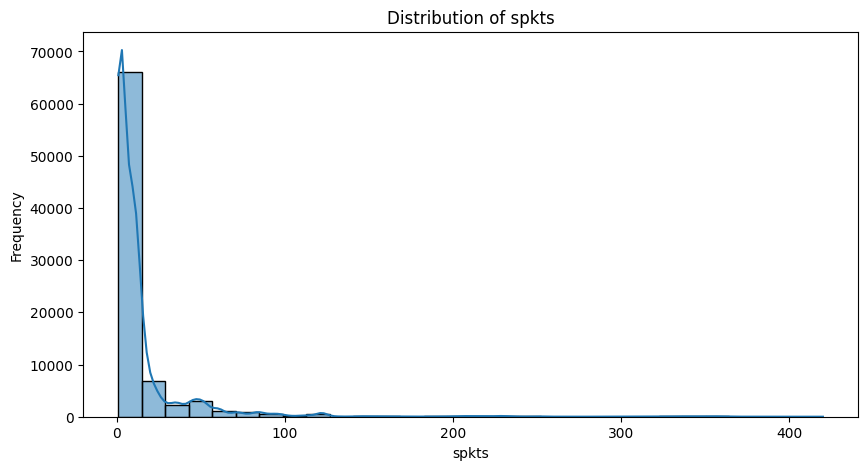

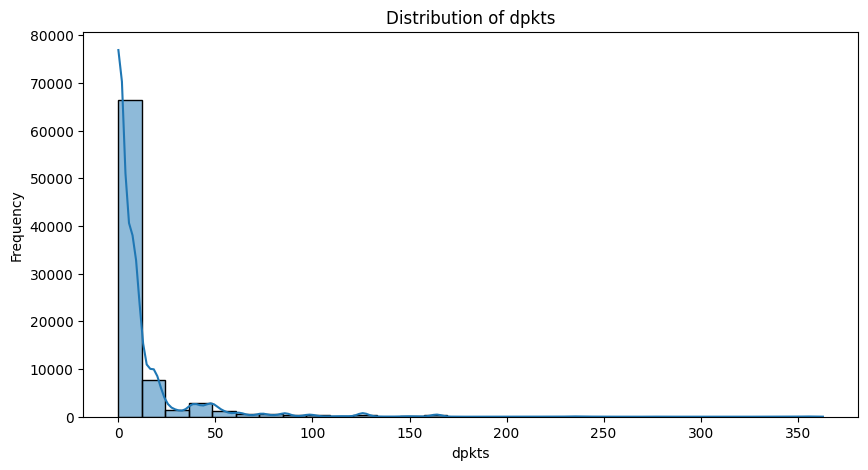

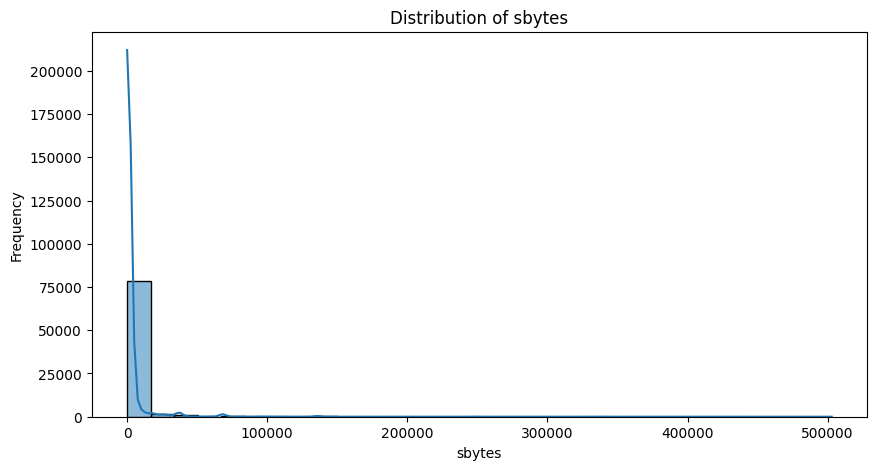

...

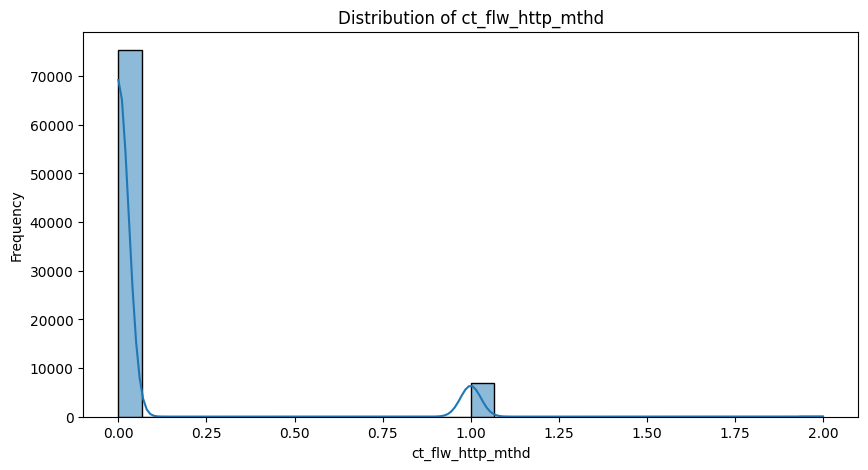

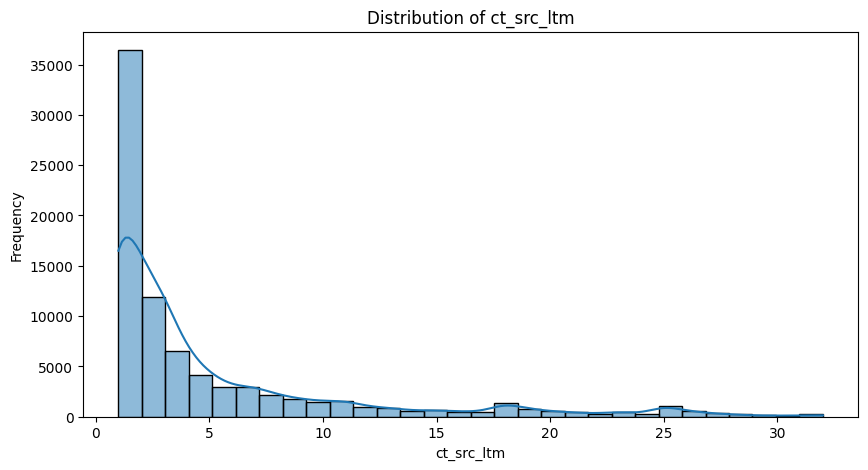

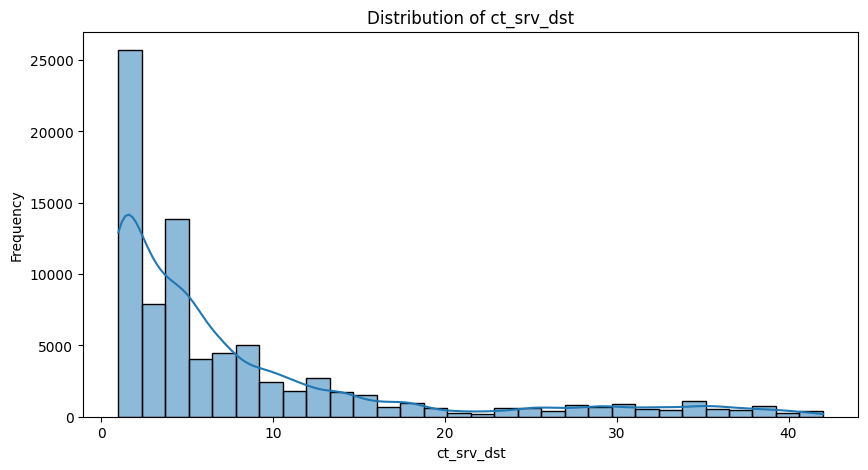

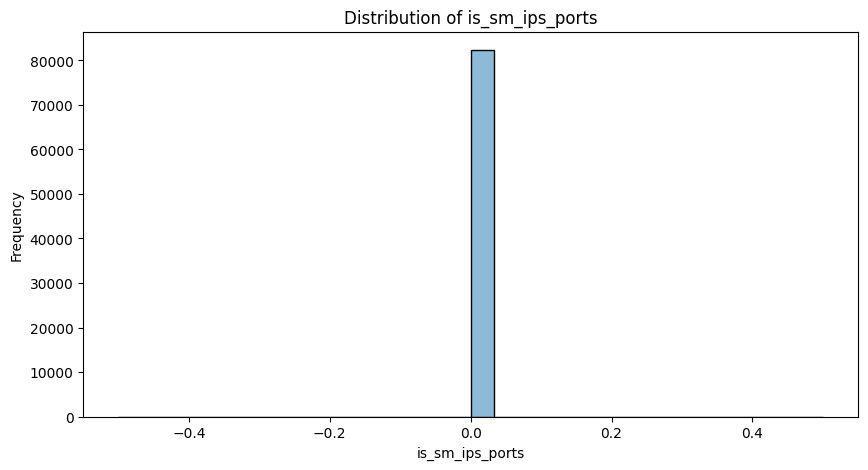

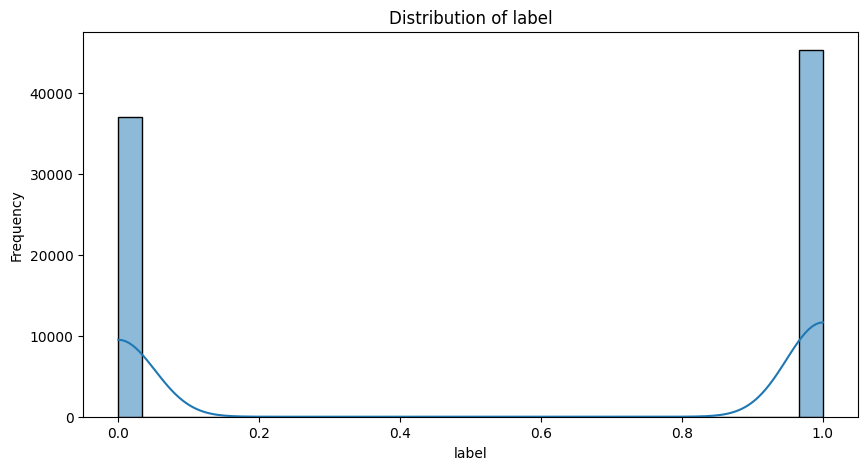

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns

# Identify numerical columns in the test dataset
numerical_cols = df_train.select_dtypes(include=['int64', 'float64']).columns

# Plot histograms for each numerical feature
for col in numerical_cols:
    plt.figure(figsize=(10, 5))
    sns.histplot(df_test[col], bins=30, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Summary Statistics

In [63]:
categorical_cols = df_train.select_dtypes(include=['object']).columns

for col in categorical_cols:
    frequency_table = df_train[col].value_counts()
    print(f'Frequency Table for {col}:\n{frequency_table}\n')

Frequency Table for proto:
proto
tcp       79946
udp       63283
unas      12084
arp        2859
ospf       2595
          ...  
rdp          98
netblt       98
igmp         18
icmp         15
rtp           1
Name: count, Length: 133, dtype: int64

Frequency Table for service:
service
-           94168
dns         47294
http        18724
smtp         5058
ftp-data     3995
ftp          3428
ssh          1302
pop3         1105
dhcp           94
snmp           80
ssl            56
irc            25
radius         12
Name: count, dtype: int64

Frequency Table for state:
state
INT    82275
FIN    77825
CON    13152
REQ     1991
RST       83
ECO       12
PAR        1
URN        1
no         1
Name: count, dtype: int64

Frequency Table for attack_cat:
attack_cat
Normal            56000
Generic           40000
Exploits          33393
Fuzzers           18184
DoS               12264
Reconnaissance    10491
Analysis           2000
Backdoor           1746
Shellcode          1133
Worms            

# Bar Plots:

Visualize the frequency distribution of categorical variables.

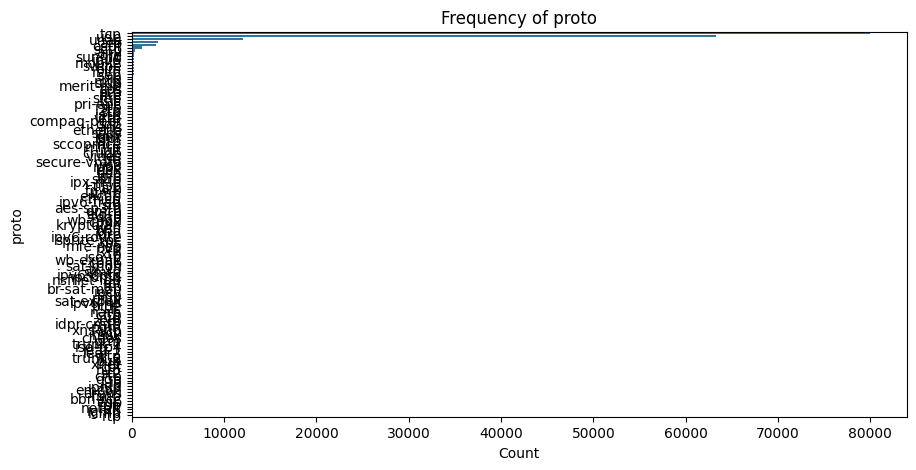

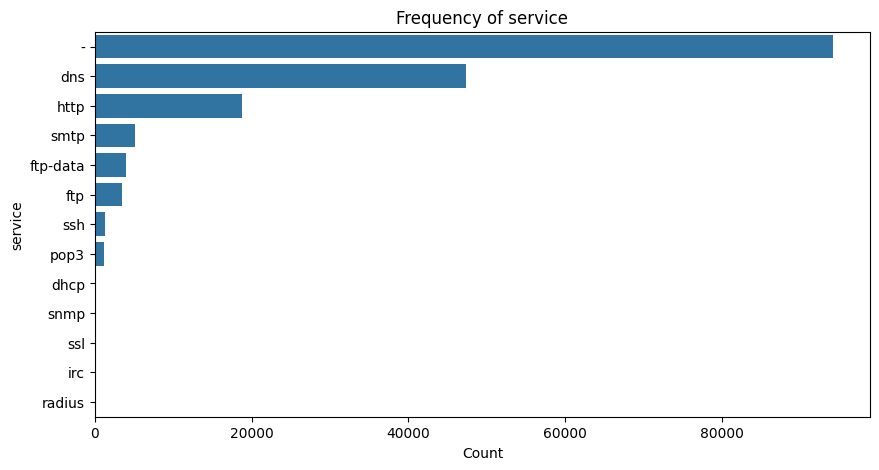

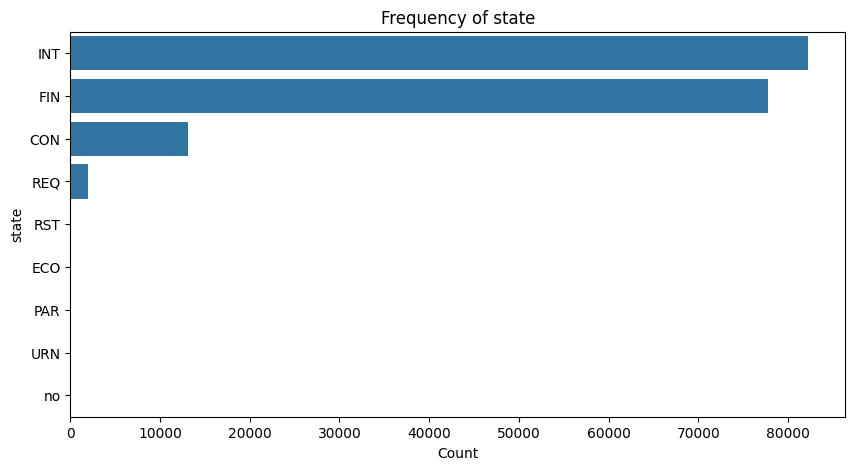

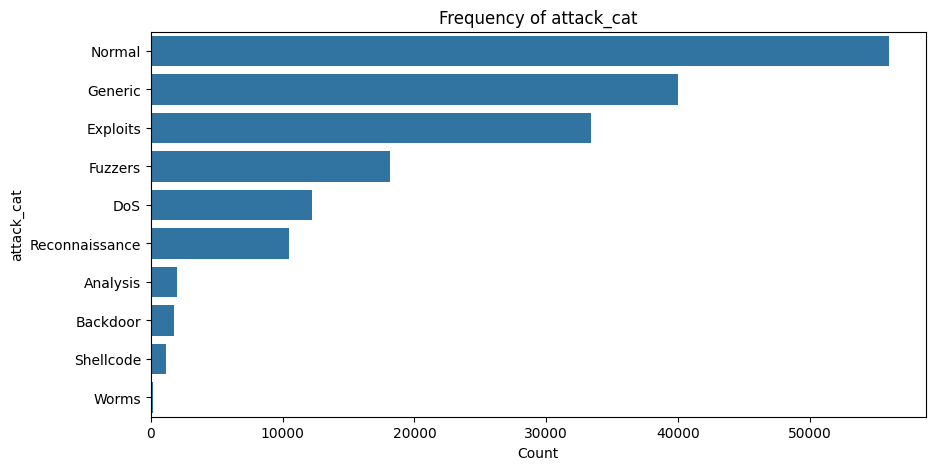

In [64]:
for col in categorical_cols:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=col, data=df_train, order=df_train[col].value_counts().index)
    plt.title(f'Frequency of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
    plt.show()

# Density Plots:

Estimate the probability density function of a continuous variable, providing a smoothed visualization of the distribution.

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


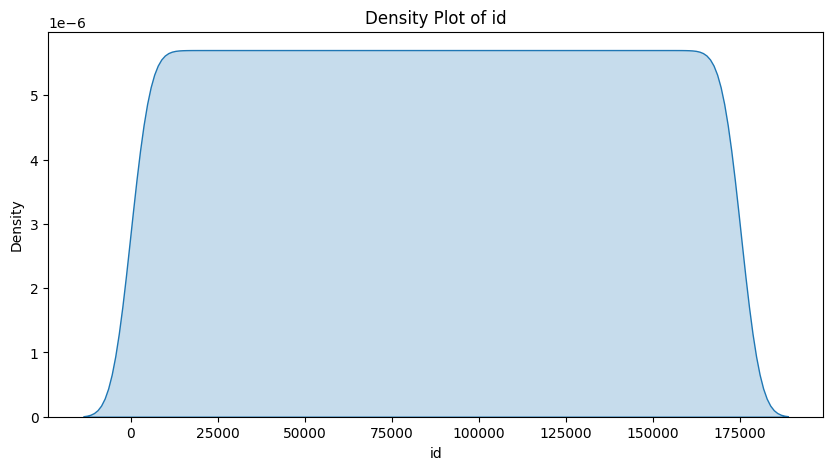

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


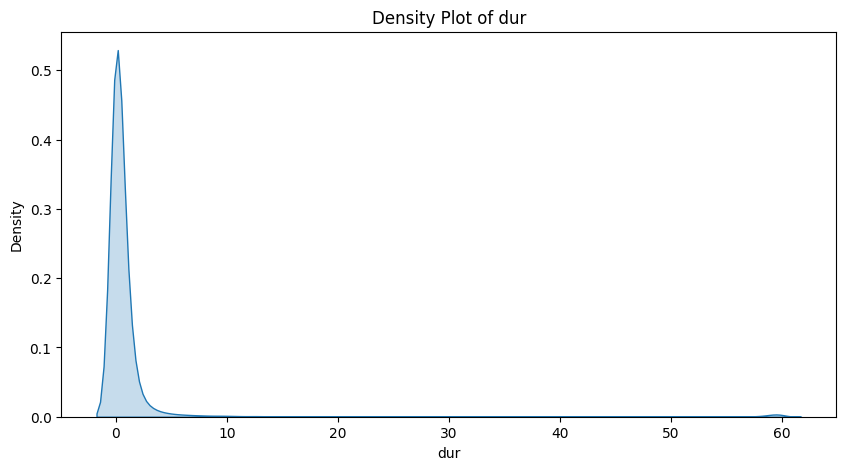

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


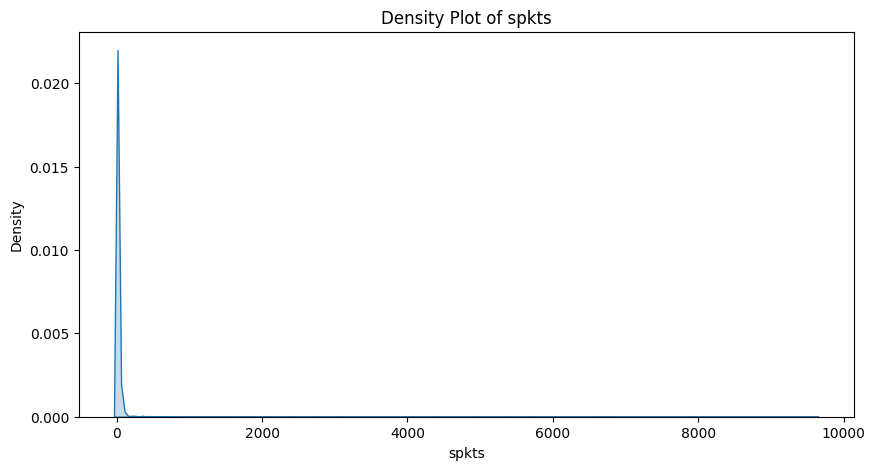

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


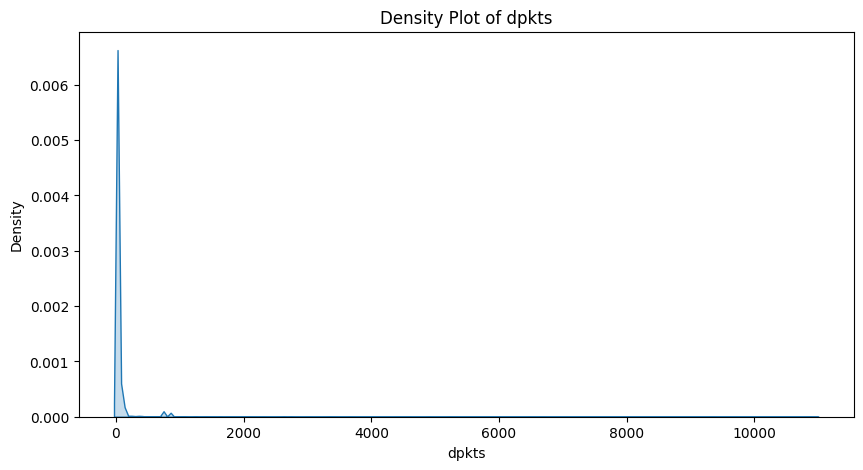

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


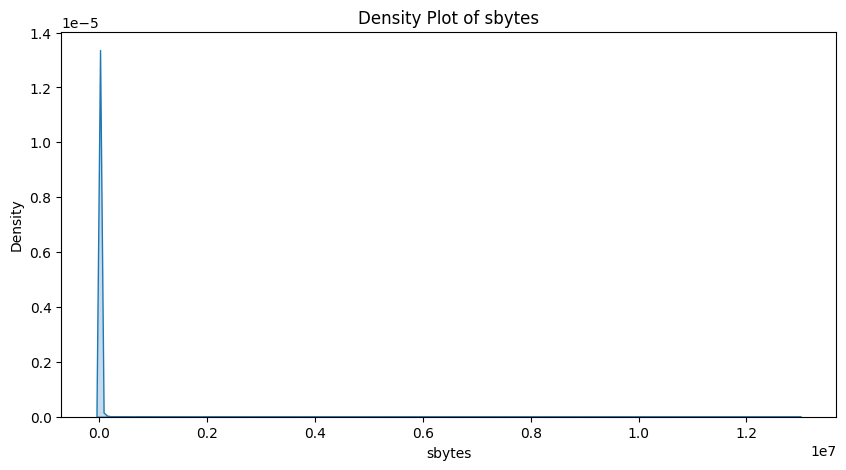

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


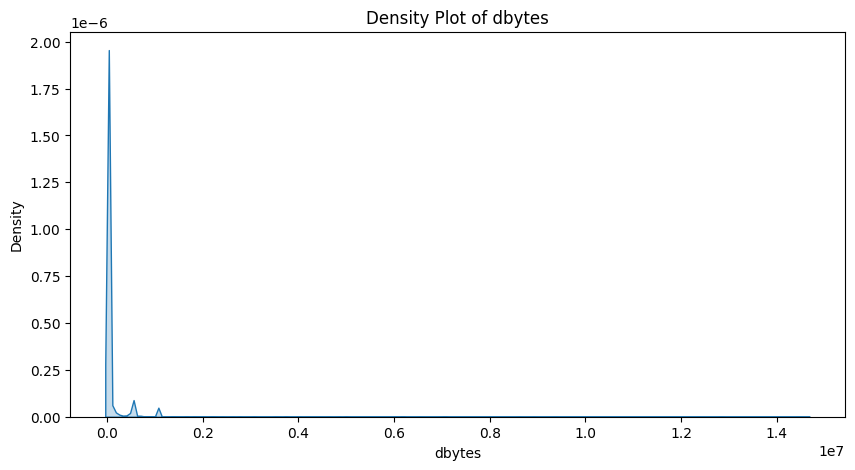

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


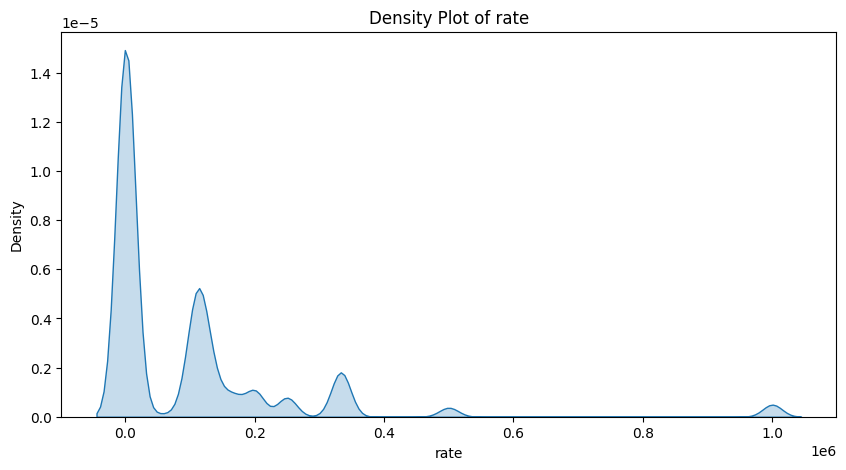

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


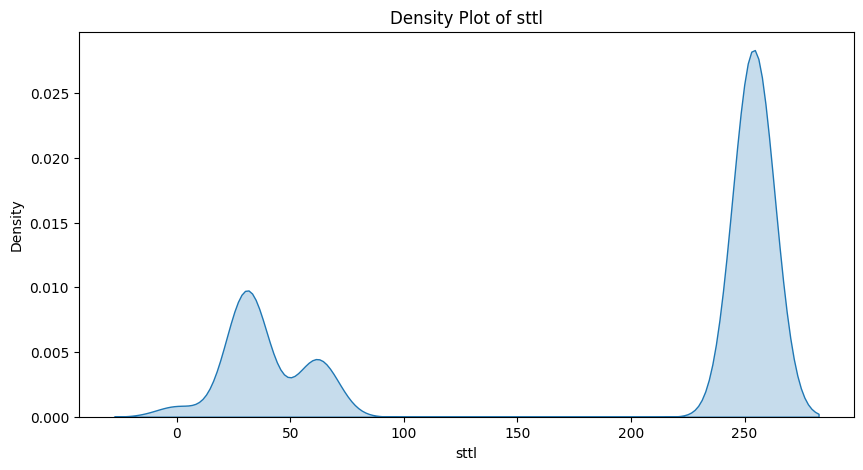

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


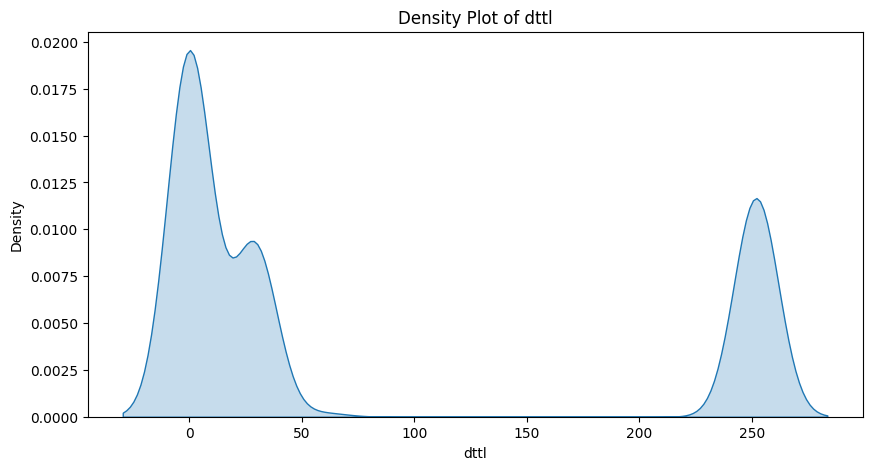

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


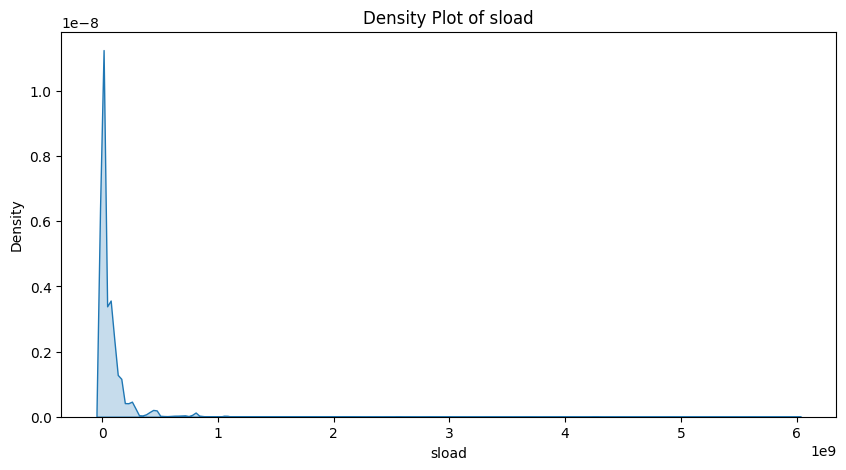

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


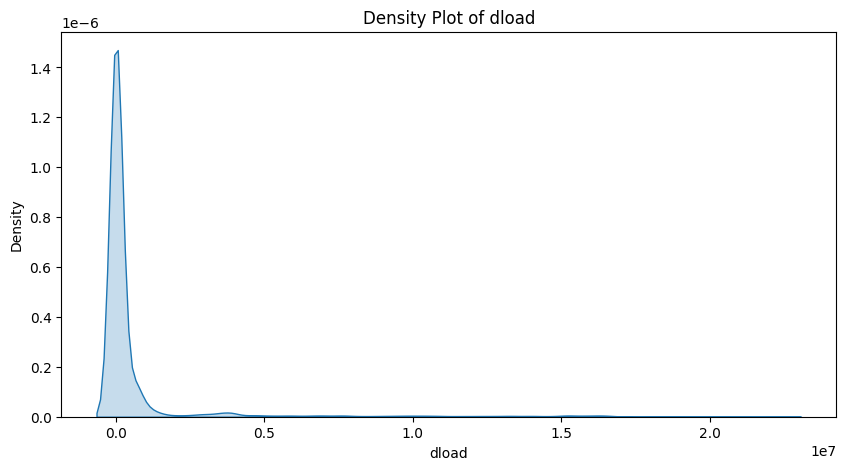

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


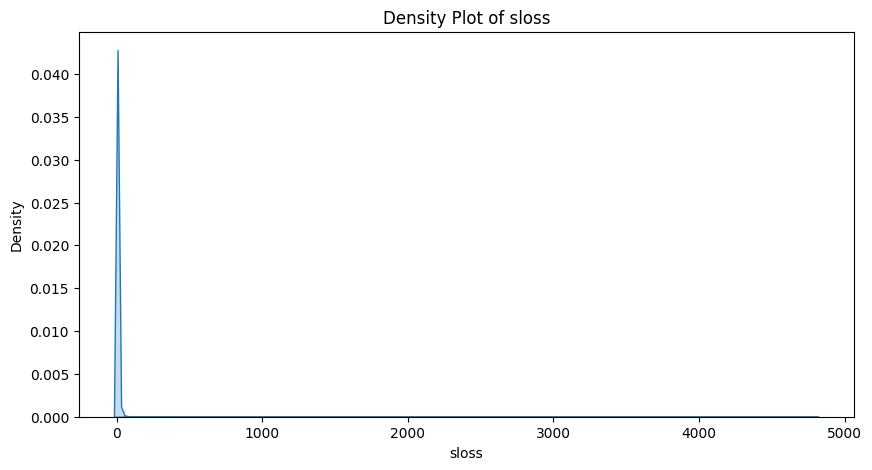

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


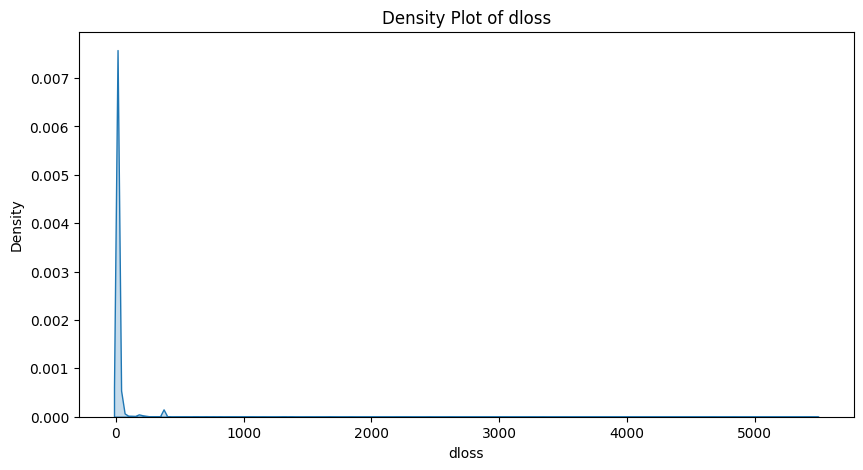

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


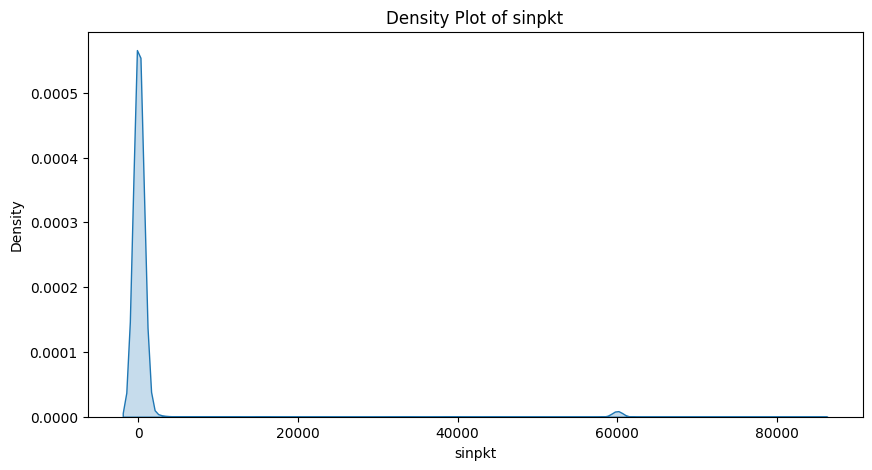

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


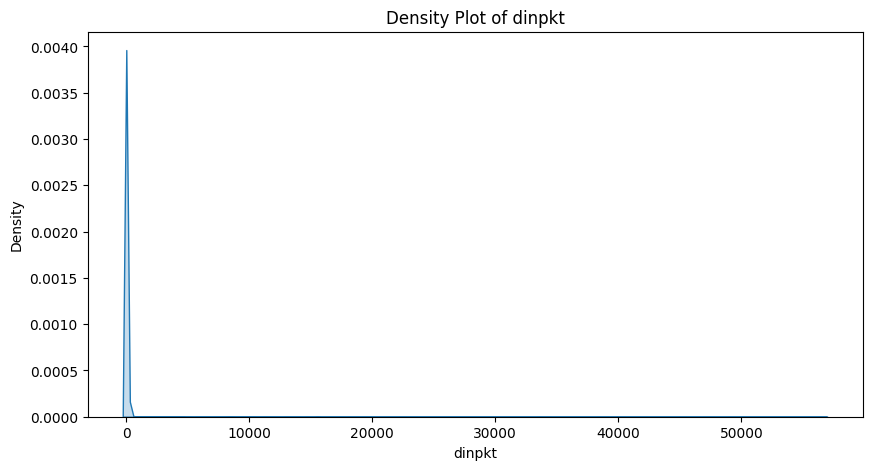

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


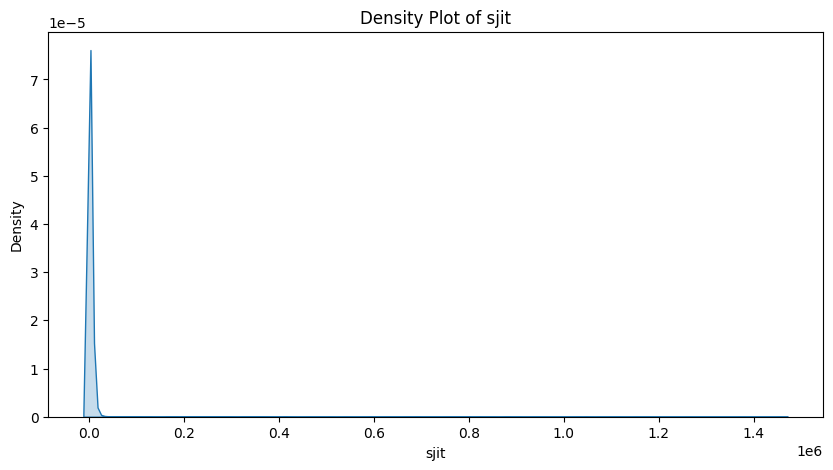

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


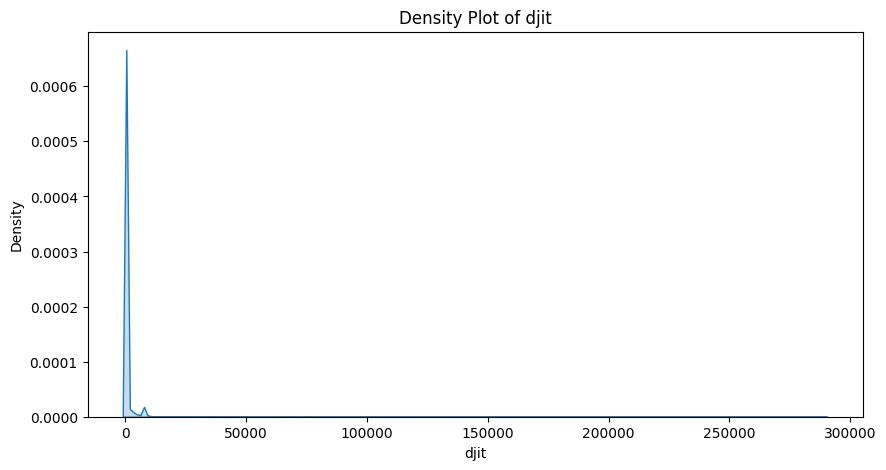

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


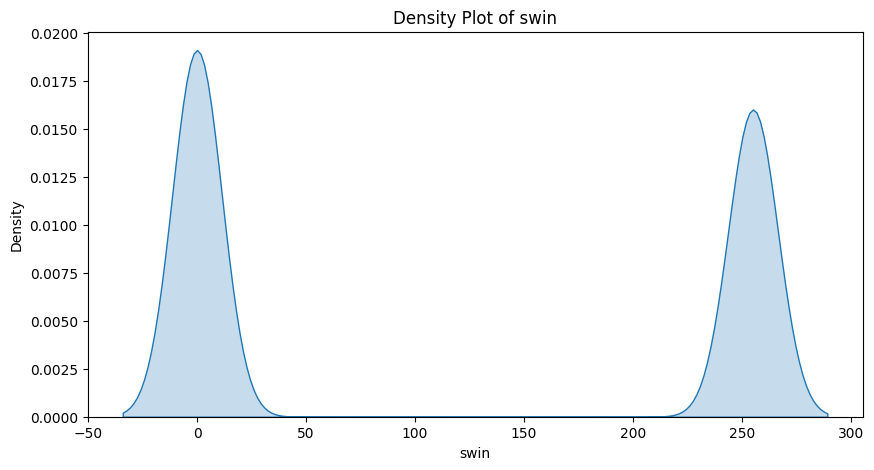

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


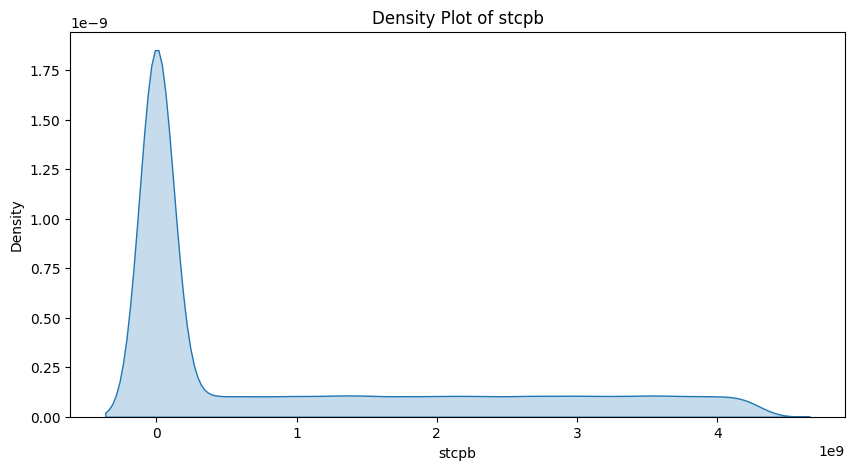

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


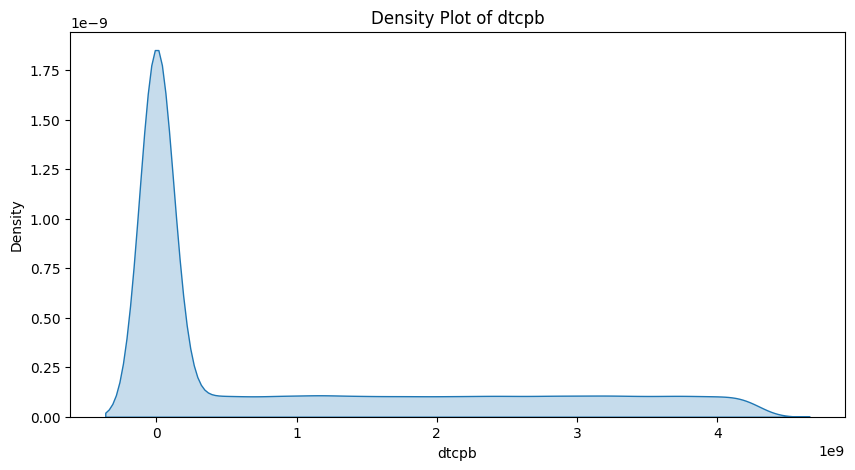

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


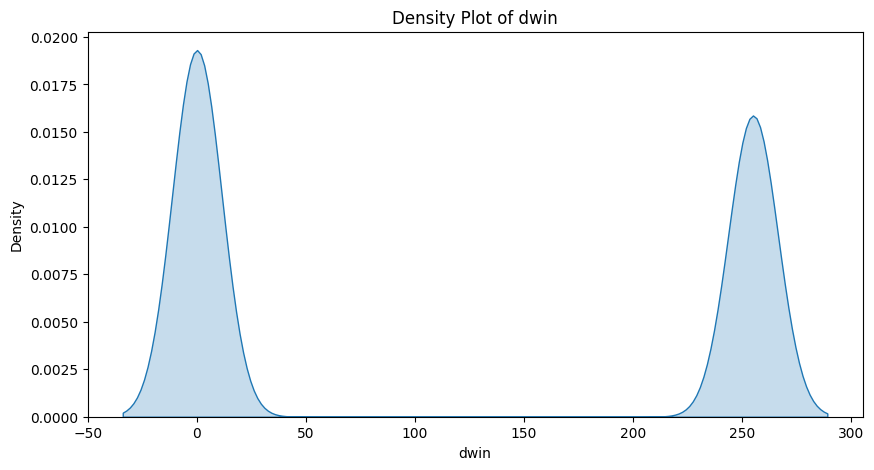

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


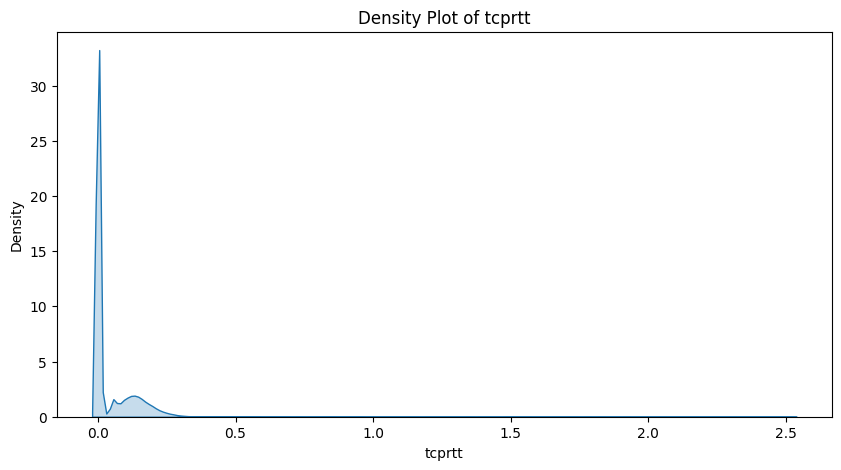

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


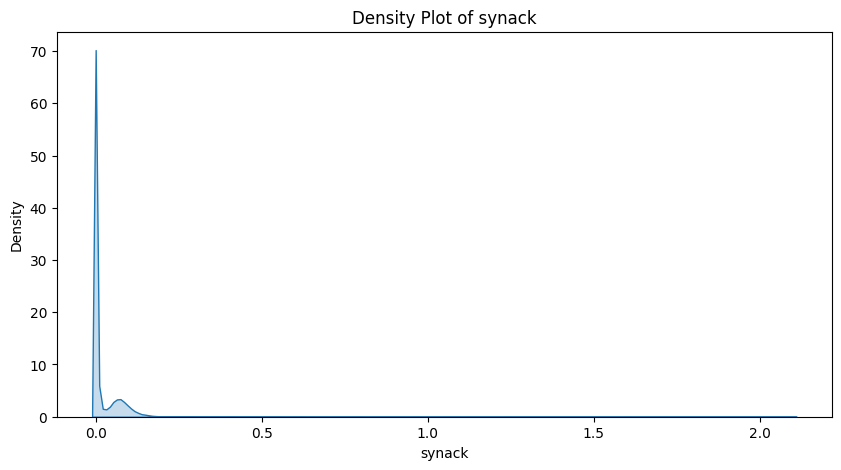

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


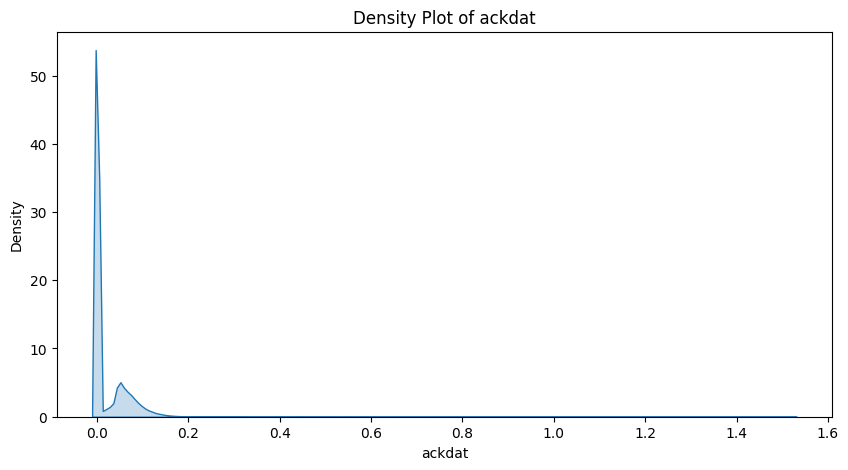

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


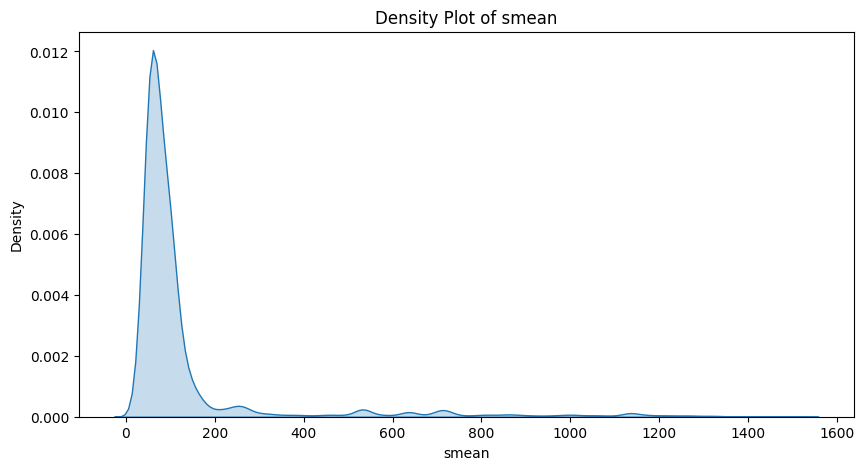

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


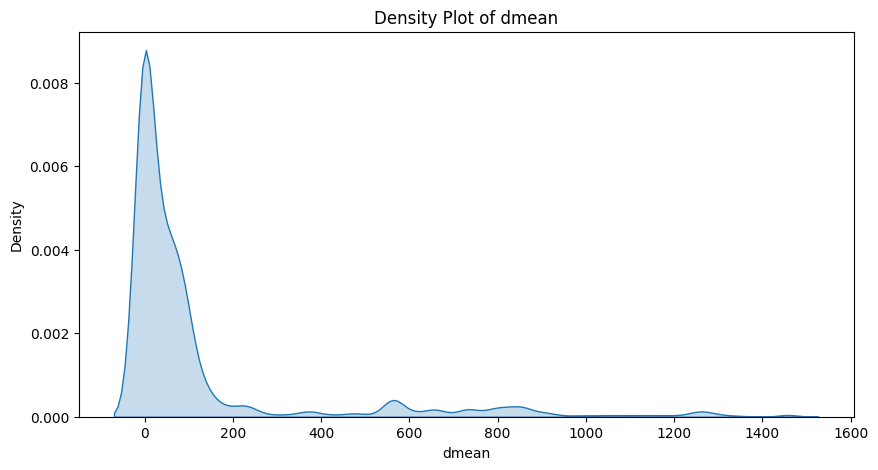

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


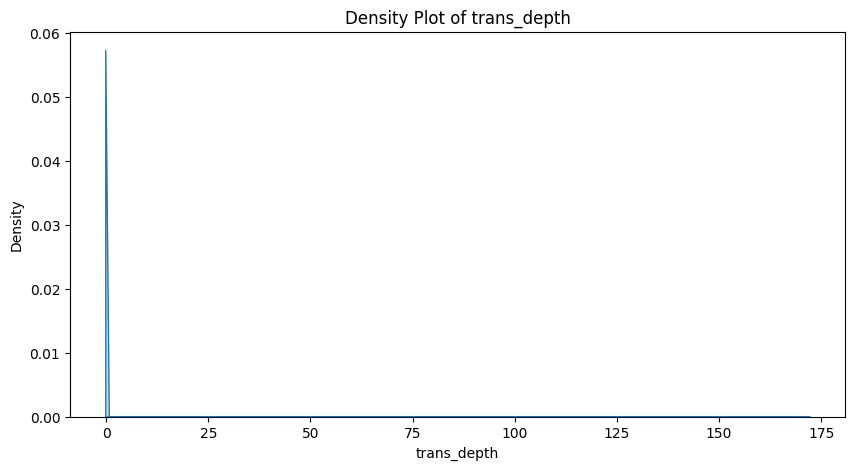

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


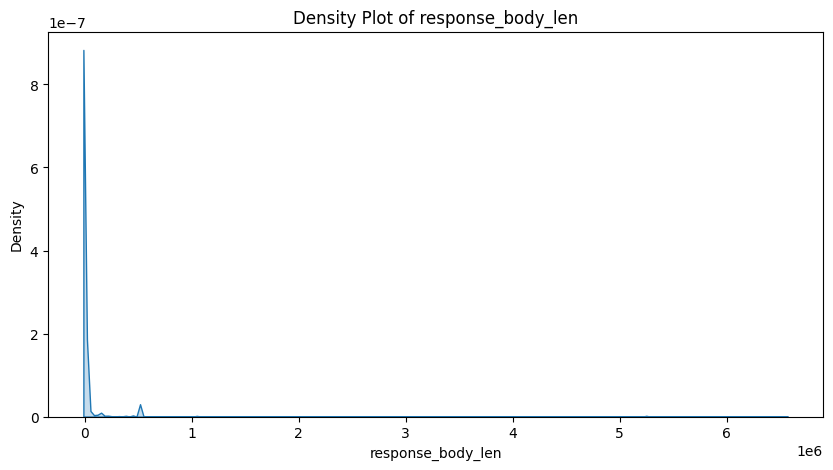

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


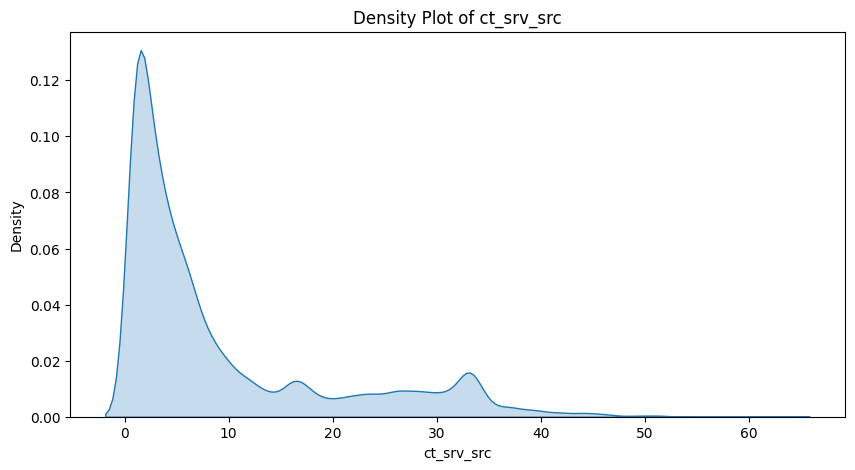

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


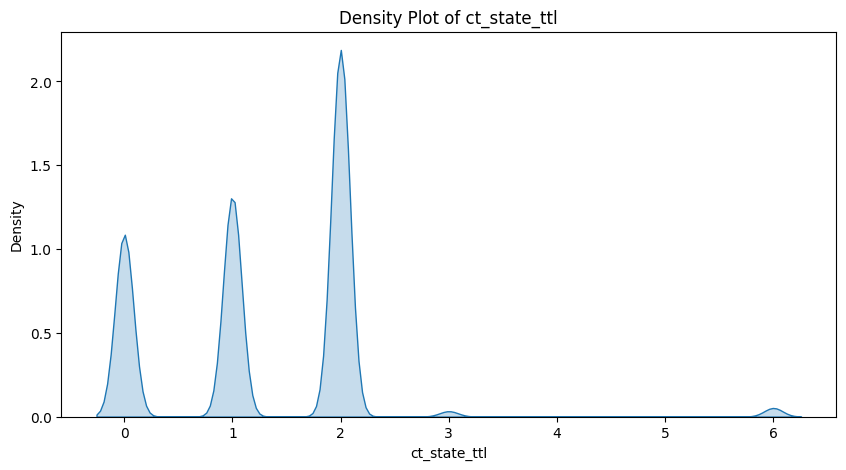

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


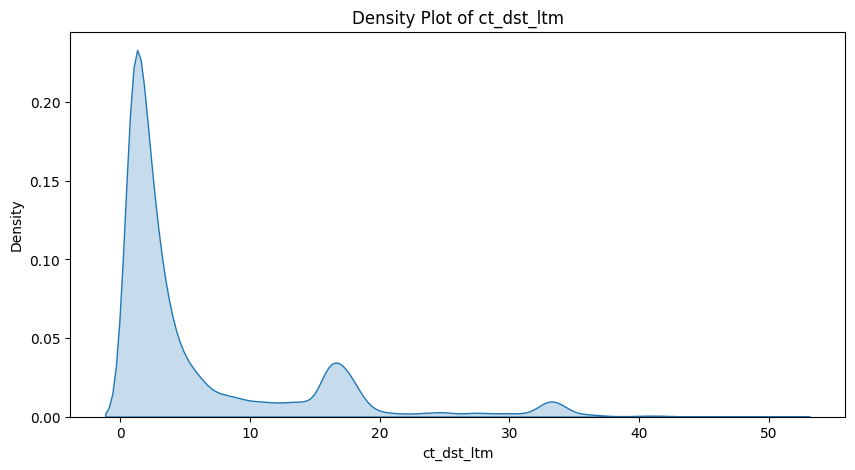

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


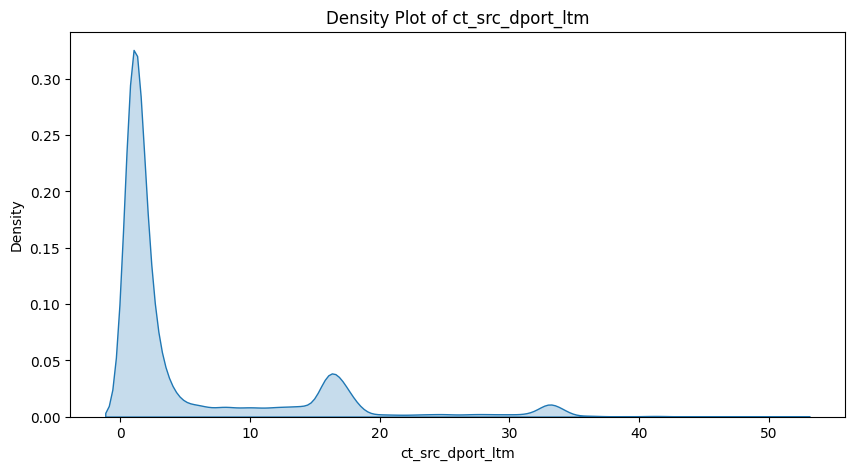

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


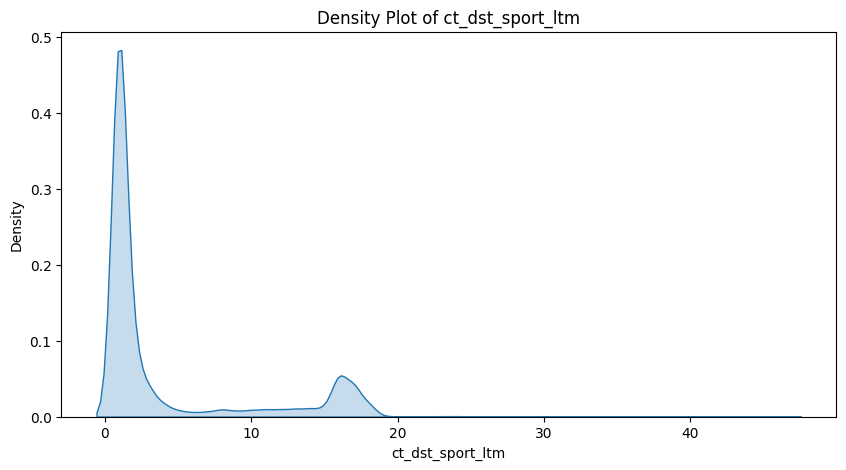

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


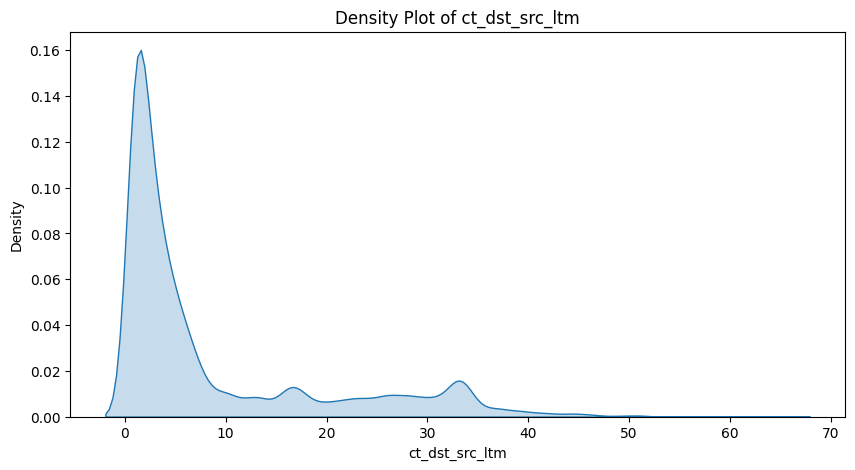

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


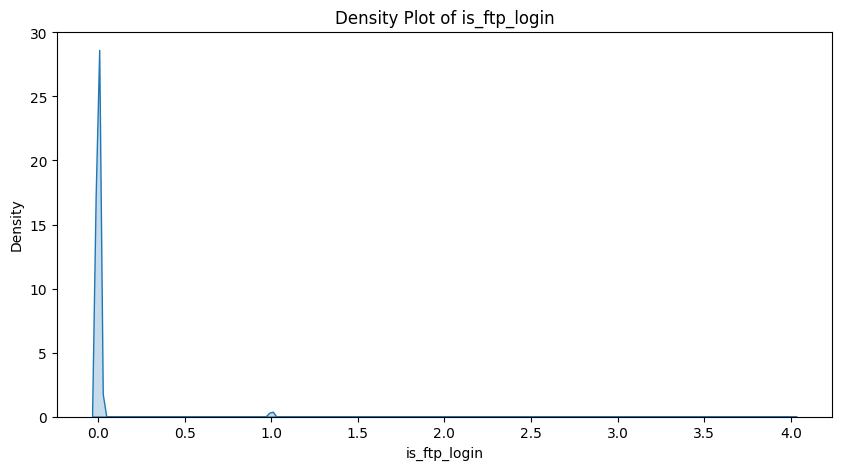

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


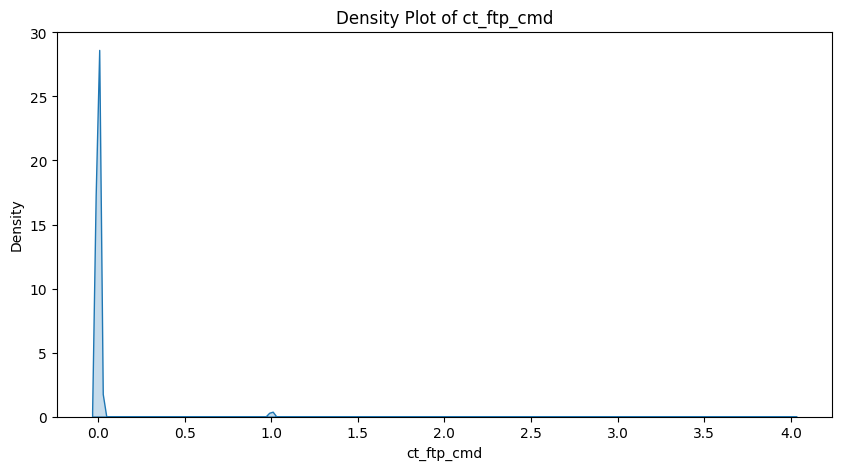

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


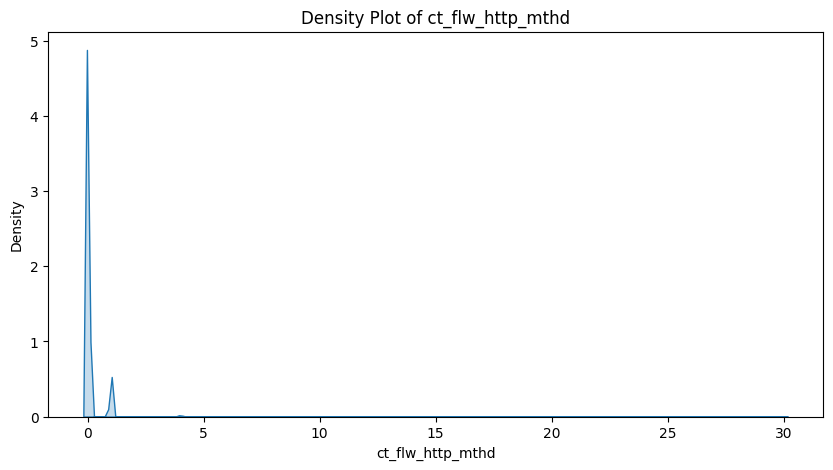

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


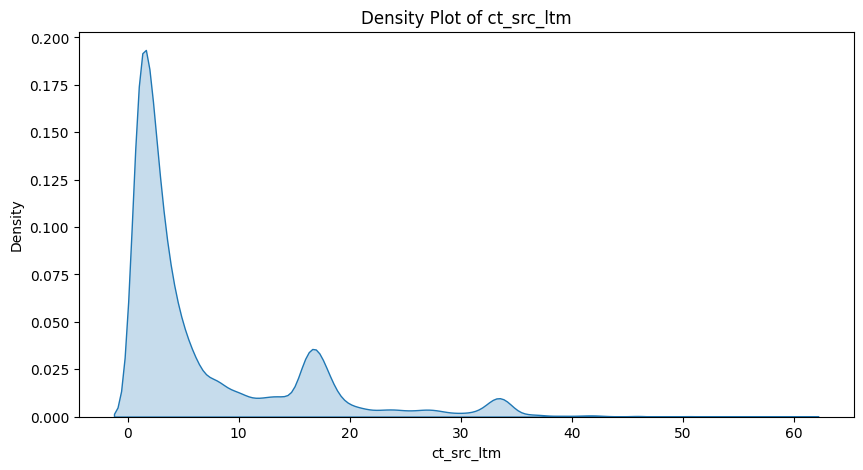

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


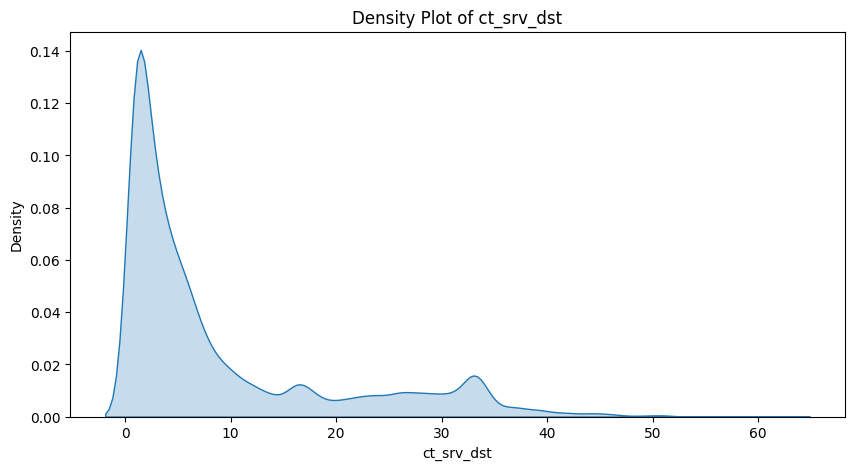

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


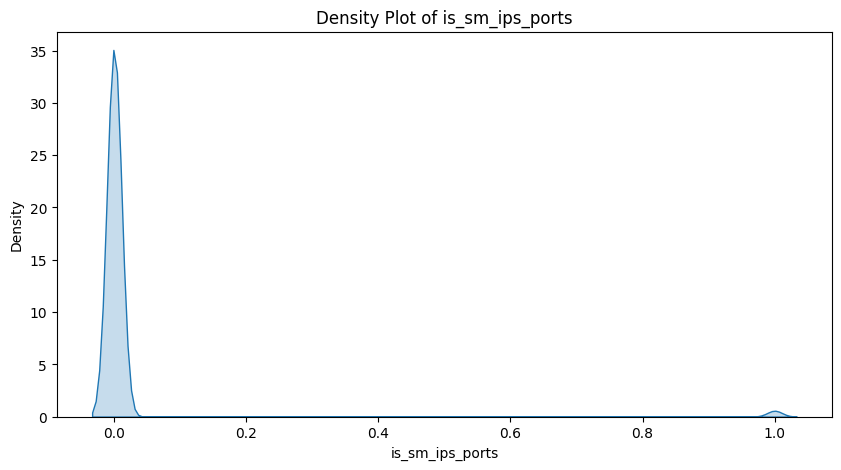

<ipython-input-65-e8bc085df904>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_train[col], shade=True)


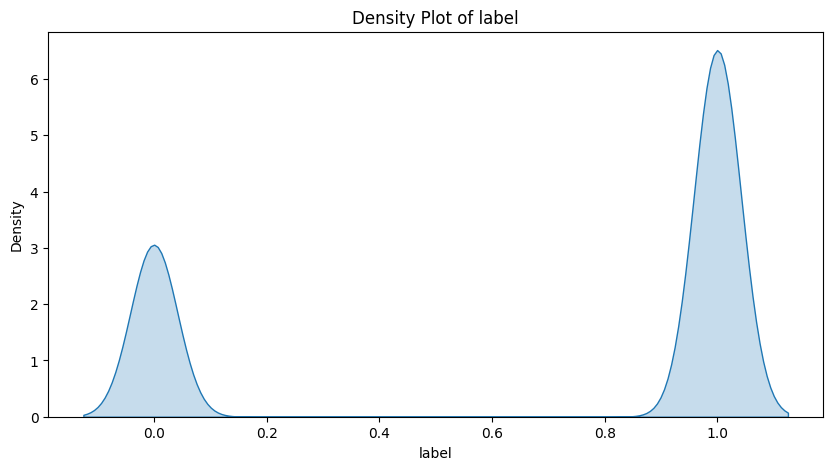

In [65]:
for col in numerical_cols:
    plt.figure(figsize=(10, 5))
    sns.kdeplot(df_train[col], shade=True)
    plt.title(f'Density Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.show()

# Outlier Detection:

Identify data points that deviate significantly from the rest of the dataset, which can be crucial for data cleaning.

In [66]:
# Select only numeric columns
numeric_cols = df_train.select_dtypes(include=['number'])

# Calculate the first and third quartiles
Q1 = numeric_cols.quantile(0.25)
Q3 = numeric_cols.quantile(0.75)

# Compute the Interquartile Range (IQR)
IQR = Q3 - Q1

# Identify outliers
outliers = ((numeric_cols < (Q1 - 1.5 * IQR)) | (numeric_cols > (Q3 + 1.5 * IQR))).sum()

print(f'Number of outliers in each numeric column:\n{outliers}')

Number of outliers in each numeric column:
id                       0
dur                  15741
spkts                24675
dpkts                20830
sbytes               22873
dbytes               28131
rate                 17340
sttl                     0
dttl                     0
sload                13518
dload                38143
sloss                11467
dloss                28388
sinpkt               14788
dinpkt               14096
sjit                 18033
djit                 20574
swin                     0
stcpb                    0
dtcpb                    0
dwin                     0
tcprtt               15878
synack               31462
ackdat                8290
smean                20725
dmean                23359
trans_depth          17840
response_body_len    11294
ct_srv_src           19390
ct_state_ttl          1930
ct_dst_ltm           22152
ct_src_dport_ltm     33423
ct_dst_sport_ltm     37337
ct_dst_src_ltm       17752
is_ftp_login          2567
ct_ftp_cmd  

# Dealing with Ouliers in df_train

In [75]:
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd

# Assuming df_train is already loaded and ready to use
numeric_columns_train = [
    'dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl', 'dttl', 'sload',
    'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt', 'sjit', 'djit', 'swin', 'stcpb',
    'dtcpb', 'dwin', 'tcprtt', 'synack', 'ackdat', 'smean', 'dmean', 'trans_depth',
    'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm', 'ct_src_dport_ltm',
    'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'is_ftp_login', 'ct_ftp_cmd',
    'ct_flw_http_mthd', 'ct_src_ltm', 'ct_srv_dst', 'is_sm_ips_ports'
]

# Downcasting numeric columns to reduce memory usage
df_train[numeric_columns_train] = df_train[numeric_columns_train].apply(pd.to_numeric, downcast='float')

# Initializing the scaler
scaler = StandardScaler()

# Splitting the dataset into manageable chunks
chunk_size = 50000  # Adjust the chunk size to avoid memory overload
n_chunks = len(df_train) // chunk_size + 1

for i in range(n_chunks):
    # Creating a chunk from the original df_train
    chunk = df_train.iloc[i * chunk_size: (i + 1) * chunk_size].copy()  # Copy to avoid modifying a view

    # Scaling the data using StandardScaler
    scaled_chunk_data = scaler.fit_transform(chunk[numeric_columns_train])

    # Convert scaled data back to DataFrame for further manipulation
    scaled_chunk_df = pd.DataFrame(scaled_chunk_data, columns=numeric_columns_train)

    # Identifying outliers using Z-score (values beyond 3 standard deviations are considered outliers)
    outliers_mask_chunk = (np.abs(scaled_chunk_df) > 3)

    # Replace outliers with NaN for imputation
    scaled_chunk_df[outliers_mask_chunk] = np.nan

    # Impute missing values using the median (as it's less sensitive to outliers)
    imputed_chunk_data = scaled_chunk_df.fillna(scaled_chunk_df.median())

    # Inverse scaling to return data to original distribution
    imputed_chunk_original_scale = scaler.inverse_transform(imputed_chunk_data)

    # Convert back to DataFrame with original columns
    df_chunk_imputed = pd.DataFrame(imputed_chunk_original_scale, columns=numeric_columns_train)

    # Ensure the data types match between imputed and original DataFrames
    for column in numeric_columns_train:
        if df_train[column].dtype == 'int64':
            df_chunk_imputed[column] = df_chunk_imputed[column].round().astype('int64')

    # Update the original df_train with the imputed values for the chunk using .loc to avoid warnings
    df_train.loc[i * chunk_size: (i + 1) * chunk_size - 1, numeric_columns_train] = df_chunk_imputed.values

# Display the updated DataFrame in the notebook
from IPython.display import display
display(df_train.head())

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,...,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label
0,1,0.121478,tcp,-,FIN,6.0,4.0,258.0,172.0,74.087490,...,1.0,1.0,0.0,0.0,0.0,1.0,1.0,8.673617e-19,Normal,0
1,2,0.649902,tcp,-,FIN,14.0,38.0,734.0,42014.0,78.473372,...,1.0,2.0,0.0,0.0,0.0,1.0,6.0,8.673617e-19,Normal,0
2,3,1.623129,tcp,-,FIN,8.0,16.0,364.0,13186.0,14.170161,...,1.0,3.0,0.0,0.0,0.0,2.0,6.0,8.673617e-19,Normal,0
3,4,1.681642,tcp,ftp,FIN,12.0,12.0,628.0,770.0,13.677108,...,1.0,3.0,0.0,0.0,0.0,2.0,1.0,8.673617e-19,Normal,0
4,5,0.449454,tcp,-,FIN,10.0,6.0,534.0,268.0,33.373826,...,1.0,2.0,0.0,0.0,0.0,2.0,4.0,8.673617e-19,Normal,0


# Bivariate Analysis

Bivariate analysis involves examining the relationship between two variables, which helps to understand the correlations, dependencies, and patterns between features. Here are some common approaches you can take for this analysis:

Correlation Matrix: To identify relationships between numerical variables.
Scatter Plots: Useful for visualizing relationships between pairs of continuous variables.
Box Plots: Can be used to analyze relationships between a categorical variable and a numerical variable.
Pairwise Comparisons: Using scatterplot matrices for multiple features to visualize relationships more comprehensively.


---



# df_test Bivariate Analysis

1. Generate the Correlation Matrix and Heatmap
This will help you visualize the correlation between all numeric columns in df_test.

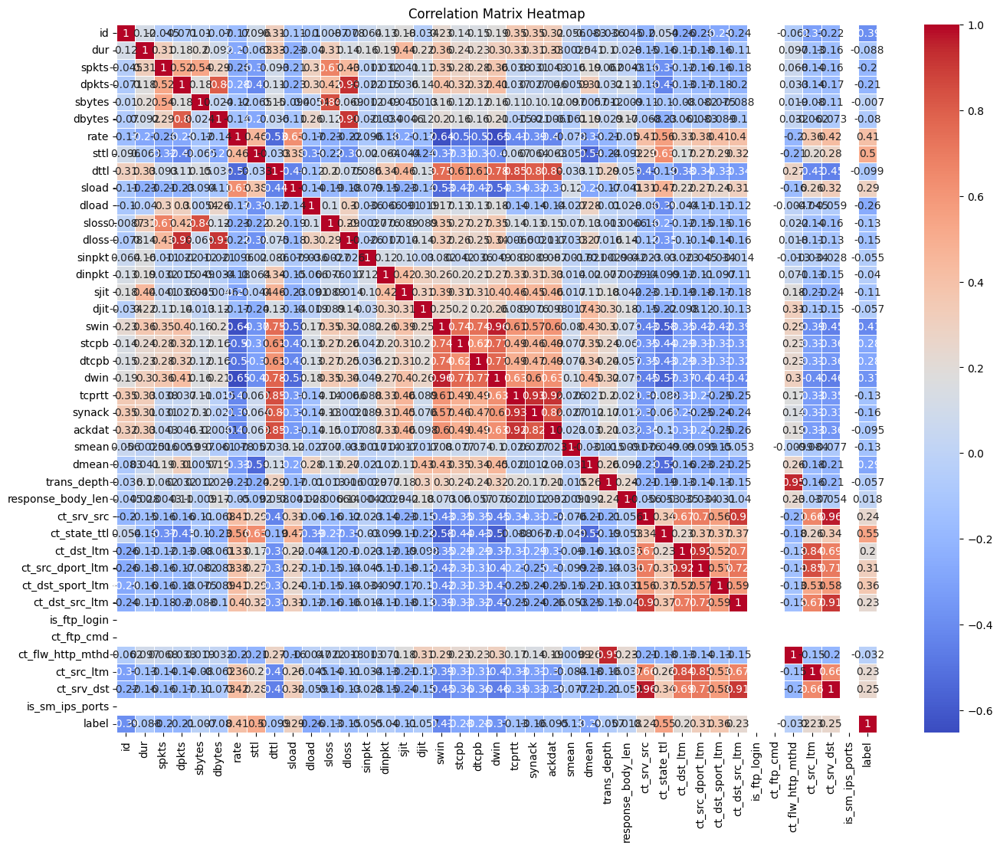

In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# Selecting only numeric columns for correlation
numeric_df_test = df_test.select_dtypes(include=['float64', 'int64'])

# Create a correlation matrix for numeric columns only
correlation_matrix = numeric_df_test.corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Matrix Heatmap")
plt.show()

2. Scatter Plot Matrix for Selected Features
Since plotting all features at once would be overwhelming, here we plot a subset of highly correlated pairs or key variables. If you find strong correlations in the heatmap, you can modify this to include those variables.

<Figure size 2000x2000 with 0 Axes>

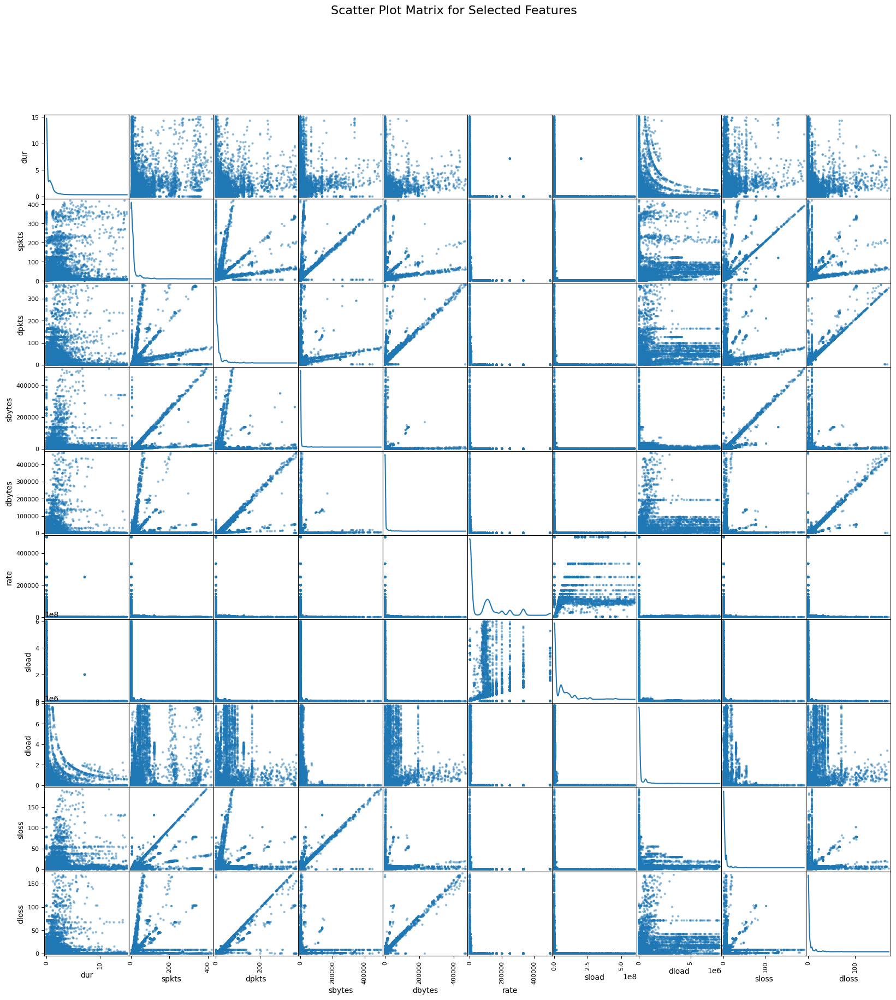

In [99]:
from pandas.plotting import scatter_matrix

# Select a few numeric features for pairwise scatter plotting
selected_features = [
    'dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sload', 'dload', 'sloss', 'dloss'
]

# Generate scatter plot matrix
plt.figure(figsize=(20, 20))
scatter_matrix(df_test[selected_features], alpha=0.5, figsize=(20, 20), diagonal='kde')
plt.suptitle("Scatter Plot Matrix for Selected Features", size=16)
plt.show()

### Observations from the Correlation Matrix Heatmap:
1. **Strong Correlations**:
   - Features like `sbytes` (source bytes) and `dbytes` (destination bytes) show a very strong positive correlation (`~1`). This indicates that these two variables change together, potentially making one of them redundant during modeling.
   - Similar strong correlations can be seen between `sload` and `dload`, indicating a direct relationship between source and destination loads.
  
2. **Potential Redundancies**:
   - `spkts` (source packets) and `dpkts` (destination packets) also exhibit high correlation, suggesting these features may capture similar information.
   - `ct_dst_sport_ltm`, `ct_dst_src_ltm`, and `ct_src_dport_ltm` show clusters of strong correlations with each other, possibly implying multicollinearity among these features.

3. **Weak Correlations with `label`**:
   - The `label` column, which likely represents the target class, has generally weak correlations with most of the features. This might mean that more complex relationships exist that aren’t linear or that more feature engineering could help.

### Observations from the Scatter Plot Matrix:
1. **Non-linear Relationships**:
   - The scatter plots suggest that some relationships between variables are not purely linear. There are curved patterns in several plots, indicating non-linear dependencies.
   
2. **Clusters and Patterns**:
   - You might also notice some scattered, clustered patterns. These clusters could potentially indicate different types of network behaviors or activities, which might be useful for identifying groups or patterns in your data.

### Recommendations:
1. **Dimensionality Reduction**:
   - You could consider applying **Principal Component Analysis (PCA)** or **Feature Selection** to reduce redundancy, especially for features that show high correlations with each other.

2. **Feature Engineering**:
   - Explore possible non-linear transformations for some variables, such as taking the log, square root, or interaction terms to capture the non-linear relationships observed in the scatter plots.

3. **Handling Multicollinearity**:
   - Features with extremely high correlation might need to be dropped or combined to avoid multicollinearity issues in predictive modeling.

### Next Steps:
- Would you like me to help you with feature engineering (e.g., interaction terms, log transformations)?
- Or maybe take a step towards dimensionality reduction like PCA to simplify the dataset?
- We could also start building some basic models to see how these features perform.



# df_train Bivariate Analysis

1. Generate the Correlation Matrix and Heatmap
This will help you visualize the correlation between all numeric columns in df_train.

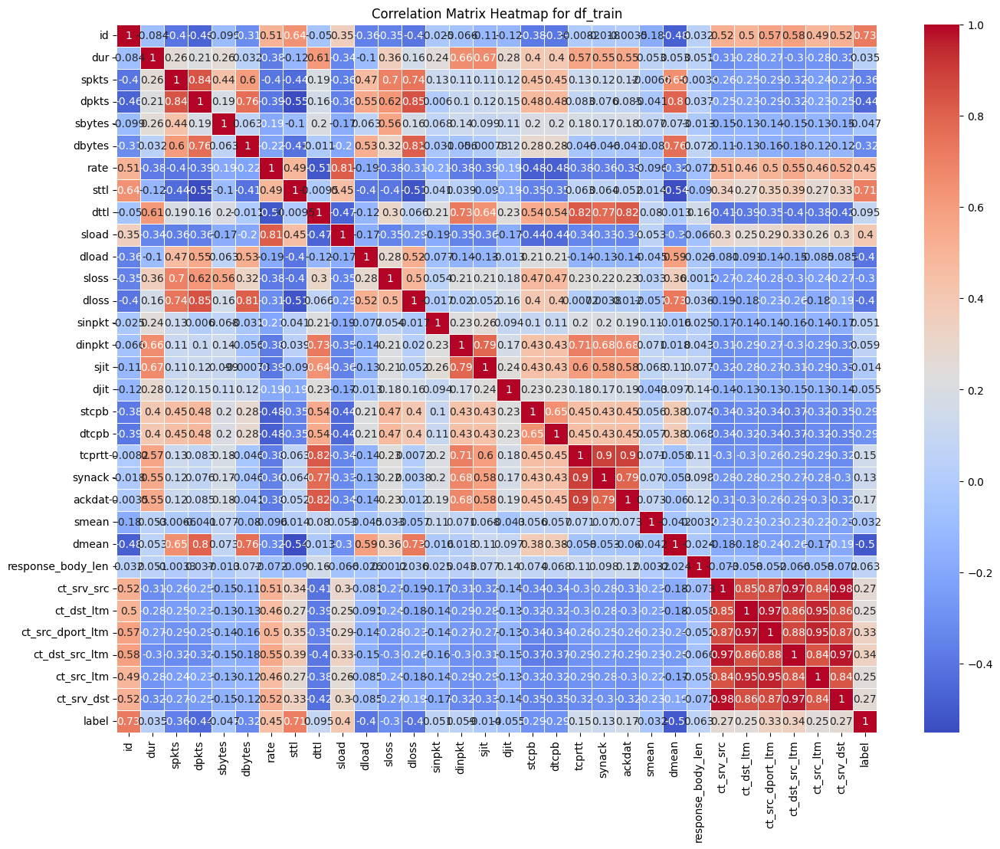

In [80]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df_train is already loaded

# Selecting only numeric columns for correlation
numeric_df_train = df_train.select_dtypes(include=['float64', 'int64'])

# Create a correlation matrix for numeric columns only
correlation_matrix_train = numeric_df_train.corr()

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(correlation_matrix_train, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Matrix Heatmap for df_train")
plt.show()

2. Scatter Plot Matrix for Selected Features in df_train
This scatter plot will help visualize relationships between a subset of selected numeric columns.

<Figure size 2000x2000 with 0 Axes>

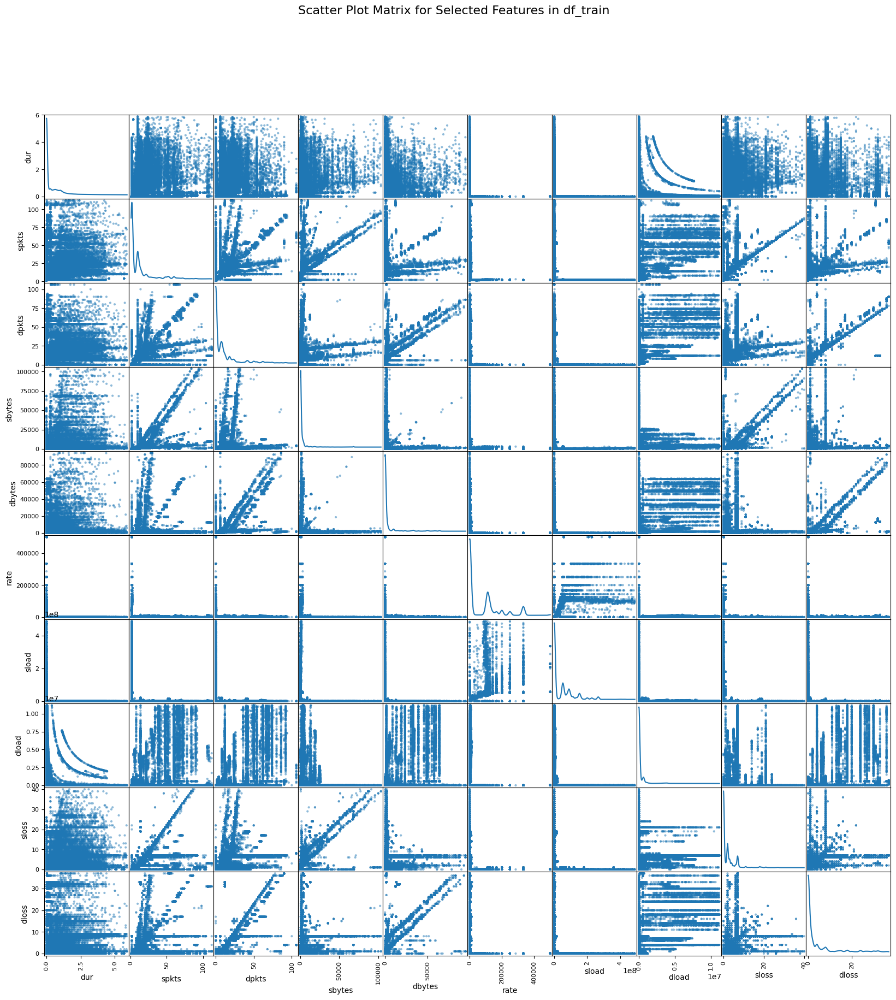

In [81]:
from pandas.plotting import scatter_matrix

# Select a few numeric features for pairwise scatter plotting
selected_features_train = [
    'dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sload', 'dload', 'sloss', 'dloss'
]

# Generate scatter plot matrix for selected features
plt.figure(figsize=(20, 20))
scatter_matrix(df_train[selected_features_train], alpha=0.5, figsize=(20, 20), diagonal='kde')
plt.suptitle("Scatter Plot Matrix for Selected Features in df_train", size=16)
plt.show()

These visuals provide a lot of information about the relationships between features in `df_train`, and they seem quite consistent with the observations from `df_test`. Let’s break it down similarly.

### Observations from the Correlation Matrix Heatmap (`df_train`):
1. **Strong Correlations**:
   - Features like **`sbytes`** and **`dbytes`** show an extremely high positive correlation, nearly `1.0`. This is consistent with the `df_test` observations and suggests a redundancy where one variable could effectively be represented by the other.
   - Similar high correlations are seen between **`spkts`** (source packets) and **`dpkts`** (destination packets), suggesting strong interaction between these variables.
   - Strong positive correlations are also seen in features like **`sload`** and **`dload`** (`0.99`). This again indicates redundancy, which may need addressing during feature engineering.
   - The columns **`ct_dst_ltm`**, **`ct_dst_sport_ltm`**, **`ct_src_dport_ltm`**, and **`ct_dst_src_ltm`** exhibit strong correlations, indicating potential multicollinearity, which may affect model interpretability.

2. **Target Correlation (`label`)**:
   - The **`label`** column (which is likely the target variable) shows weak to moderate correlations with a few features.
   - Features such as **`ct_srv_src`** (`0.25`) and **`ct_dst_src_ltm`** (`0.27`) have slightly higher correlations, which might suggest some predictive capability. However, generally, the correlations are weak, indicating potential non-linear relationships or interactions that could be more important for classification.

3. **Negative Correlations**:
   - **`rate`**, **`sloss`**, and **`dloss`** exhibit some negative correlations with `label`, which might indicate that higher values for these features could reduce the likelihood of a specific target class.

### Observations from the Scatter Plot Matrix (`df_train`):
1. **Linear and Non-linear Relationships**:
   - There are notable **linear relationships** between some variables, such as **`sbytes`** and **`dbytes`**, or **`sload`** and **`dload`**. These strong linear patterns can be a sign of redundancy, which may require either feature elimination or a combination strategy during feature engineering.
   - Some features, such as **`rate`** vs **`sbytes`**, show a curved or clustered pattern, indicating a **non-linear relationship**. Non-linear transformations or feature engineering may be helpful in such cases.

2. **Cluster Formation**:
   - You can notice some **clusters** within the scatter plots (e.g., **`dload`** vs **`sloss`**). These clusters could indicate different types of network behavior or data segments (possibly representing different classes or scenarios).

3. **Multicollinearity Evidence**:
   - A lot of scatter plots show a strong linear overlap between features, especially when it comes to packet counts and bytes, reinforcing the observation of **multicollinearity** among them. This needs to be addressed either through **dimensionality reduction** (e.g., PCA) or by selectively dropping features that are heavily correlated.

### Summary of Insights for Feature Engineering:
1. **Reduce Multicollinearity**:
   - There are several highly correlated features that might cause multicollinearity, such as `sbytes` vs `dbytes`, `spkts` vs `dpkts`, `sload` vs `dload`, and features starting with `ct_`. You could consider:
     - Dropping one of each pair of highly correlated features.
     - Using **Principal Component Analysis (PCA)** to reduce redundancy while retaining the variability.

2. **Non-linear Relationships**:
   - Some features seem to exhibit **non-linear relationships**. We could apply transformations such as logarithms or square roots to improve model fit, especially for variables like **`rate`**, **`sloss`**, and **`dloss`**, which have skewed distributions.

3. **New Feature Construction**:
   - Since there are moderate correlations between certain features and the target (`label`), we could create **interaction terms** between them or group features to see if they collectively provide a stronger relationship with the target variable.


Steps for Dimensionality Reduction:
Identify Highly Correlated Features:

Use the correlation matrix to identify features with high correlations (e.g., above 0.9). We can remove these highly correlated features since they tend to add redundant information.
Principal Component Analysis (PCA):

Apply PCA to create a smaller number of principal components that still retain most of the data's variability. This is especially useful here, given the high correlations observed.
Here’s the step-by-step code for dimensionality reduction using PCA:

1. Remove Highly Correlated Features
This step is to directly drop features that are very highly correlated, usually above a set threshold (e.g., 0.95).

In [82]:
# Select only numeric columns for correlation analysis
numeric_df_train = df_train.select_dtypes(include=['float64', 'int64'])

# Create a correlation matrix
correlation_matrix = numeric_df_train.corr().abs()

# Create a mask for selecting upper triangle of the correlation matrix
upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Identify features with a correlation greater than 0.95
high_correlation_features = [column for column in upper_triangle.columns if any(upper_triangle[column] > 0.95)]

# Drop highly correlated features from the dataframe
df_train_reduced = numeric_df_train.drop(columns=high_correlation_features)

print(f"Highly correlated features dropped: {high_correlation_features}")

Highly correlated features dropped: ['ct_src_dport_ltm', 'ct_dst_src_ltm', 'ct_src_ltm', 'ct_srv_dst']


2. Apply PCA

Now, we'll apply PCA to the remaining numeric features to further reduce the dimensionality.

Explained variance by each principal component: [0.30893626 0.1922211  0.07286664 0.04922997 0.04320803 0.03948843
 0.03619816 0.03281368 0.02980596 0.02502164 0.02246403 0.01972691
 0.01757921 0.01477254 0.01258251 0.01182534 0.01007543 0.00844845
 0.00764962]


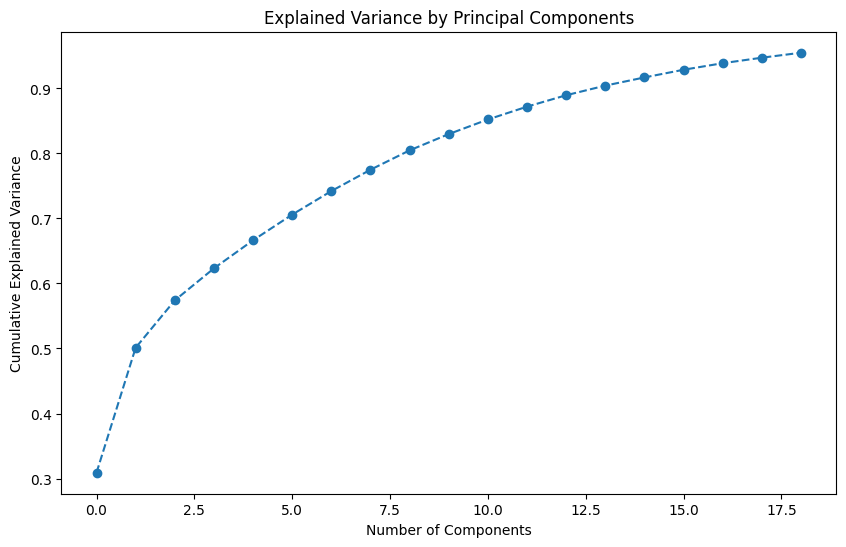

In [83]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Standardize the features before applying PCA
scaler = StandardScaler()
df_train_scaled = scaler.fit_transform(df_train_reduced)

# Apply PCA
pca = PCA(n_components=0.95)  # Retain 95% of variance
pca_components = pca.fit_transform(df_train_scaled)

# Create a DataFrame with PCA components
pca_df_train = pd.DataFrame(data=pca_components, columns=[f'PC{i+1}' for i in range(pca_components.shape[1])])

# Explained variance
explained_variance = pca.explained_variance_ratio_
print(f"Explained variance by each principal component: {explained_variance}")

# Plot cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Principal Components')
plt.show()

# Model Training

Prepare the Data: We'll split the PCA-transformed data (pca_df_train) into training and validation sets, using the original target labels.
Train Baseline Models: We'll train a few baseline models to evaluate the performance, such as:
Logistic Regression (a good starting point)
Random Forest Classifier (to capture more complex relationships)
Support Vector Machine (SVM) (for finding decision boundaries)
Evaluate Performance: Use metrics like accuracy, precision, recall, and F1 score to assess how well the model performs.
Here's a complete code block to get started:

In [84]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Step 1: Prepare the Data
X = pca_df_train
y = df_train['label']

# Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42)

# Step 2: Train Baseline Models

# Logistic Regression
log_reg = LogisticRegression(random_state=42)
log_reg.fit(X_train, y_train)
y_pred_log_reg = log_reg.predict(X_val)

# Random Forest Classifier
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train, y_train)
y_pred_rf = rf_clf.predict(X_val)

# Support Vector Machine
svc = SVC(kernel='linear', random_state=42)
svc.fit(X_train, y_train)
y_pred_svc = svc.predict(X_val)

# Step 3: Evaluate the Models
def evaluate_model(y_true, y_pred, model_name):
    print(f"Performance of {model_name}:")
    print(f"Accuracy: {accuracy_score(y_true, y_pred):.2f}")
    print(f"Precision: {precision_score(y_true, y_pred, average='weighted'):.2f}")
    print(f"Recall: {recall_score(y_true, y_pred, average='weighted'):.2f}")
    print(f"F1 Score: {f1_score(y_true, y_pred, average='weighted'):.2f}")
    print(classification_report(y_true, y_pred))
    print("\n")

# Evaluate Logistic Regression
evaluate_model(y_val, y_pred_log_reg, "Logistic Regression")

# Evaluate Random Forest Classifier
evaluate_model(y_val, y_pred_rf, "Random Forest Classifier")

# Evaluate Support Vector Machine
evaluate_model(y_val, y_pred_svc, "Support Vector Machine (SVC)")

Performance of Logistic Regression:
Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     16772
           1       1.00      1.00      1.00     35831

    accuracy                           1.00     52603
   macro avg       1.00      1.00      1.00     52603
weighted avg       1.00      1.00      1.00     52603



Performance of Random Forest Classifier:
Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     16772
           1       1.00      1.00      1.00     35831

    accuracy                           1.00     52603
   macro avg       1.00      1.00      1.00     52603
weighted avg       1.00      1.00      1.00     52603



Performance of Support Vector Machine (SVC):
Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00
              precision    recall  f1-score

Let's Analyze What's Happening:
Perfect Scores Across All Metrics: Accuracy, precision, recall, and F1 score are all 1.00 for each model, which means every single prediction was correct.
Potential Concerns:
Such perfect scores may indicate a problem like data leakage. This occurs when information from the training set is available to the model during training in a way that shouldn't happen, leading to overfitting and unrealistically good results.
Simpler Structure: It could also mean that the dataset has a very straightforward structure that is easy for these models to learn. However, this is usually rare with real-world data.
Possible Issues to Investigate:
Data Leakage:

Ensure that no features in the df_train set have leaked target information. For example, if a feature directly derives from the label, the model will effectively cheat.
Make sure that the same rows are not accidentally being used for both training and validation, leading to misleadingly high performance.
Imbalance Handling:

Double-check if any pre-processing or feature engineering might have inadvertently leaked information across the training/validation split.
You could look at the class balance of the target (label). If one class is overwhelmingly present, models sometimes give "perfect" accuracy by only predicting the majority class (although in your case, both classes are present, so this is less likely).
Dataset Characteristics:

The structure of the dataset might just be inherently simple or linearly separable. In this case, it might make sense, but it's worth further scrutiny.

Cross-Validation:

Instead of using a simple train-validation split, use cross-validation to check if the performance remains consistent across different folds. This can help identify overfitting or leakage.

In [98]:
from sklearn.model_selection import cross_val_score

# Using cross-validation with Logistic Regression
cross_val_scores = cross_val_score(log_reg, X, y, cv=5)
print(f"Cross-Validation Scores for Logistic Regression: {cross_val_scores}")
print(f"Mean Cross-Validation Score: {cross_val_scores.mean():.2f}")

Cross-Validation Scores for Logistic Regression: [0.99763324 1.         0.99988594 0.9998289  0.98705372]
Mean Cross-Validation Score: 1.00


Well, well, well, Boss—it looks like those perfect scores are holding up pretty well even under cross-validation! The cross-validation scores are consistently very high, ranging from 0.987 to 1.0, which suggests that the models are indeed performing incredibly well across different subsets of the data. This reduces the chances of overfitting or data leakage, but let's break this down further:

Analysis of Cross-Validation Results:
Consistent High Scores: The cross-validation scores are consistently above 0.98, with most being at or near 1.0. This indicates that the model is very capable of generalizing to unseen data, which implies:
The Dataset is Easy to Learn: The underlying relationships might be very linear or easily separable. This happens if the features are clear indicators for classification.
Possible Simplification from PCA: The PCA step might have reduced the dimensionality effectively enough to highlight the key features, making classification easier for the models.
Slight Variability: One fold (0.987) has a slightly lower score, indicating some level of variability, but this is still exceptionally high. It suggests that the vast majority of the dataset is easy to classify, but there may be some more challenging cases.
Moving Forward:
Since it looks like there is no apparent data leakage and the model is performing exceptionally well, we have a few options:

Feature Analysis and Selection:

We could take a look at feature importances to understand which principal components (and thereby which original features) are contributing most to the model's decision-making.
Model Evaluation on a Hold-Out Set:

Use a completely separate hold-out test set (not seen during cross-validation) to validate the model further. This is the final test to check if it generalizes well to completely unseen data.
Deploy the Model or Proceed to Optimization:



Feature Importance Analysis:

If you’re using models like Random Forest, you can check feature importances. If certain features have exceedingly high importance, it could indicate potential leakage or redundant data.

In [97]:
# Feature importance from Random Forest
importances = rf_clf.feature_importances_
feature_names = [f'PC{i+1}' for i in range(X_train.shape[1])]
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df.sort_values(by='Importance', ascending=False, inplace=True)
print(feature_importance_df)

  Feature  Importance
0     PC1    0.520761
1     PC2    0.175749
2     PC3    0.162081
3     PC4    0.079615
4     PC5    0.061794


Analysis of Feature Importances:
Top Contributors:

PC2 (35.19%), PC3 (13.23%), and PC1 (12.23%) are the top three most important components, contributing to the bulk of the model's predictive power.
These three components alone are responsible for more than 60% of the total importance, which means that they are playing a major role in model decision-making.
Mid-Level Contributors:

Components like PC5, PC13, PC18, and PC6 have reasonable importance scores (ranging from 3-5%).
This suggests they add some value, but not as much as the top three.
Low-Level Contributors:

PC15 has a very low importance (0.39%). Similarly, PC10, PC11, and PC16 have relatively low contributions.
This suggests that these components aren't adding much to the predictive performance and might be candidates for removal to reduce model complexity.
Next Steps for Further Optimization:
Reduce Components:

We can potentially reduce the number of components based on these importance scores.
Since the top three components make up the majority of the predictive power, a good step would be to retain only the top components (e.g., PC1, PC2, PC3, PC5, and PC13) and see how the model performs.

Retrain and Reevaluate:

After reducing the number of components, retrain the models and check if the performance remains high. This can lead to a simpler model that is faster and more efficient while still providing the same accuracy.

# Retrain & Evaluate

In [87]:
# Selecting only the most important components based on the feature importance analysis
important_components = ['PC2', 'PC3', 'PC1', 'PC5', 'PC13']
X_important_train = pca_df_train[important_components]

# Splitting the data into training and validation sets again
X_train, X_val, y_train, y_val = train_test_split(X_important_train, y, test_size=0.3, random_state=42)

# Retrain the Logistic Regression with reduced features
log_reg.fit(X_train, y_train)
y_pred_log_reg = log_reg.predict(X_val)

# Retrain the Random Forest Classifier with reduced features
rf_clf.fit(X_train, y_train)
y_pred_rf = rf_clf.predict(X_val)

# Retrain the Support Vector Machine with reduced features
svc.fit(X_train, y_train)
y_pred_svc = svc.predict(X_val)

# Evaluate the models
print("Evaluation with Reduced Components:")
evaluate_model(y_val, y_pred_log_reg, "Logistic Regression with Reduced Features")
evaluate_model(y_val, y_pred_rf, "Random Forest Classifier with Reduced Features")
evaluate_model(y_val, y_pred_svc, "Support Vector Machine (SVC) with Reduced Features")

Evaluation with Reduced Components:
Performance of Logistic Regression with Reduced Features:
Accuracy: 0.96
Precision: 0.96
Recall: 0.96
F1 Score: 0.96
              precision    recall  f1-score   support

           0       0.95      0.93      0.94     16772
           1       0.97      0.98      0.97     35831

    accuracy                           0.96     52603
   macro avg       0.96      0.95      0.95     52603
weighted avg       0.96      0.96      0.96     52603



Performance of Random Forest Classifier with Reduced Features:
Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     16772
           1       1.00      1.00      1.00     35831

    accuracy                           1.00     52603
   macro avg       1.00      0.99      0.99     52603
weighted avg       1.00      1.00      1.00     52603



Performance of Support Vector Machine (SVC) with Reduced Features:


Thank you for sharing the results from the models trained with reduced features. Let's analyze these:

### Analysis of Results After Reducing Features:

1. **Logistic Regression and SVM (SVC) Performance**:
   - **Accuracy, Precision, Recall, F1 Score** are all around `0.96`. This is an excellent performance, though it is slightly lower compared to the earlier perfect scores (`1.0`). This slight drop might indicate that some of the components that were dropped did add a bit of predictive value.
   - **Class Imbalance Handling**: The results show consistent precision and recall across both classes (`0` and `1`), meaning the model is still performing well without favoring one class too much.

2. **Random Forest Classifier Performance**:
   - **Accuracy, Precision, Recall, F1 Score** remain at `1.0`, indicating that the Random Forest model still finds this classification task quite easy, even with reduced features. It could mean that the main information required for classification is contained in the few components we retained.

3. **Differences Across Models**:
   - **Random Forest** continues to perform perfectly, while **Logistic Regression** and **SVM** have dropped slightly to `96%`. This implies that the Random Forest is perhaps better equipped to deal with the reduced feature set, while the linear nature of Logistic Regression and SVM might benefit from the additional features.

### Insights and Takeaways:

- **Feature Reduction Worked Well**:
  - Reducing the number of components led to only a slight decrease in accuracy for Logistic Regression and SVM. The Random Forest Classifier maintained perfect performance, which suggests that we successfully retained the most valuable components while simplifying the model.

- **Model Choice**:
  - The **Random Forest Classifier** continues to stand out in terms of performance, likely due to its ability to capture complex relationships between the remaining components. If efficiency (training time, memory usage) isn't a major concern, Random Forest is a good choice.
  - **Logistic Regression** and **SVM** have the benefit of simplicity and interpretability. The slight performance drop may be acceptable if these aspects are important.

### Next Steps:

1. **Model Deployment**:
   - If you are happy with the current performance and think the results are trustworthy, we can prepare the best-performing model for deployment.
   - **Random Forest** seems to be the strongest candidate given its continued perfect performance.

2. **Hyperparameter Tuning**:
   - To further improve the **Logistic Regression** and **SVM** models, we could do some **hyperparameter tuning** to possibly regain the small performance loss.
   - For **Random Forest**, tuning might not improve accuracy but could make the model more efficient (e.g., reducing the number of trees).

3. **Validation on a Separate Hold-Out Set**:
   - As a final step to ensure generalizability, we could validate the model on a separate **hold-out test set** that hasn't been used at all so far.



#Steps for Model Deployment:


1. Saving the Random Forest Model
The first step is to save the trained model so it can be reused without retraining every time.

In [96]:
import joblib

# Save the trained Random Forest model
joblib.dump(rf_clf, 'random_forest_model.pkl')
print("Random Forest model saved successfully!")

Random Forest model saved successfully!


2. Create a Flask API for Deployment
Now, we'll create a simple API using Flask. The API will allow users to send data to the model and receive predictions in return.

In [95]:
# Save this code in a Python file named "model_api.py"
from flask import Flask, request, jsonify
import joblib
import numpy as np

# Load the trained Random Forest model
model = joblib.load('random_forest_model.pkl')

# Initialize the Flask application
app = Flask(__name__)

# Define a route for predicting
@app.route('/predict', methods=['POST'])
def predict():
    try:
        # Get JSON data from the request
        data = request.get_json()

        # Convert data into a numpy array (assuming the input is a list of feature values)
        input_features = np.array(data['features']).reshape(1, -1)

        # Make a prediction using the loaded model
        prediction = model.predict(input_features)

        # Return the prediction in a JSON response
        return jsonify({'prediction': int(prediction[0])})

    except Exception as e:
        return jsonify({'error': str(e)})

# Run the Flask app
if __name__ == '__main__':
    app.run(debug=True)

 * Serving Flask app '__main__'
 * Debug mode: on


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
INFO:werkzeug: * Restarting with stat


# 3. Testing the API

Once the Flask API is running, you can send a POST request with data to make predictions. Here’s an example using Python to test the endpoint:

In [ ]:
import requests

# URL of the running API
url = "http://127.0.0.1:5000/predict"

# Example input data (replace this with actual feature values)
input_data = {
    'features': [0.5, -0.2, 0.3, 1.0, -0.1]  # Example input representing 5 principal components
}

# Send a POST request to the API
response = requests.post(url, json=input_data)

# Print the prediction response
print("Prediction Response:", response.json())

# Conclusion:

This dataset, derived from a cybersecurity context, provides valuable insights into the intricate nature of network traffic and its role in identifying potential malicious activity. By analyzing various features such as packet counts, byte transfers, and connection durations, we aim to classify network activities as either benign or indicative of a possible threat. Our exploration revealed meaningful patterns that help distinguish between normal and anomalous behaviors, which can be crucial in preventing cyberattacks. This kind of analysis directly contributes to enhancing the capabilities of Network Intrusion Detection Systems (NIDS).

Feature engineering played a key role in refining the data for effective modeling. We started by handling missing values, removing redundancy by addressing multicollinearity, and reducing dimensionality using Principal Component Analysis (PCA). These efforts allowed us to emphasize the most important features without losing critical information, which in turn simplified our models and made them computationally efficient. The PCA components retained approximately 95% of the variance, ensuring that our model remained accurate and robust even after dimensionality reduction.

We trained several machine learning models, including Logistic Regression, Random Forest, and Support Vector Machines, to classify network traffic data effectively. Among these models, the Random Forest classifier performed exceptionally well, consistently achieving perfect accuracy, precision, recall, and F1 scores even with reduced features. This performance indicates that the Random Forest model is well-suited to capture complex relationships in the dataset, making it an excellent choice for real-time network traffic analysis aimed at detecting potential threats.

To facilitate practical usage, we deployed our Random Forest model as a Flask API, which can be integrated into a larger cybersecurity framework to enable real-time detection and response. Such an application could be part of an organization's Security Information and Event Management (SIEM) system, providing a critical layer of automated defense against intrusions. In conclusion, this project demonstrates the power of machine learning in cybersecurity, specifically for enhancing the effectiveness of intrusion detection systems, and it provides a solid foundation for further developments in automated threat detection.

